# Telecom Churn Case Study 

# Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

 

For many incumbent operators, retaining high profitable customers is the number one business goal.

 

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

 

In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

 

## Steps to be followed

1. Data Understanding
2. Data Cleaning
3. Filtering High Value Customers
4. Creating target Variable
5. Deriving New Features
6. Handling Missing values
7. Data Visualization-Univariate Analysis
6. Data Visualization- Bivariate Analysis
7. Outlier Detection
8. Data Preparation
9. Data Modeling and Eavlaution
    - Non-Interpretable Models
    - Interpretable Models
10. Conclusion

## **1. Data Understanding**

In [1]:
%%HTML
<style type="text/css">
table.dataframe td, table.dataframe th {
    border: 1px  black solid !important;
  color: black !important;
}
</style>

In [2]:
#Importing Data Reading and Processing Libraries
import pandas as pd
import numpy as np

#Imporitng Data Visualization Libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#Importing Data Preparation and Modeling Libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold, GridSearchCV,StratifiedKFold
from sklearn.metrics import accuracy_score, recall_score, classification_report,confusion_matrix,roc_auc_score,roc_curve
from sklearn.decomposition import PCA

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

#Importing Warning Libraries
import warnings
warnings.filterwarnings("ignore")

#Importing Miscellaneous Libraries
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
pd.set_option('display.width', None)

# Import the StandardScaler()
from sklearn.preprocessing import StandardScaler

#Improting the PCA module
from sklearn.decomposition import PCA

# For Hopkins test
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan

# For clustering 
## using KMeans ##
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

## using Hierarchical ##
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

# Importing required packages for visualization
from IPython.display import Image  
from sklearn.tree import export_graphviz
from sklearn.svm import SVC

# Other sklearn packages
import sklearn.metrics as metrics
from sklearn.tree import DecisionTreeClassifier

from datetime import date,datetime
import math
import multiprocessing

In [3]:
#Loading the Dataset

df = pd.read_csv('E:/Business analyst/Telecom CS assignment/telecom_churn_data.csv')
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [4]:
df.shape

(99999, 226)

In [5]:
df.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    mobile_number             int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    last_date_of_month_9      object 
 9    arpu_6                    float64
 10   arpu_7                    float64
 11   arpu_8                    float64
 12   arpu_9                    float64
 13   onnet_mou_6               float64
 14   onnet_mou_7               float64
 15   onnet_mou_8               float64
 16   onnet_mou_9               float64
 17   offnet_mou_6              float64
 18   offnet_mou_7              float64
 19   offnet_mou_8              float64
 20   offn

In [6]:
#Lets check how the data is spread
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

##  2.**Data cleaning**

In [7]:
# There are some columns representing volume based users have month specified in their name, while all other columns have used numbers `6,7,8,9` indicating month name
month = ['aug_vbc_3g','jul_vbc_3g','jun_vbc_3g','sep_vbc_3g']
df = df.rename(columns = {'aug_vbc_3g':'3g_vbc_8','jul_vbc_3g':'3g_vbc_7','jun_vbc_3g':'3g_vbc_6','sep_vbc_3g':'3g_vbc_9'})


In [8]:
# Converting the date columns to date time format

date_col= [col for col in df.columns if 'date' in col]

for i in df[date_col]:
    df[i] = pd.to_datetime(df[i])


Columns that have just one unique value for all the customers do not really imply anything. Hence removing columns with zero variance from our dataset.

In [9]:
# Dropping columns that have only one unique values for all the leads.
cols = []
for i in df.columns:
    if df[i].nunique() ==1:
        cols.append(i)
df = df.drop(cols,1)
df.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,3g_vbc_8,3g_vbc_7,3g_vbc_6,3g_vbc_9
0,7000842753,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,2014-09-28,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,NaT,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1

In [10]:
# Let us also drop mobile number column
df = df.drop('mobile_number',1)

In [11]:
# Create an id column for identification of each customer
df = df.reset_index()
df = df.rename(columns = {'index':'cust_id'})
df['cust_id'] = df['cust_id']+1
df.head()

,cust_id,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,3g_vbc_8,3g_vbc_7,3g_vbc_6,3g_vbc_9
0,1,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,2014-09-28,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,NaT,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4

In [12]:
df.shape

(99999, 210)

Let us check if there are any categorical columns in our dataset. We can check that by finding if any columns have just 2 unique values `1` & `0`. These values analogous to `yes` & `no` respectively.

In [13]:
# Let us create a seperate category for categorical columns
cat_cols = []

for i in df.columns:
    if df[i].nunique()==2:
        cat_cols.append(i)
cat_cols 

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'night_pck_user_9',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'fb_user_9']

 ### <a>Some important insights

- ### Average revenue of call per user 

    We observe that the minimum values in arpu_6, arpu_7, arpu_8 & arpu_9 are negative. This indicates that some customers are making loss to the company. We will retain them in our study as our criteria of high value customer is based on `usage base churn` and not on `revenue based churn`. Removing them might lead to loss of some meaningful insights. Let us observe their importance in the exploratory data aanalysis part and then take a call.

- ### Sachet recharge
`sachet recharge` are Service schemes with validity smaller than a month. This means that the days of recahrge in sachet recharge should be less than 30. Any service schemes beyond 29 days should mean that the client has done a monyhly recharge or the entry is wrong. Let us `cap the values beyond 29 days` by the highest number of days recharge below 30 days.

In [14]:
df['sachet_2g_6'] = df['sachet_2g_6'].clip(0,28)
df['sachet_2g_7'] = df['sachet_2g_7'].clip(0,29)
df['sachet_2g_8'] = df['sachet_2g_8'].clip(0,29)
df['sachet_3g_7'] = df['sachet_3g_7'].clip(0,24)
df['sachet_3g_8'] = df['sachet_3g_8'].clip(0,29)

In [15]:
df.shape

(99999, 210)

## 3.**Filtering High Value customers**

Those who have recharged with an amount more than or equal to X, where X is greater than 70th percentile of the average recharge amount in the first two months (the good phase)

In [16]:
#Derive Total data rech columns describing data rechatrge amount

df['total_data_rech_6'] = df['av_rech_amt_data_6']* df['total_rech_data_6']
df['total_data_rech_7'] = df['av_rech_amt_data_7']* df['total_rech_data_7']
df['total_data_rech_8'] = df['av_rech_amt_data_8']* df['total_rech_data_8']
df['total_data_rech_9'] = df['av_rech_amt_data_9']* df['total_rech_data_9']

Total recharge amount spent in the 6th &  7th month(Good Phase) and the 8th &  9th month

In [17]:
df['total_amt_6'] = df[['total_rech_amt_6', 'total_data_rech_6']].sum(axis=1)
df['total_amt_7'] = df[['total_rech_amt_7', 'total_data_rech_7']].sum(axis=1)
df['total_amt_8'] = df[['total_rech_amt_8', 'total_data_rech_8']].sum(axis=1)
df['total_amt_9'] = df[['total_rech_amt_9', 'total_data_rech_9']].sum(axis=1)

Defining total average recharge amount for the good phase for months 6 and 7 (the good phase)

In [18]:
df['rech_amt_good_yr'] = df[['total_amt_6', 'total_amt_7']].sum(axis=1)
df['avg_rech_amt_good_yr'] = round(df['rech_amt_good_yr']/2,2)

In [19]:
df.head()

,cust_id,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,3g_vbc_8,3g_vbc_7,3g_vbc_6,3g_vbc_9,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_data_rech_9,total_amt_6,total_amt_7,total_amt_8,total_amt_9,rech_amt_good_yr,avg_rech_amt_good_yr
0,1,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,2014-09-28,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,NaT,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.3

In [20]:
perc = df['avg_rech_amt_good_yr'].dropna().quantile(0.7)
perc

478.0

In [21]:
# Filtering high value customers
high_val = df.loc[df['avg_rech_amt_good_yr'] >= perc]
high_val.head()

,cust_id,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,3g_vbc_8,3g_vbc_7,3g_vbc_6,3g_vbc_9,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_data_rech_9,total_amt_6,total_amt_7,total_amt_8,total_amt_9,rech_amt_good_yr,avg_rech_amt_good_yr
0,1,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,4,3,2,6,362,252,252,0,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,2014-09-28,252,252,252,0,2014-06-21,2014-07-16,2014-08-08,NaT,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,

In [22]:
## We can drop the total_rech_data &  av_rech_amt_data columns for all the months as we have derived new columns using these columns
del_col = ["total_rech_data_6", "total_rech_data_7", "total_rech_data_8", "av_rech_amt_data_6", "av_rech_amt_data_7", "av_rech_amt_data_8"]

high_val = high_val.drop(del_col,1)

## We can also drop the the average recharge amount of the good phase
high_val = high_val.drop('avg_rech_amt_good_yr',1) 

In [23]:
high_val.shape

(30001, 213)

## 4.**Creating Target Variable** 

- ### **Tag churners and remove attributes of the churn phase**
- ### Tagging the churned customers (churn=1, else 0) based on the fourth month as follows: <br>

Those who have `not made any calls (either incoming or outgoing)` AND have `not used mobile internet even once in the churn phase`. The attributes we need to use to tag churners are:<br>

 - total_ic_mou_9<br>
 - total_og_mou_9<br>
 - vol_2g_mb_9<br>
 - vol_3g_mb_9<br>

In [24]:
# let us filter churned customers based on the fourth month

high_val['churn'] = high_val.apply(lambda x: 1 if (x.total_ic_mou_9 == 0 and x.total_og_mou_9 == 0 and x.vol_2g_mb_9 ==0 and x.vol_3g_mb_9==0) else 0, axis=1)
high_val['churn'] = high_val['churn'].astype("str")
high_val.shape

(30001, 214)

In [25]:
# Let us see teh number of churned customers
high_val['churn'].value_counts()

0    27560
1     2441
Name: churn, dtype: int64

In [26]:
# let us check what's the % of churned customers
print("The Percentage of churned customers is:" , round(100*(high_val.churn.astype("int").sum()/len(high_val)),2))

The Percentage of churned customers is: 8.14


After tagging churners, let us remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names)

In [27]:
col_9 = [i for i in high_val.columns if '9' in i]
high_val = high_val.drop(col_9,1)
high_val.shape

(30001, 160)

In [28]:
# let us update our categorical column list

cat_cols = [ele for ele in cat_cols if ele not in col_9]


## 5.Deriving new features

In [29]:
#Conevrt AON in Months
high_val['aon_yr'] = round((high_val['aon']/365),1)


In [30]:
high_val.drop('aon', axis=1, inplace=True)
high_val.head()

,cust_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,churn,aon_yr
0,1,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,4.13,NaN,NaN,1.15,NaN,NaN,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,0.00,0.00,5.44,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,4,3,2,362,252,252,252,252,252,2014-06-21,2014-07-16,2014-08-08,252,252,252,2014-06-21,2014-07-16,2014-08-08,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1118.0,1,2.7
7,8,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,2014-06-27,2014-07-25,2014-08-26,0,0,779,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,57.74,19.38,18.74,NaN,NaN,NaN,1580.0,790.0,3638.0,2370.0,1,2.2
8,9,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.

Let us create bins for our age of network column that explains the `years since when a particular client is using the T network.`

In [31]:
age_range = [ 0,  2,  4,  6,  8, 10, 12]
age_bin = [ 1, 2, 3, 4, 5, 6]
high_val['age_group'] = pd.cut(high_val['aon_yr'], age_range, labels=age_bin)
high_val['age_group'] = high_val['age_group'].astype(str)
high_val['age_group'].head()

0     2
7     2
8     1
21    1
23    1
Name: age_group, dtype: object

In [32]:
# let us update our categorical column list

cat_cols.append('age_group')
cat_cols

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'age_group']

## 6.Handling Missing values

 ### a) Checking missing values

In [33]:
# Now Checking Null values
null = round(100*(high_val.isnull().sum()/len(high_val.index)),2).sort_values(ascending = False)
null = null[null!=0]
null

night_pck_user_8            46.83
arpu_3g_8                   46.83
max_rech_data_8             46.83
count_rech_2g_8             46.83
fb_user_8                   46.83
count_rech_3g_8             46.83
arpu_2g_8                   46.83
total_data_rech_8           46.83
date_of_last_rech_data_8    46.83
arpu_2g_6                   44.15
total_data_rech_6           44.15
arpu_3g_6                   44.15
date_of_last_rech_data_6    44.15
count_rech_3g_6             44.15
night_pck_user_6            44.15
count_rech_2g_6             44.15
fb_user_6                   44.15
max_rech_data_6             44.15
total_data_rech_7           43.15
fb_user_7                   43.15
date_of_last_rech_data_7    43.15
count_rech_2g_7             43.15
count_rech_3g_7             43.15
arpu_3g_7                   43.15
arpu_2g_7                   43.15
night_pck_user_7            43.15
max_rech_data_7             43.15
std_og_mou_8                 3.91
std_ic_t2t_mou_8             3.91
spl_og_mou_8  

  ### b) Imputation of missing values

 - #### Recharge columns in Good and Action Phase

In [34]:
# Let us observe missing values in recharge columns 
rech_col = [i for i in high_val.columns if 'rech' in i]
rech_6_col = [i for i in rech_col if '6' in i]
rech_7_col = [i for i in rech_col if '7' in i]
rech_8_col = [i for i in rech_col if '8' in i]

`Recharge columns for month- 6(June)`

In [35]:
# Let us observe missing values in recharge columns in the month of june(6)
rech_6 = pd.DataFrame(high_val[rech_6_col])

# adding some other columns describing data usage of customer in june(6)
vol_col = high_val[["vol_2g_mb_6",'vol_3g_mb_6']]

rech_6 = pd.concat([rech_6,vol_col], axis = 1) 
rech_6.head(10)

,total_rech_num_6,total_rech_amt_6,max_rech_amt_6,date_of_last_rech_6,date_of_last_rech_data_6,max_rech_data_6,count_rech_2g_6,count_rech_3g_6,total_data_rech_6,vol_2g_mb_6,vol_3g_mb_6
0,4,362,252,2014-06-21,2014-06-21,252.0,0.0,1.0,252.0,30.13,83.57
7,5,1580,1580,2014-06-27,NaT,NaN,NaN,NaN,NaN,0.00,0.00
8,19,437,90,2014-06-25,NaT,NaN,NaN,NaN,NaN,0.00,0.00
21,22,600,50,2014-06-30,NaT,NaN,NaN,NaN,NaN,0.00,0.00
23,3,0,0,2014-06-18,NaT,NaN,NaN,NaN,NaN,0.00,0.00
33,7,1058,252,2014-06-30,2014-06-30,252.0,0.0,5.0,5285.0,87.05,3509.90
38,27,420,30,2014-06-30,NaT,NaN,NaN,NaN,NaN,0.00,0.00
41,4,496,150,2014-06-24,NaT,NaN,NaN,NaN,NaN,0.00,0.00
48,13,2317,250,2014-06-29,NaT,NaN,NaN,NaN,NaN,0.00,0.00
53,24,1159,120,2014-06-29,2014-06-29,23.0,4.0,0.0,344.0,0.27,0.00


<a> From the above table we can see that whenever the date of last recharge is missing, all the corresponding values for max_rech, count_rech_2g & 3g are missing. The mobile internet usage(2G & 3G data) corresponding to these values is zero as seen from the above table. Thus let us impute these missing values by zero, considering there were no recharges done by the customer.

`Recharge columns for month- 7(July)`

In [36]:
# Similarly Let us observe missing values in recharge columns for the month of july(7)

rech_7_col

['total_rech_num_7',
 'total_rech_amt_7',
 'max_rech_amt_7',
 'date_of_last_rech_7',
 'date_of_last_rech_data_7',
 'max_rech_data_7',
 'count_rech_2g_7',
 'count_rech_3g_7',
 'total_data_rech_7']

In [37]:
rech_7 = pd.DataFrame(high_val[rech_7_col])

# adding some other columns describing data usage of customer in july
vol_col = high_val[["vol_2g_mb_7",'vol_3g_mb_7']]

rech_7 = pd.concat([rech_7,vol_col], axis = 1) 
rech_7.head(10)

,total_rech_num_7,total_rech_amt_7,max_rech_amt_7,date_of_last_rech_7,date_of_last_rech_data_7,max_rech_data_7,count_rech_2g_7,count_rech_3g_7,total_data_rech_7,vol_2g_mb_7,vol_3g_mb_7
0,3,252,252,2014-07-16,2014-07-16,252.0,0.0,1.0,252.0,1.32,150.76
7,5,790,790,2014-07-25,NaT,NaN,NaN,NaN,NaN,0.00,0.00
8,21,601,154,2014-07-31,2014-07-31,154.0,2.0,0.0,354.0,356.00,750.95
21,26,680,50,2014-07-31,NaT,NaN,NaN,NaN,NaN,0.00,0.00
23,5,454,179,2014-07-07,2014-07-07,179.0,0.0,2.0,712.0,0.48,599.09
33,14,2806,1255,2014-07-30,2014-07-28,1255.0,0.0,8.0,20424.0,57.76,8154.65
38,22,636,110,2014-07-28,NaT,NaN,NaN,NaN,NaN,0.00,0.00
41,4,510,150,2014-07-22,NaT,NaN,NaN,NaN,NaN,0.00,0.00
48,5,580,250,2014-07-23,NaT,NaN,NaN,NaN,NaN,0.00,0.00
53,26,1372,150,2014-07-31,2014-07-26,23.0,5.0,0.0,575.0,0.00,0.00


<a> From the above table we can see that whenever the date of last recharge is missing, all the corresponding values for max_rech, count_rech_2g & 3g are missing. The mobile internet usage(2G & 3G data) corresponding to these values is zero as seen from the above table. Thus let us impute these missing values by zero,Considering there were no recharges done by the customer. This is similar to the pattern observed for june month.

`Recharge columns for month- 8(August)`

In [38]:
# Similarly Let us observe missing values in recharge columns in the month of August(8)

rech_8_col

['total_rech_num_8',
 'total_rech_amt_8',
 'max_rech_amt_8',
 'date_of_last_rech_8',
 'date_of_last_rech_data_8',
 'max_rech_data_8',
 'count_rech_2g_8',
 'count_rech_3g_8',
 'total_data_rech_8']

In [39]:
rech_8 = pd.DataFrame(high_val[rech_8_col])

# adding some other columns describing data usage of customer in August
vol_col = high_val[["vol_2g_mb_8",'vol_3g_mb_8']]

rech_8 = pd.concat([rech_8,vol_col], axis = 1) 
rech_8.head(10)

,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,date_of_last_rech_8,date_of_last_rech_data_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,total_data_rech_8,vol_2g_mb_8,vol_3g_mb_8
0,2,252,252,2014-08-08,2014-08-08,252.0,0.0,1.0,252.0,5.75,109.61
7,7,3638,1580,2014-08-26,NaT,NaN,NaN,NaN,NaN,0.00,0.00
8,14,120,30,2014-08-30,2014-08-23,23.0,3.0,0.0,207.0,0.03,11.94
21,27,718,50,2014-08-31,NaT,NaN,NaN,NaN,NaN,0.00,0.00
23,4,439,179,2014-08-24,2014-08-06,179.0,0.0,2.0,540.0,0.01,1009.92
33,1,455,455,2014-08-26,2014-08-26,455.0,0.0,1.0,455.0,7.97,7701.01
38,6,416,130,2014-08-24,NaT,NaN,NaN,NaN,NaN,0.00,0.00
41,3,410,150,2014-08-31,NaT,NaN,NaN,NaN,NaN,0.00,0.00
48,3,197,130,2014-08-28,NaT,NaN,NaN,NaN,NaN,0.00,0.00
53,14,775,130,2014-08-26,2014-08-02,23.0,1.0,0.0,23.0,0.00,0.00


<a> Similar to june & july month, from the above table we can see that whenever the date of last recharge is missing, all the corresponding values for max_rech, count_rech_2g & 3g are missing. The mobile internet usage(2G & 3G data) corresponding to these values is zero as seen from the above table. Thus let us impute these missing values by zero.,considering there were no recharges done by the customer.This is exactly similar to the pattern observed for june & july month.

In [40]:
# let us impue the missing values in these recharge columns by zero.

impute_0 = [ 'date_of_last_rech_data_6','max_rech_data_6','count_rech_2g_6','count_rech_3g_6','total_data_rech_6',
           'date_of_last_rech_data_7','max_rech_data_7','count_rech_2g_7','count_rech_3g_7','total_data_rech_7',
           'date_of_last_rech_data_8','max_rech_data_8','count_rech_2g_8','count_rech_3g_8','total_data_rech_8']

high_val[impute_0] = high_val[impute_0].apply(lambda x: x.fillna(0))

In [41]:
# Now Checking Null values
null = round(100*(high_val.isnull().sum()/len(high_val.index)),2).sort_values(ascending = False)
null = null[null!=0]
null

arpu_3g_8              46.83
fb_user_8              46.83
arpu_2g_8              46.83
night_pck_user_8       46.83
arpu_3g_6              44.15
fb_user_6              44.15
arpu_2g_6              44.15
night_pck_user_6       44.15
arpu_3g_7              43.15
arpu_2g_7              43.15
fb_user_7              43.15
night_pck_user_7       43.15
std_ic_t2t_mou_8        3.91
std_og_t2t_mou_8        3.91
std_og_t2m_mou_8        3.91
std_ic_t2m_mou_8        3.91
loc_ic_mou_8            3.91
std_ic_t2f_mou_8        3.91
std_og_t2f_mou_8        3.91
loc_ic_t2m_mou_8        3.91
std_og_mou_8            3.91
loc_ic_t2f_mou_8        3.91
std_ic_mou_8            3.91
isd_og_mou_8            3.91
loc_ic_t2t_mou_8        3.91
spl_og_mou_8            3.91
loc_og_mou_8            3.91
spl_ic_mou_8            3.91
loc_og_t2c_mou_8        3.91
loc_og_t2t_mou_8        3.91
onnet_mou_8             3.91
og_others_8             3.91
offnet_mou_8            3.91
loc_og_t2f_mou_8        3.91
roam_ic_mou_8 

 - #### Imputing Categorical columns

In [42]:
# Let us impute the missing values in categorical columns by (-1). 
high_val[cat_cols] = high_val[cat_cols].apply(lambda x: x.fillna(-1)) 
high_val[cat_cols] = high_val[cat_cols].astype('str')
high_val[cat_cols].head()

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8,age_group
0,0.0,0.0,0.0,1.0,1.0,1.0,2
7,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,2
8,-1.0,0.0,0.0,-1.0,1.0,1.0,1
21,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,1
23,-1.0,0.0,0.0,-1.0,1.0,1.0,1


In [43]:
# Now Checking Null values
null = round(100*(high_val.isnull().sum()/len(high_val.index)),2).sort_values(ascending = False)
null = null[null!=0]
null

arpu_3g_8              46.83
arpu_2g_8              46.83
arpu_3g_6              44.15
arpu_2g_6              44.15
arpu_3g_7              43.15
arpu_2g_7              43.15
loc_ic_t2f_mou_8        3.91
std_ic_t2m_mou_8        3.91
loc_og_t2c_mou_8        3.91
std_ic_t2t_mou_8        3.91
loc_og_mou_8            3.91
loc_ic_mou_8            3.91
std_og_t2t_mou_8        3.91
loc_ic_t2t_mou_8        3.91
loc_ic_t2m_mou_8        3.91
std_og_t2m_mou_8        3.91
std_ic_t2f_mou_8        3.91
std_og_t2f_mou_8        3.91
og_others_8             3.91
std_og_mou_8            3.91
spl_og_mou_8            3.91
loc_og_t2f_mou_8        3.91
isd_og_mou_8            3.91
onnet_mou_8             3.91
std_ic_mou_8            3.91
loc_og_t2t_mou_8        3.91
offnet_mou_8            3.91
spl_ic_mou_8            3.91
roam_og_mou_8           3.91
loc_og_t2m_mou_8        3.91
isd_ic_mou_8            3.91
roam_ic_mou_8           3.91
ic_others_8             3.91
date_of_last_rech_8     1.94
spl_og_mou_6  

- ### Dropping columns with missing values more than 40%

The average revenue per user for both the phases - good & action phase, have more than 40% missing values. Since our study revolves around the identification of customers that are likely to churn taking into account only usage based churn, we can safely drop these columns without affecting our study.

In [44]:
miss = round(100*(high_val.isnull().sum()/len(high_val.index)),2).sort_values(ascending = False) 

# Let us not delete data from 9th month
miss = pd.DataFrame(miss[miss >= 40])
threshold_col = miss.index

high_val = high_val.drop(threshold_col,1)

In [45]:
high_val.shape

(30001, 155)

 - #### Let us observe outgoing minutes of usage for local, standard, special and others

`month-june(6)`

In [46]:
# From the business domain knowledge, we know that total_og column is the addition of local , standard, special andd other outgoing calls
og_call_6 = ['loc_og_mou_6','std_og_mou_6','isd_og_mou_6','spl_og_mou_6','og_others_6','total_og_mou_6']
total_og_6 = high_val[og_call_6]
# filtering only those clients who have made no outgoing calls
total_og_6.loc[total_og_6['total_og_mou_6']==0].head()

,loc_og_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6
0,NaN,NaN,NaN,NaN,NaN,0.0
33,0.0,0.0,0.0,0.0,0.0,0.0
67,0.0,0.0,0.0,0.0,0.0,0.0
77,NaN,NaN,NaN,NaN,NaN,0.0
91,0.0,0.0,0.0,0.0,0.0,0.0


<a>Thus, we can coclude from the business domain knowledge and above table that when the total outgoing calls are zero, no outgoing calls have been made in that month. We can impute the missing values in the columns of local outgoing calls, standard outgoing calls, special outgoing calls & other outgoing calls by `0`.

In [47]:
#Lets verify is our assumption right or not, sum of all outgoing calls is equal to the the tota_og_mou_6

df['outgoing_total_6'] = df['loc_og_mou_6']+ df['std_og_mou_6']+df['isd_og_mou_6']+df['spl_og_mou_6']+df['og_others_6']
df[['outgoing_total_6','total_og_mou_6']].dropna().corr()

,outgoing_total_6,total_og_mou_6
outgoing_total_6,1.0,1.0
total_og_mou_6,1.0,1.0


From above we can clearly see that these are correlated and hence when the total outgoing calls are zero, no outgoing calls have been made in that month. We can impute the missing values in the columns of local outgoing calls, standard outgoing calls, special outgoing calls & other outgoing calls by 0.

In [48]:
# Imputing by '0'
high_val[og_call_6] = high_val[og_call_6].fillna(0)

From the dataset, it is evident that local outgoing calls in `any month` are equal to the `sum of all the types of local outgoing calls` i.e. (T2T,T2M,T2F & T2C)

In [49]:
og_loc_6 = ['loc_og_t2t_mou_6','loc_og_t2m_mou_6','loc_og_t2f_mou_6','loc_og_t2c_mou_6','loc_og_mou_6']
loc_og_6 = high_val[og_loc_6]

# filtering only those clients who have made no local outgoing calls
loc_og_6.loc[loc_og_6 ['loc_og_mou_6']==0].head()

,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6
0,NaN,NaN,NaN,NaN,0.0
33,0.0,0.0,0.0,0.0,0.0
67,0.0,0.0,0.0,0.0,0.0
77,NaN,NaN,NaN,NaN,0.0
91,0.0,0.0,0.0,0.0,0.0


<a> If the total local outgoing  calls made in any month are zero, then it means that no type of local calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [50]:
#Lets verify is our assumption right or not, sum of all local outgoing calls is equal to the the total local outgoing call
#"loc_og_mou_6"

df['loc_outgoing_total_6'] = df['loc_og_t2t_mou_6']+ df['loc_og_t2m_mou_6']+df['loc_og_t2f_mou_6']+df['loc_og_t2c_mou_6']
df[['loc_outgoing_total_6','loc_og_mou_6']].dropna().corr().round()

,loc_outgoing_total_6,loc_og_mou_6
loc_outgoing_total_6,1.0,1.0
loc_og_mou_6,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [51]:
# Imputing by '0'
high_val[og_loc_6] = high_val[og_loc_6].fillna(0)

From the dataset, it is evident that std outgoing calls in `any month` are equal to the `sum of all the types of std outgoing calls` i.e. (T2T,T2M,T2F & T2C)

In [52]:
og_std_6 = ['std_og_t2t_mou_6','std_og_t2m_mou_6','std_og_t2f_mou_6','std_og_mou_6']
std_og_6 = high_val[og_std_6]
std_og_6.head()

,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6
0,NaN,NaN,NaN,0.00
7,4.30,49.89,6.66,60.86
8,116.56,13.69,0.00,130.26
21,97.93,665.36,0.00,763.29
23,0.00,2.36,0.00,2.36


<a> If the total standard outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [53]:
#Lets verify is our assumption right or not, sum of all std outgoing calls is equal to the the total std outgoing call
#"std_og_mou_6"

df['std_outgoing_total_6'] = df['std_og_t2t_mou_6']+ df['std_og_t2m_mou_6']+df['std_og_t2f_mou_6']
df[['std_outgoing_total_6','std_og_mou_6']].dropna().corr().round()

,std_outgoing_total_6,std_og_mou_6
std_outgoing_total_6,1.0,1.0
std_og_mou_6,1.0,1.0


From above we can clearly see that these are correlated and hence if the total std outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. T2T,T2M,T2F & T2C

In [54]:
# Imputing by '0'
high_val[og_std_6] = high_val[og_std_6].fillna(0)

`month-july(7)`

In [55]:
# From the business domain knowledge, we know that total_og column is the addition of local , standard, special and other outgoing calls
og_call_7 = ['loc_og_mou_7','std_og_mou_7','isd_og_mou_7','spl_og_mou_7','og_others_7','total_og_mou_7']
total_og_7 = high_val[og_call_7]
# filtering only those clients who have made no outgoing calls
total_og_7.loc[total_og_7['total_og_mou_7']==0].head()

,loc_og_mou_7,std_og_mou_7,isd_og_mou_7,spl_og_mou_7,og_others_7,total_og_mou_7
0,NaN,NaN,NaN,NaN,NaN,0.0
33,0.0,0.0,0.0,0.0,0.0,0.0
67,0.0,0.0,0.0,0.0,0.0,0.0
104,0.0,0.0,0.0,0.0,0.0,0.0
226,0.0,0.0,0.0,0.0,0.0,0.0


<a>Thus, we can coclude from the business domain knowledge and above table that when the total outgoing calls are zero, no outgoing calls have been made in that month. We can impute the missing values in the columns of local outgoing calls, standard outgoing calls, special outgoing calls & other outgoing calls by `0`.

In [56]:
#Lets verify is our assumption right or not, sum of all outgoing calls is equal to the the tota_og_mou_7

df['outgoing_total_7'] = df['loc_og_mou_7']+ df['std_og_mou_7']+df['isd_og_mou_7']+df['spl_og_mou_7']+df['og_others_7']
df[['outgoing_total_7','total_og_mou_7']].dropna().corr()

,outgoing_total_7,total_og_mou_7
outgoing_total_7,1.0,1.0
total_og_mou_7,1.0,1.0


From above we can clearly see that these are correlated and hence when the total outgoing calls are zero, no outgoing calls have been made in that month. We can impute the missing values in the columns of local outgoing calls, standard outgoing calls, special outgoing calls & other outgoing calls by 0.

In [57]:
# Imputing by '0'
high_val[og_call_7] = high_val[og_call_7].fillna(0)

From the dataset, it is evident that local outgoing calls in `any month` are equal to the `sum of all the types of local outgoing calls` i.e. (T2T,T2M,T2F & T2C)

In [58]:
og_loc_7 = ['loc_og_t2t_mou_7','loc_og_t2m_mou_7','loc_og_t2f_mou_7','loc_og_t2c_mou_7','loc_og_mou_7']
loc_og_7 = high_val[og_loc_7]

# filtering only those clients who have made no local outgoing calls
loc_og_7.loc[loc_og_7 ['loc_og_mou_7']==0].head()

,loc_og_t2t_mou_7,loc_og_t2m_mou_7,loc_og_t2f_mou_7,loc_og_t2c_mou_7,loc_og_mou_7
0,NaN,NaN,NaN,NaN,0.0
33,0.0,0.0,0.0,0.00,0.0
67,0.0,0.0,0.0,0.00,0.0
104,0.0,0.0,0.0,0.00,0.0
172,0.0,0.0,0.0,3.59,0.0


<a> If the total local outgoing  calls made in any month are zero, then it means that no type of local calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [59]:
#Lets verify is our assumption right or not, sum of all local outgoing calls is equal to the the total local outgoing call
#"loc_og_mou_7"

df['loc_outgoing_total_7'] = df['loc_og_t2t_mou_7']+ df['loc_og_t2m_mou_7']+df['loc_og_t2f_mou_7']+df['loc_og_t2c_mou_7']
df[['loc_outgoing_total_7','loc_og_mou_7']].dropna().corr().round()

,loc_outgoing_total_7,loc_og_mou_7
loc_outgoing_total_7,1.0,1.0
loc_og_mou_7,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [60]:
# Imputing by '0'
high_val[og_loc_7] = high_val[og_loc_7].fillna(0)

From the dataset, it is evident that std outgoing calls in `any month` are equal to the `sum of all the types of std outgoing calls` i.e. (T2T,T2M,T2F & T2C)

In [61]:
og_std_7 = ['std_og_t2t_mou_7','std_og_t2m_mou_7','std_og_t2f_mou_7','std_og_mou_7']
std_og_7 = high_val[og_std_7]
std_og_7.head()

,std_og_t2t_mou_7,std_og_t2m_mou_7,std_og_t2f_mou_7,std_og_mou_7
0,NaN,NaN,NaN,0.00
7,23.29,31.76,20.08,75.14
8,133.43,10.04,0.00,143.48
21,125.94,808.74,0.00,934.69
23,0.00,6.35,0.00,6.35


<a> If the total standard outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [62]:
#Lets verify is our assumption right or not, sum of all std outgoing calls is equal to the the total std outgoing call
#"std_og_mou_7"

df['std_outgoing_total_7'] = df['std_og_t2t_mou_7']+ df['std_og_t2m_mou_7']+df['std_og_t2f_mou_7']
df[['std_outgoing_total_7','std_og_mou_7']].dropna().corr()

,std_outgoing_total_7,std_og_mou_7
std_outgoing_total_7,1.0,1.0
std_og_mou_7,1.0,1.0


From above we can clearly see that these are correlated and hence if the total std outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. T2T,T2M,T2F & T2C

In [63]:
# Imputing by '0'
high_val[og_std_7] = high_val[og_std_7].fillna(0)

`month-Aug(8)`

In [64]:
# From the business domain knowledge, we know that total_og column is the addition of local , standard, special and other outgoing calls
og_call_8 = ['loc_og_mou_8','std_og_mou_8','isd_og_mou_8','spl_og_mou_8','og_others_8','total_og_mou_8']
total_og_8 = high_val[og_call_8]
# filtering only those clients who have made no outgoing calls
total_og_8.loc[total_og_8['total_og_mou_8']==0].head()

,loc_og_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8
0,0.0,0.0,0.0,0.0,0.0,0.0
67,0.0,0.0,0.0,0.0,0.0,0.0
69,0.0,0.0,0.0,0.0,0.0,0.0
86,0.0,0.0,0.0,0.0,0.0,0.0
104,0.0,0.0,0.0,0.0,0.0,0.0


<a>Thus, we can coclude from the business domain knowledge and above table that when the total outgoing calls are zero, no outgoing calls have been made in that month. We can impute the missing values in the columns of local outgoing calls, standard outgoing calls, special outgoing calls & other outgoing calls by `0`.

In [65]:
#Lets verify is our assumption right or not, sum of all outgoing calls is equal to the the tota_og_mou_8

df['outgoing_total_8'] = df['loc_og_mou_8']+ df['std_og_mou_8']+df['isd_og_mou_8']+df['spl_og_mou_8']+df['og_others_8']
df[['outgoing_total_8','total_og_mou_8']].dropna().corr()

,outgoing_total_8,total_og_mou_8
outgoing_total_8,1.0,1.0
total_og_mou_8,1.0,1.0


From above we can clearly see that these are correlated and hence when the total outgoing calls are zero, no outgoing calls have been made in that month. We can impute the missing values in the columns of local outgoing calls, standard outgoing calls, special outgoing calls & other outgoing calls by 0.

In [66]:
# Imputing by '0'
high_val[og_call_8] = high_val[og_call_8].fillna(0)

From the dataset, it is evident that local outgoing calls in `any month` are equal to the `sum of all the types of local outgoing calls` i.e. (T2T,T2M,T2F & T2C)

In [67]:
og_loc_8 = ['loc_og_t2t_mou_8','loc_og_t2m_mou_8','loc_og_t2f_mou_8','loc_og_t2c_mou_8','loc_og_mou_8']
loc_og_8 = high_val[og_loc_8]

# filtering only those clients who have made no local outgoing calls
loc_og_8.loc[loc_og_8 ['loc_og_mou_8']==0].head()

,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8
0,0.0,0.0,0.0,0.00,0.0
33,0.0,0.0,0.0,0.56,0.0
67,0.0,0.0,0.0,0.00,0.0
69,0.0,0.0,0.0,0.00,0.0
86,0.0,0.0,0.0,0.00,0.0


<a> If the total local outgoing  calls made in any month are zero, then it means that no type of local calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [68]:
#Lets verify is our assumption right or not, sum of all local outgoing calls is equal to the the total local outgoing call
#"loc_og_mou_8"

df['loc_outgoing_total_8'] = df['loc_og_t2t_mou_8']+ df['loc_og_t2m_mou_8']+df['loc_og_t2f_mou_8']+df['loc_og_t2c_mou_8']
df[['loc_outgoing_total_8','loc_og_mou_8']].dropna().corr().round()

,loc_outgoing_total_8,loc_og_mou_8
loc_outgoing_total_8,1.0,1.0
loc_og_mou_8,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [69]:
# Imputing by '0'
high_val[og_loc_8] = high_val[og_loc_8].fillna(0)

From the dataset, it is evident that std outgoing calls in `any month` are equal to the `sum of all the types of std outgoing calls` i.e. (T2T,T2M,T2F & T2C)

In [70]:
og_std_8 = ['std_og_t2t_mou_8','std_og_t2m_mou_8','std_og_t2f_mou_8','std_og_mou_8']
std_og_8 = high_val[og_std_8]
std_og_8.head()

,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8
0,0.00,0.00,0.00,0.00
7,12.01,49.14,16.68,77.84
8,22.58,75.69,0.00,98.28
21,61.79,876.99,0.00,938.79
23,0.00,39.61,0.00,39.61


<a> If the total standard outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [71]:
#Lets verify is our assumption right or not, sum of all std outgoing calls is equal to the the total std outgoing call
#"std_og_mou_8"

df['std_outgoing_total_8'] = df['std_og_t2t_mou_8']+ df['std_og_t2m_mou_8']+df['std_og_t2f_mou_8']
df[['std_outgoing_total_8','std_og_mou_8']].dropna().corr()

,std_outgoing_total_8,std_og_mou_8
std_outgoing_total_8,1.0,1.0
std_og_mou_8,1.0,1.0


From above we can clearly see that these are correlated and hence if the total std outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. T2T,T2M,T2F & T2C

In [72]:
# Imputing by '0'
high_val[og_std_8] = high_val[og_std_8].fillna(0)

 - #### Let us observe Incoming minutes of usage for local, standard, special and others

`month-june(6)`

In [73]:
# From the business domain knowledge, we know that total_ic column is the addition of local , standard, special andd other incoming calls
ic_call_6 = ['loc_ic_mou_6','std_ic_mou_6','isd_ic_mou_6','spl_ic_mou_6','ic_others_6','total_ic_mou_6']
total_ic_6 = high_val[ic_call_6]
# filtering only those clients who have made no outgoing calls
total_ic_6 .loc[total_ic_6 ['total_ic_mou_6']==0].head()

,loc_ic_mou_6,std_ic_mou_6,isd_ic_mou_6,spl_ic_mou_6,ic_others_6,total_ic_mou_6
0,NaN,NaN,NaN,NaN,NaN,0.0
77,NaN,NaN,NaN,NaN,NaN,0.0
146,0.0,0.0,0.0,0.0,0.0,0.0
171,0.0,0.0,0.0,0.0,0.0,0.0
226,0.0,0.0,0.0,0.0,0.0,0.0


<a>Thus, we can coclude from the business domain knowledge and above table that when the total incoming calls are zero, no incoming calls are recieved in that month. We can impute the missing values in the columns of local incoming calls, standard incoming calls, special incoming calls & other incoming calls by `0`.

In [74]:
#Lets verify is our assumption right or not, sum of all incoming calls is equal to the the tota_ic_mou_6

df['incoming_total_6'] = df['loc_ic_mou_6']+ df['std_ic_mou_6']+df['isd_ic_mou_6']+df['spl_ic_mou_6']+df['ic_others_6']
df[['incoming_total_6','total_ic_mou_6']].dropna().corr()

,incoming_total_6,total_ic_mou_6
incoming_total_6,1.0,1.0
total_ic_mou_6,1.0,1.0


From above we can clearly see that these are correlated and hence when the total incoming calls are zero, no outgoing calls have been made in that month. We can impute the missing values in the columns of local outgoing calls, standard outgoing calls, special incoming calls & other outgoing calls by 0.

In [75]:
# Imputing by '0'
high_val[ic_call_6] = high_val[ic_call_6].fillna(0)

From the dataset, it is evident that local incoming calls in `any month` are equal to the `sum of all the types of local incoming calls` i.e. (T2T,T2M,T2F & T2C)

In [76]:
ic_loc_6 = ['loc_ic_t2t_mou_6','loc_ic_t2m_mou_6','loc_ic_t2f_mou_6','loc_ic_mou_6']
loc_ic_6= high_val[ic_loc_6]

# filtering only those clients who have made no local outgoing calls
loc_ic_6.loc[loc_ic_6['loc_ic_mou_6']==0].head()

,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6
0,NaN,NaN,NaN,0.0
77,NaN,NaN,NaN,0.0
146,0.0,0.0,0.0,0.0
171,0.0,0.0,0.0,0.0
226,0.0,0.0,0.0,0.0


<a> If the total local incomingcalls made in any month are zero, then it means that no type of local calls were recieved i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [77]:
#Lets verify is our assumption right or not, sum of all local outgoing calls is equal to the the total local outgoing call
#"loc_ic_mou_6"

df['loc_incoming_total_6'] = df['loc_ic_t2t_mou_6']+ df['loc_ic_t2m_mou_6']+df['loc_ic_t2f_mou_6']
df[['loc_incoming_total_6','loc_ic_mou_6']].dropna().corr()

,loc_incoming_total_6,loc_ic_mou_6
loc_incoming_total_6,1.0,1.0
loc_ic_mou_6,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [78]:
# Imputing by '0'
high_val[ic_loc_6] = high_val[ic_loc_6].fillna(0)

From the dataset, it is evident that std incoming calls in `any month` are equal to the `sum of all the types of std incoming calls` i.e. (T2T,T2M,T2F & T2C)

In [79]:
ic_std_6 = ['std_ic_t2t_mou_6','std_ic_t2m_mou_6','std_ic_t2f_mou_6','std_ic_mou_6']
std_ic_6 = high_val[ic_std_6]
std_ic_6.head()

,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6
0,NaN,NaN,NaN,0.00
7,36.89,91.44,52.19,180.54
8,0.00,22.43,0.00,22.43
21,14.06,67.69,0.00,81.76
23,0.51,2.43,0.00,2.94


<a> If the total standard outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [80]:
#Lets verify is our assumption right or not, sum of all std outgoing calls is equal to the the total std outgoing call
#"std_ic_mou_6"

df['std_incoming_total_6'] = df['std_ic_t2t_mou_6']+ df['std_ic_t2m_mou_6']+df['std_ic_t2f_mou_6']
df[['std_incoming_total_6','std_ic_mou_6']].dropna().corr()

,std_incoming_total_6,std_ic_mou_6
std_incoming_total_6,1.0,1.0
std_ic_mou_6,1.0,1.0


From above we can clearly see that these are correlated and hence if the total std outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. T2T,T2M,T2F & T2C

In [81]:
# Imputing by '0'
high_val[ic_std_6] = high_val[ic_std_6].fillna(0)

`month-july(7)`

In [82]:
# From the business domain knowledge, we know that total_ic column is the addition of local , standard, special andd other incoming calls
ic_call_7 = ['loc_ic_mou_7','std_ic_mou_7','isd_ic_mou_7','spl_ic_mou_7','ic_others_7','total_ic_mou_7']
total_ic_7 = high_val[ic_call_7]
# filtering only those clients who have made no outgoing calls
total_ic_7 .loc[total_ic_7 ['total_ic_mou_7']==0].head()

,loc_ic_mou_7,std_ic_mou_7,isd_ic_mou_7,spl_ic_mou_7,ic_others_7,total_ic_mou_7
0,NaN,NaN,NaN,NaN,NaN,0.0
226,0.0,0.0,0.0,0.0,0.0,0.0
496,0.0,0.0,0.0,0.0,0.0,0.0
525,0.0,0.0,0.0,0.0,0.0,0.0
539,NaN,NaN,NaN,NaN,NaN,0.0


<a>Thus, we can conclude from the business domain knowledge and above table that when the total incoming calls are zero, no incoming calls are recieved in that month. We can impute the missing values in the columns of local incoming calls, standard incoming calls, special incoming calls & other incoming calls by `0`.

In [83]:
#Lets verify is our assumption right or not, sum of all local incoming calls is equal to the the total local incoming call
#"loc_ic_mou_7"

df['loc_incoming_total_7'] = df['loc_ic_mou_7']+ df['std_ic_mou_7']+df['isd_ic_mou_7']+df['spl_ic_mou_7']+df['ic_others_7']
df[['loc_incoming_total_7','total_ic_mou_7']].dropna().corr()

,loc_incoming_total_7,total_ic_mou_7
loc_incoming_total_7,1.0,1.0
total_ic_mou_7,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [84]:
# Imputing by '0'
high_val[ic_call_7] = high_val[ic_call_7].fillna(0)

From the dataset, it is evident that local incoming calls in `any month` are equal to the `sum of all the types of local incoming calls` i.e. (T2T,T2M,T2F & T2C)

In [85]:
ic_loc_7 = ['loc_ic_t2t_mou_7','loc_ic_t2m_mou_7','loc_ic_t2f_mou_7','loc_ic_mou_7']
loc_ic_7= high_val[ic_loc_7]

# filtering only those clients who have made no local outgoing calls
loc_ic_7.loc[loc_ic_7['loc_ic_mou_7']==0].head()

,loc_ic_t2t_mou_7,loc_ic_t2m_mou_7,loc_ic_t2f_mou_7,loc_ic_mou_7
0,NaN,NaN,NaN,0.0
226,0.0,0.0,0.0,0.0
423,0.0,0.0,0.0,0.0
435,0.0,0.0,0.0,0.0
496,0.0,0.0,0.0,0.0


<a> If the total local incomingcalls made in any month are zero, then it means that no type of local calls were recieved i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [86]:
#Lets verify is our assumption right or not, sum of all local incoming calls is equal to the the total local incoming call
#"loc_ic_mou_7"

df['loc_incoming_total_7'] = df['loc_ic_t2t_mou_7']+ df['loc_ic_t2m_mou_7']+df['loc_ic_t2f_mou_7']
df[['loc_incoming_total_7','loc_ic_mou_7']].dropna().corr()

,loc_incoming_total_7,loc_ic_mou_7
loc_incoming_total_7,1.0,1.0
loc_ic_mou_7,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [87]:
# Imputing by '0'
high_val[ic_loc_7] = high_val[ic_loc_7].fillna(0)

From the dataset, it is evident that std incoming calls in `any month` are equal to the `sum of all the types of std incoming calls` i.e. (T2T,T2M,T2F & T2C)

In [88]:
ic_std_7 = ['std_ic_t2t_mou_7','std_ic_t2m_mou_7','std_ic_t2f_mou_7','std_ic_mou_7']
std_ic_7 = high_val[ic_std_7]
std_ic_7.head()

,std_ic_t2t_mou_7,std_ic_t2m_mou_7,std_ic_t2f_mou_7,std_ic_mou_7
0,NaN,NaN,NaN,0.00
7,11.83,126.99,34.24,173.08
8,0.58,4.08,0.00,4.66
21,5.98,38.23,0.00,44.21
23,0.00,14.89,0.00,14.89


<a> If the total standard outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [89]:
#Lets verify is our assumption right or not, sum of all local incoming calls is equal to the the total local incoming call
#"std_ic_mou_7"

df['std_incoming_total_7'] = df['std_ic_t2t_mou_7']+ df['std_ic_t2m_mou_7']+df['std_ic_t2f_mou_7']
df[['std_incoming_total_7','std_ic_mou_7']].dropna().corr()

,std_incoming_total_7,std_ic_mou_7
std_incoming_total_7,1.0,1.0
std_ic_mou_7,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [90]:
# Imputing by '0'
high_val[ic_std_7] = high_val[ic_std_7].fillna(0)

`month-Aug(8)`

In [91]:
# From the business domain knowledge, we know that total_ic column is the addition of local , standard, special andd other incoming calls
ic_call_8 = ['loc_ic_mou_8','std_ic_mou_8','isd_ic_mou_8','spl_ic_mou_8','ic_others_8','total_ic_mou_8']
total_ic_8 = high_val[ic_call_8]
# filtering only those clients who have made no outgoing calls
total_ic_8 .loc[total_ic_8['total_ic_mou_8']==0].head()

,loc_ic_mou_8,std_ic_mou_8,isd_ic_mou_8,spl_ic_mou_8,ic_others_8,total_ic_mou_8
86,0.0,0.0,0.0,0.0,0.0,0.0
111,NaN,NaN,NaN,NaN,NaN,0.0
188,NaN,NaN,NaN,NaN,NaN,0.0
226,0.0,0.0,0.0,0.0,0.0,0.0
339,0.0,0.0,0.0,0.0,0.0,0.0


<a>Thus, we can coclude from the business domain knowledge and above table that when the total incoming calls are zero, no incoming calls are recieved in that month. We can impute the missing values in the columns of local incoming calls, standard incoming calls, special incoming calls & other incoming calls by `0`.

In [92]:
#Lets verify is our assumption right or not, sum of all incoming calls is equal to the the tota_ic_mou_8

df['incoming_total_8'] = df['loc_ic_mou_8']+ df['std_ic_mou_8']+df['isd_ic_mou_8']+df['spl_ic_mou_8']+df['ic_others_8']
df[['incoming_total_8','total_ic_mou_8']].dropna().corr()

,incoming_total_8,total_ic_mou_8
incoming_total_8,1.0,1.0
total_ic_mou_8,1.0,1.0


From above we can clearly see that these are correlated and hence when the total incoming calls are zero, no outgoing calls have been made in that month. We can impute the missing values in the columns of local outgoing calls, standard outgoing calls, special incoming calls & other outgoing calls by 0.

In [93]:
# Imputing by '0'
high_val[ic_call_8] = high_val[ic_call_8].fillna(0)

From the dataset, it is evident that local incoming calls in `any month` are equal to the `sum of all the types of local incoming calls` i.e. (T2T,T2M,T2F & T2C)

In [94]:
ic_loc_8 = ['loc_ic_t2t_mou_8','loc_ic_t2m_mou_8','loc_ic_t2f_mou_8','loc_ic_mou_8']
loc_ic_8= high_val[ic_loc_8]

# filtering only those clients who have made no local outgoing calls
loc_ic_8.loc[loc_ic_8['loc_ic_mou_8']==0].head()

,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8
86,0.0,0.0,0.0,0.0
111,NaN,NaN,NaN,0.0
188,NaN,NaN,NaN,0.0
226,0.0,0.0,0.0,0.0
339,0.0,0.0,0.0,0.0


<a> If the total local incomingcalls made in any month are zero, then it means that no type of local calls were recieved i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [95]:
#Lets verify is our assumption right or not, sum of all local incoming calls is equal to the the total local incoming call
#"loc_ic_mou_8"

df['loc_incoming_total_8'] = df['loc_ic_t2t_mou_8']+ df['loc_ic_t2m_mou_8']+df['loc_ic_t2f_mou_8']
df[['loc_incoming_total_8','loc_ic_mou_8']].dropna().corr()

,loc_incoming_total_8,loc_ic_mou_8
loc_incoming_total_8,1.0,1.0
loc_ic_mou_8,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [96]:
# Imputing by '0'
high_val[ic_loc_8] = high_val[ic_loc_8].fillna(0)

From the dataset, it is evident that std incoming calls in `any month` are equal to the `sum of all the types of std incoming calls` i.e. (T2T,T2M,T2F & T2C)

In [97]:
ic_std_8 = ['std_ic_t2t_mou_8','std_ic_t2m_mou_8','std_ic_t2f_mou_8','std_ic_mou_8']
std_ic_8 = high_val[ic_std_8]
std_ic_8.head()

,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8
0,0.00,0.00,0.00,0.00
7,30.39,141.33,22.21,193.94
8,0.10,0.65,0.00,0.75
21,0.18,101.74,0.00,101.93
23,13.38,43.91,0.00,57.29


<a> If the total standard outgoing calls made in any month are zero, then it means that no type of std calls were made i.e. `T2T,T2M,T2F & T2C` . We can replace the missing values corresponding to them by '0'

In [98]:
#Lets verify is our assumption right or not, sum of all local incoming calls is equal to the the total local incoming call
#"std_ic_mou_8"

df['std_incoming_total_8'] = df['std_ic_t2t_mou_8']+ df['std_ic_t2m_mou_8']+df['std_ic_t2f_mou_8']
df[['std_incoming_total_8','std_ic_mou_8']].dropna().corr()

,std_incoming_total_8,std_ic_mou_8
std_incoming_total_8,1.0,1.0
std_ic_mou_8,1.0,1.0


From above we can clearly see that these are correlated and hence if the total local outgoing calls made in any month are zero, then it means that no type of local calls were made i.e. T2T,T2M,T2F & T2C

In [99]:
# Imputing by '0'
high_val[ic_std_8] = high_val[ic_std_8].fillna(0)

In [100]:
## Let us now check the % of null values
null = round(100*(high_val.isnull().sum()/len(high_val.index)),2).sort_values(ascending = False)
null = null[null!=0]
null

roam_og_mou_8          3.91
onnet_mou_8            3.91
roam_ic_mou_8          3.91
offnet_mou_8           3.91
date_of_last_rech_8    1.94
offnet_mou_6           1.82
roam_ic_mou_6          1.82
roam_og_mou_6          1.82
onnet_mou_6            1.82
onnet_mou_7            1.79
offnet_mou_7           1.79
roam_ic_mou_7          1.79
roam_og_mou_7          1.79
date_of_last_rech_7    0.33
date_of_last_rech_6    0.24
dtype: float64

 - #### Drop Rows with all Null Values

In [101]:
high_val = high_val.dropna(how='all',axis=0) 

In [102]:
high_val.shape

(30001, 155)

In [103]:
# Now Checking Null values
null = round(100*(high_val.isnull().sum()/len(high_val.index)),2).sort_values(ascending = False)
null = null[null!=0]
null

roam_og_mou_8          3.91
onnet_mou_8            3.91
roam_ic_mou_8          3.91
offnet_mou_8           3.91
date_of_last_rech_8    1.94
offnet_mou_6           1.82
roam_ic_mou_6          1.82
roam_og_mou_6          1.82
onnet_mou_6            1.82
onnet_mou_7            1.79
offnet_mou_7           1.79
roam_ic_mou_7          1.79
roam_og_mou_7          1.79
date_of_last_rech_7    0.33
date_of_last_rech_6    0.24
dtype: float64

 - #### Dropping date columns

In [104]:
# Let us drop the date columns as they do not infer anything 
del_date = [i for i in high_val.columns if 'date' in i]
high_val= high_val.drop(del_date,1)

In [105]:
high_val.shape

(30001, 149)

In [106]:
# Now Checking Null values
null = round(100*(high_val.isnull().sum()/len(high_val.index)),2).sort_values(ascending = False)
null = null[null!=0]
null

offnet_mou_8     3.91
roam_og_mou_8    3.91
roam_ic_mou_8    3.91
onnet_mou_8      3.91
roam_ic_mou_6    1.82
roam_og_mou_6    1.82
onnet_mou_6      1.82
offnet_mou_6     1.82
roam_ic_mou_7    1.79
roam_og_mou_7    1.79
offnet_mou_7     1.79
onnet_mou_7      1.79
dtype: float64

 - #### Replacing the remaining missing values

Let us replace `NaN values with mean` for all other columns where missing value percentage is less than 4%. Most of the data is clean and and replacing thse remaining values by `mean will not impact the analysis`.

In [107]:
high_val[null.index].describe()

,offnet_mou_8,roam_og_mou_8,roam_ic_mou_8,onnet_mou_8,roam_ic_mou_6,roam_og_mou_6,onnet_mou_6,offnet_mou_6,roam_ic_mou_7,roam_og_mou_7,offnet_mou_7,onnet_mou_7
count,28827.000000,28827.000000,28827.000000,28827.000000,29456.000000,29456.000000,29456.000000,29456.000000,29464.000000,29464.000000,29464.000000,29464.000000
mean,348.723294,20.674656,13.009645,243.646938,16.408431,27.063178,265.618262,380.608111,12.872921,20.519370,384.994337,272.700470
std,486.918550,106.751862,75.575865,465.200856,76.973057,117.218920,462.493645,484.257474,76.454034,96.933381,500.807874,482.972367
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,58.670000,0.000000,0.000000,14.255000,0.000000,0.000000,19.240000,78.575000,0.000000,0.000000,76.040000,18.155000
50%,197.590000,0.000000,0.000000,72.930000,0.000000,0.000000,88.060000,229.635000,0.000000,0.000000,227.120000,86.885000
75%,455.385000,0.000000,0.000000,255.025000,0.000000,0.000000,297.415000,494.780000,0.000000,0.000000,500.365000,298.087500
max,14007.340000,5337.040000,4169.810000,10752.560000,2613.310000,3775.110000,7376.710000,8362.360000,3813.290000,2812.040000,9667.130000,8157.780000


In [108]:
miss_col = null.index
for i in miss_col:
    high_val[i] = high_val[i].fillna(high_val[i].mean())

In [109]:
## Let us now check the % of null values

null = round(100*(high_val.isnull().sum()/len(high_val.index)),2).sort_values(ascending = False)
null = null[null!=0]
null

Series([], dtype: float64)

<a> There are no misssing values present in our dataset.

In [110]:
high_val.shape

(30001, 149)

In [111]:
high_val.head()

,cust_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,churn,aon_yr,age_group
0,1,197.385,214.816,213.803,265.618262,272.70047,0.00,380.608111,384.994337,0.00,16.408431,12.872921,0.00,27.063178,20.51937,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,4.13,0.00,0.00,1.15,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1118.0,1,2.7,2
7,8,1069.180,1349.850,3171.480,57.840000,54.68000,52.29,453.430000,567.160000,325.91,16.230000,33.490000,31.64,23.740000,12.59000,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,-1.0,-1.0,-1.0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,57.74,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3638.0,2370.0,1,2.2,2
8,9,378.721,492.223,137.362,413.690000,351.03000,35.08,94.660000,80.630000,136.48,0.000000,0.000000,0.00,0.000000,0.00000,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0

## 7. Univariate Analysis

<b id ='5'> a.) Data Distribution

Let us check the dataset for skewness as skewed dataset gives biased result.

In [112]:
df =pd.DataFrame(high_val.drop('cust_id',1).skew().sort_values(ascending = False))
df.columns = ['Skewness']
df


,Skewness
og_others_7,111.904158
og_others_6,110.064885
og_others_8,100.178781
isd_og_mou_8,89.548958
isd_og_mou_6,87.312924
isd_og_mou_7,83.937498
spl_ic_mou_7,72.396929
ic_others_6,58.715231
ic_others_8,47.006332
ic_others_7,44.408814


In [113]:
# let us filter those columns which have lot of skewness.  
# Let us select 40 as a threshold to eliminate maximum skewness.

skew = df['Skewness'].loc[lambda x: x>=40].index
skew

Index(['og_others_7', 'og_others_6', 'og_others_8', 'isd_og_mou_8',
       'isd_og_mou_6', 'isd_og_mou_7', 'spl_ic_mou_7', 'ic_others_6',
       'ic_others_8', 'ic_others_7', 'spl_ic_mou_6'],
      dtype='object')

In [114]:
# Let us drop these columns 
high_val.drop(skew,1,inplace=True)
high_val.shape

(30001, 138)

<b id ='5'> b.) Visualising the spread of data

`Columns related to call & data recharge for good & action phase`

In [115]:
rech_call_data =  high_val.columns[high_val.columns.str.contains('rech_amt|rech_data')]
rech_call_data

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_data_6',
       'max_rech_data_7', 'max_rech_data_8', 'rech_amt_good_yr'],
      dtype='object')

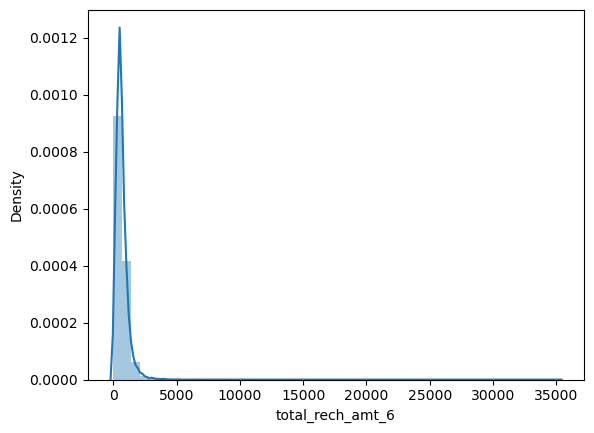

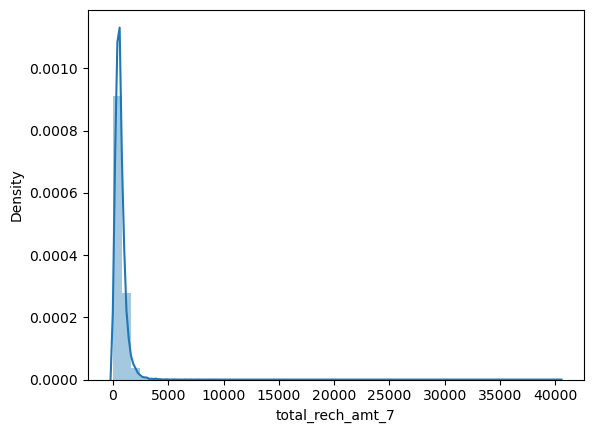

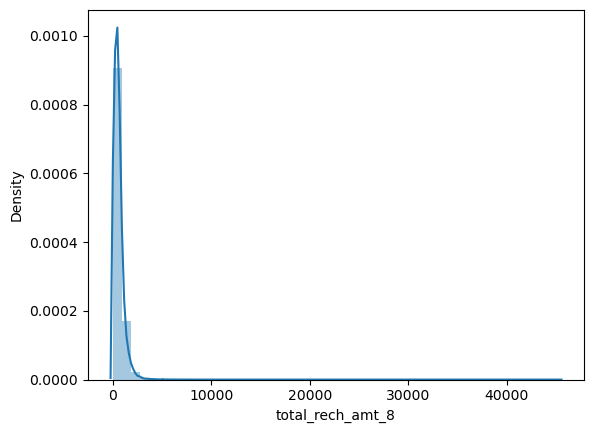

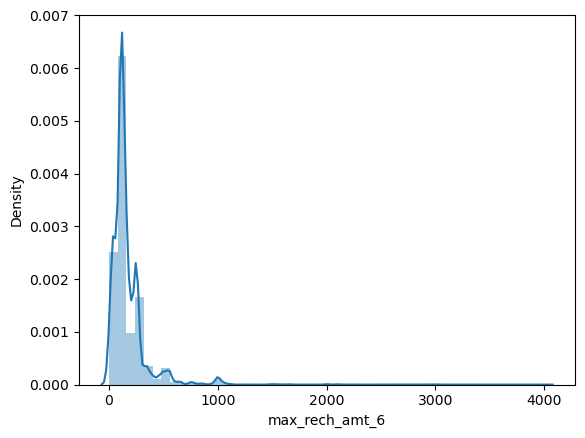

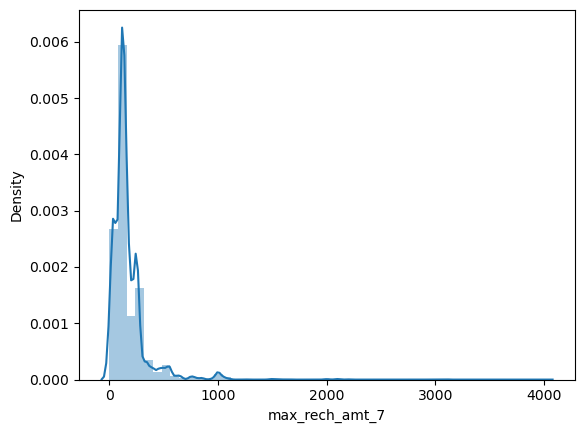

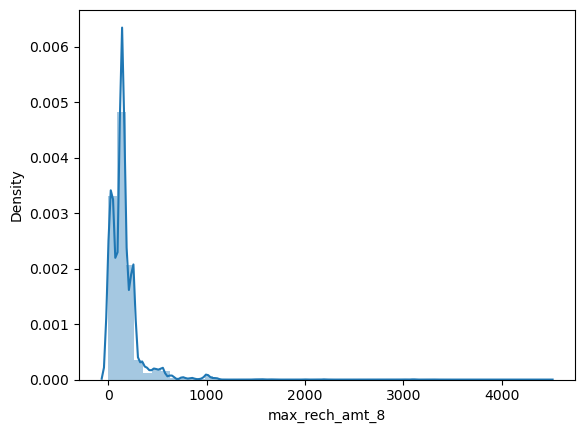

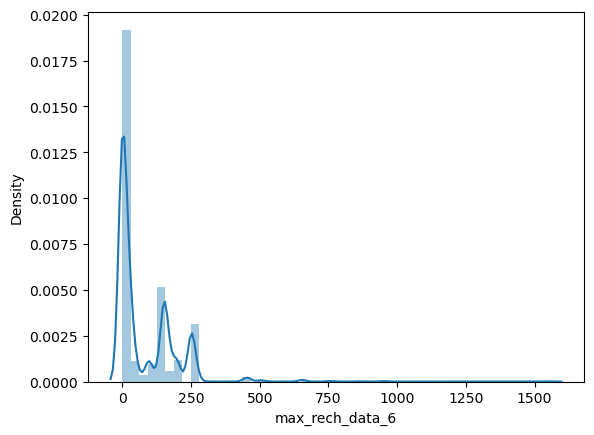

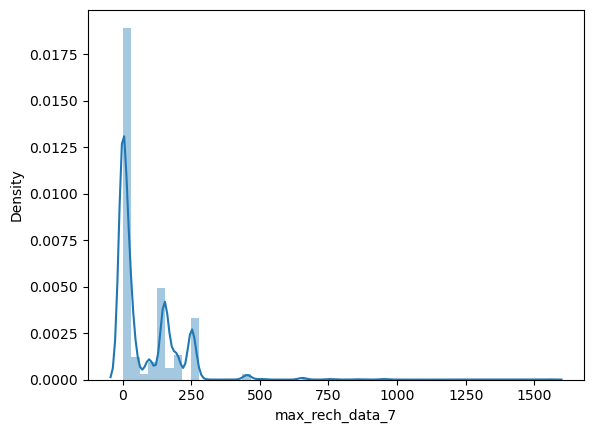

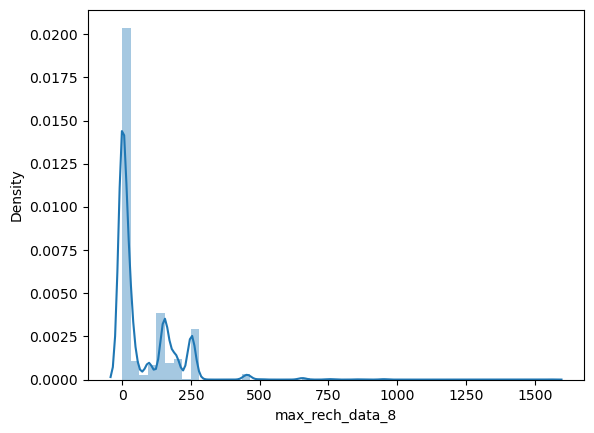

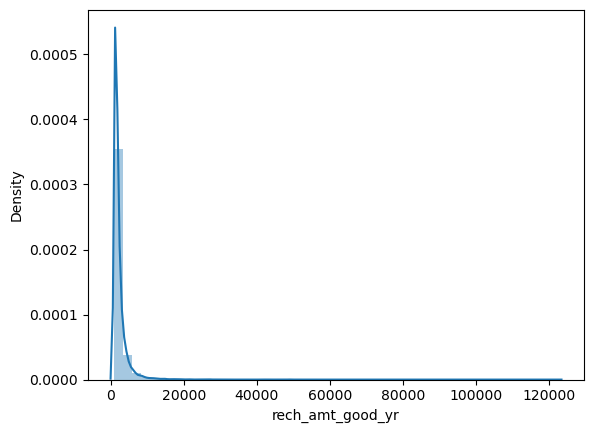

In [116]:
for cols in rech_call_data:
    sns.distplot( high_val[cols], label = cols)
    plt.show()

`Columns related to All kind of calls within the same operator network & outside the network for good & action phase`

In [117]:
onnet_offnet_data =  high_val.columns[high_val.columns.str.contains('onnet|offnet')]
onnet_offnet_data

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8'],
      dtype='object')

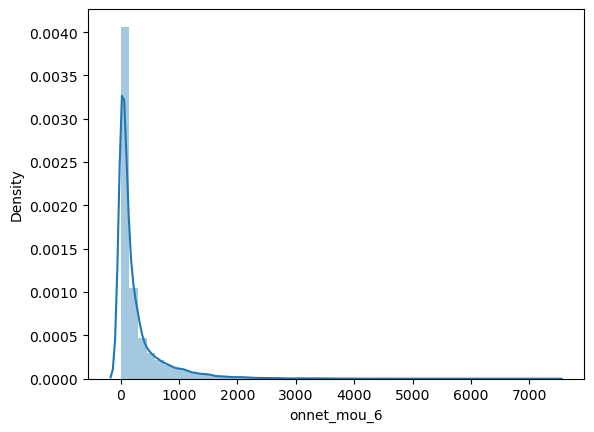

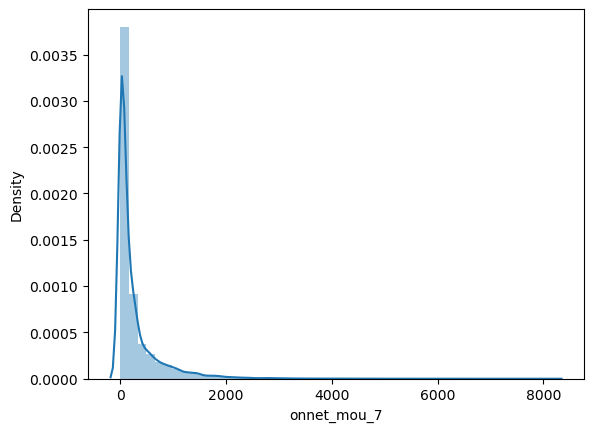

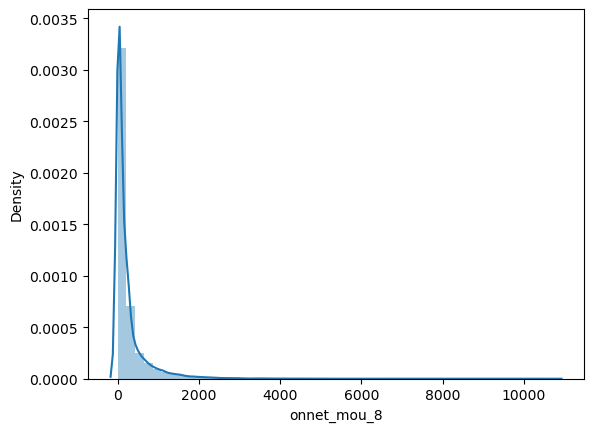

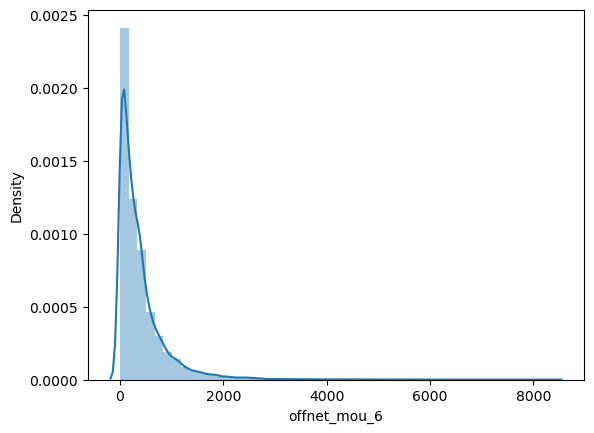

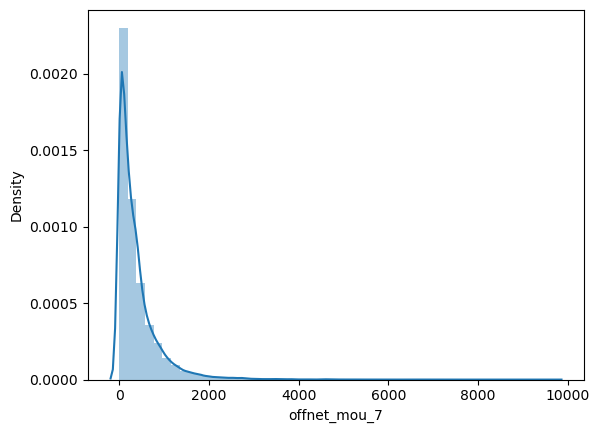

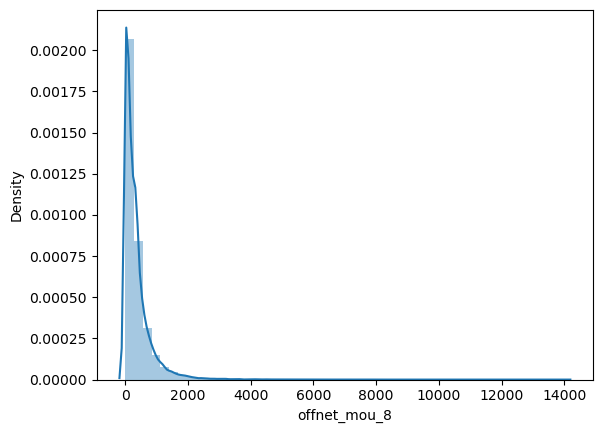

In [118]:
for cols in onnet_offnet_data:
    sns.distplot(high_val[cols], label = cols)
    plt.show()

`Columns related to total outgoing calls & roaming outgoing calls for good & action phase`

In [119]:
og_data =  high_val.columns[high_val.columns.str.contains('total_og|roam_og')]
og_data

Index(['roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'total_og_mou_6',
       'total_og_mou_7', 'total_og_mou_8'],
      dtype='object')

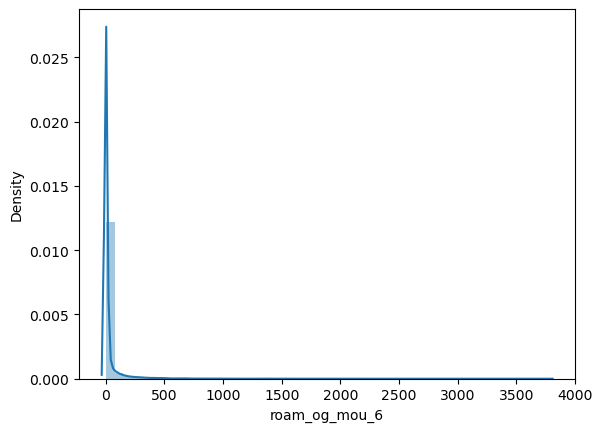

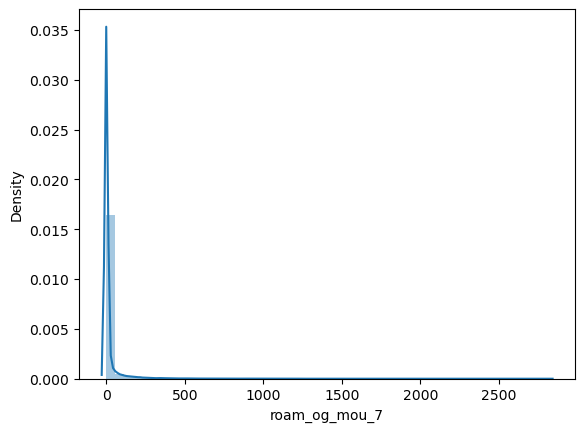

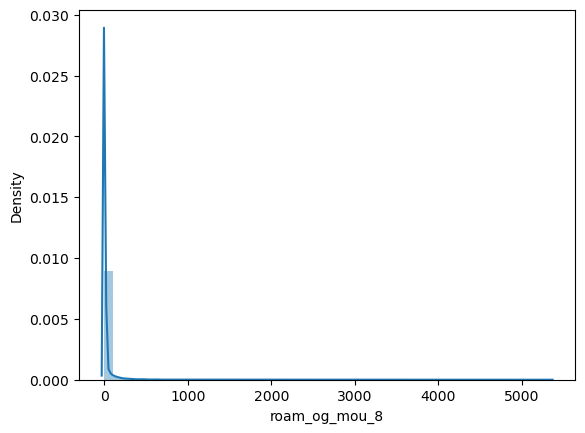

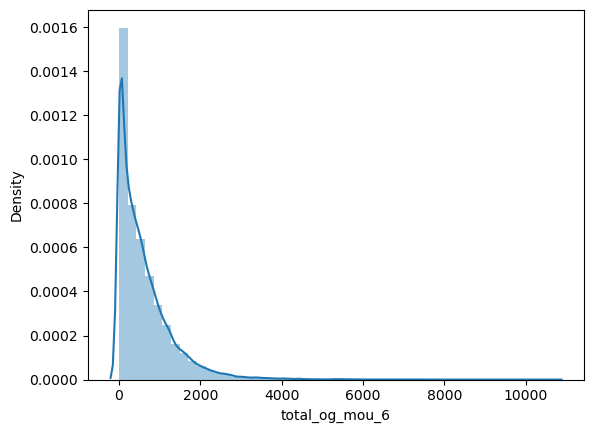

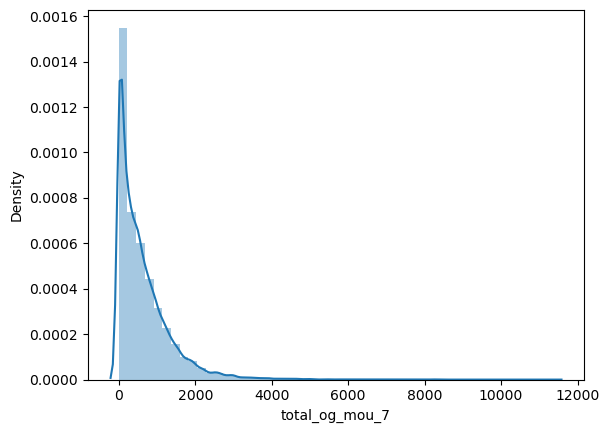

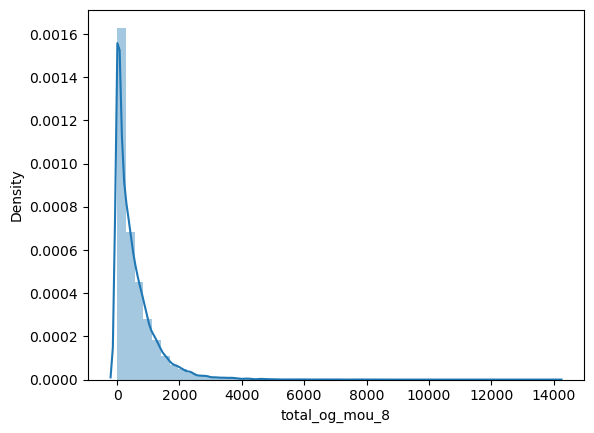

In [120]:
for cols in og_data:
    sns.distplot(high_val[cols], label = cols,kde_kws={'bw':0.1})
    plt.show()

`Columns related to total incoming calls & roaming outgoing calls for good & action phase`

In [121]:
ic_data =  high_val.columns[high_val.columns.str.contains('total_ic|roam_ic')]
ic_data

Index(['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'total_ic_mou_6',
       'total_ic_mou_7', 'total_ic_mou_8'],
      dtype='object')

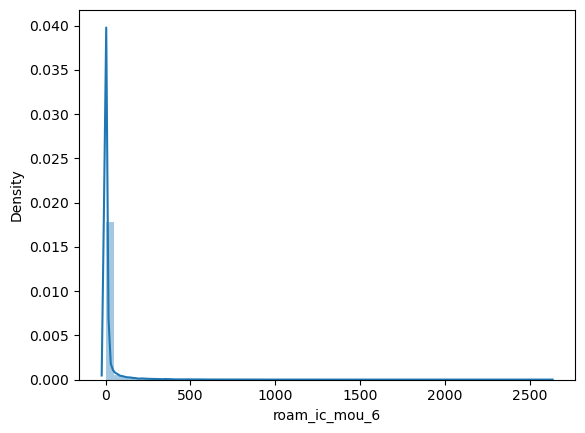

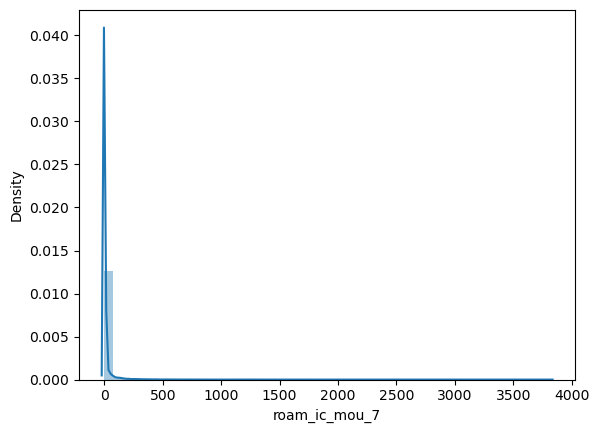

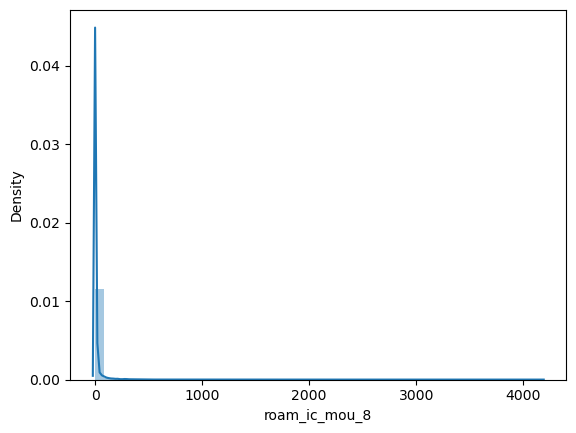

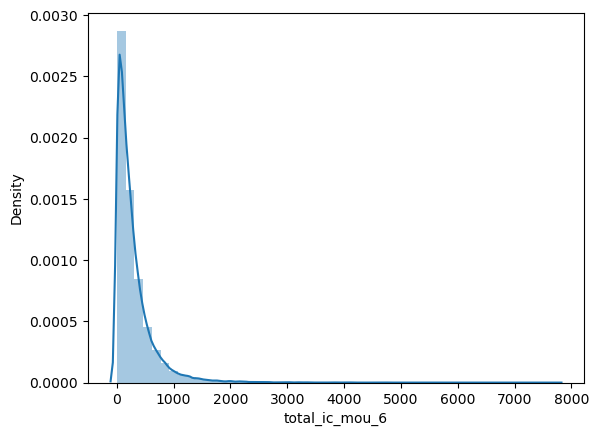

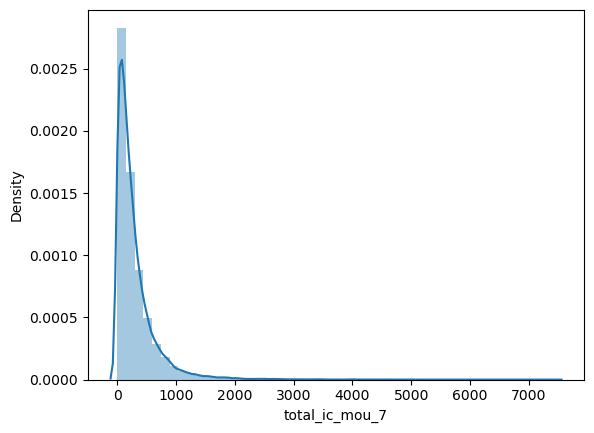

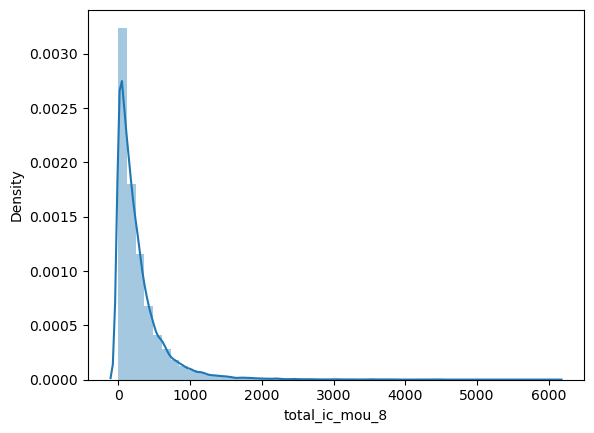

In [122]:
for cols in ic_data:
    sns.distplot(high_val[cols], label = cols, kde_kws={'bw':0.1})
    plt.show()

`Columns related to average revenue per user for good & action phase`

In [123]:
arpu_data =  high_val.columns[high_val.columns.str.contains('arpu')]
arpu_data

Index(['arpu_6', 'arpu_7', 'arpu_8'], dtype='object')

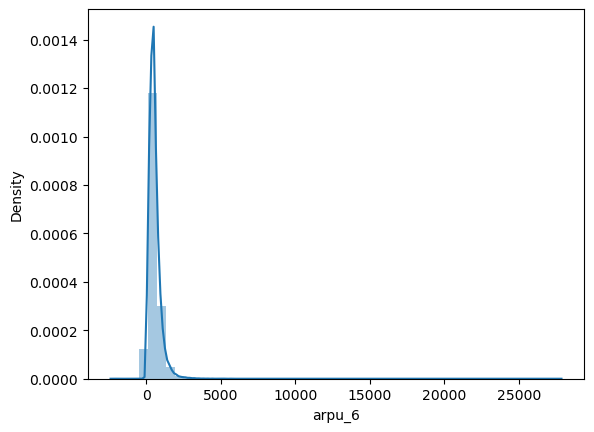

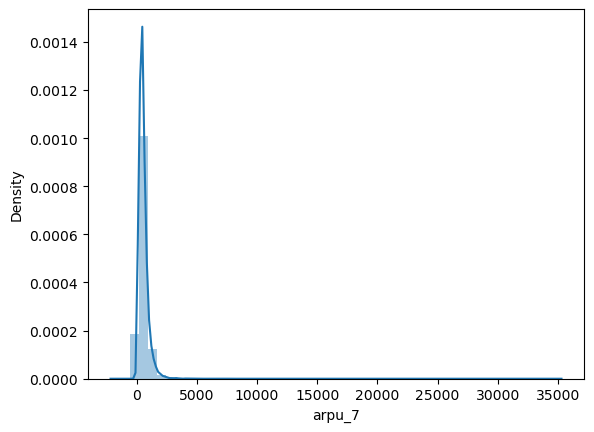

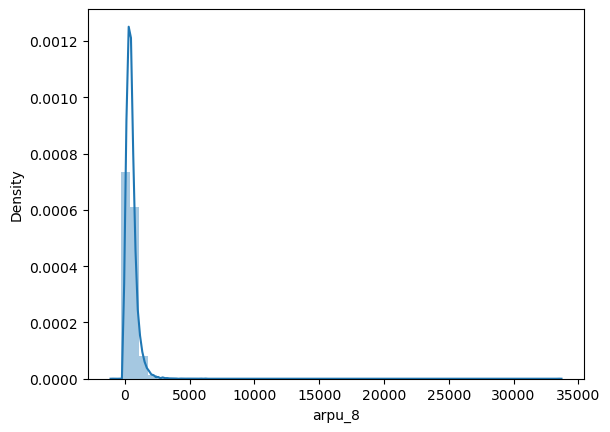

In [124]:
for cols in arpu_data:
    sns.distplot(high_val[cols], label = cols, kde_kws={'bw':0.1})
    plt.show()

<b id ='5'> c.) Observing Numerical columns - Outlier analysis

`Outliers in all types of outgoing calls in  all the months`

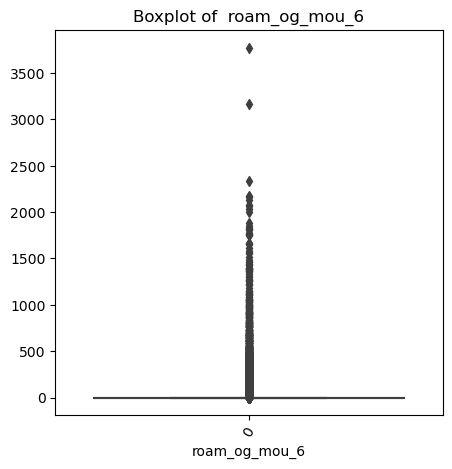

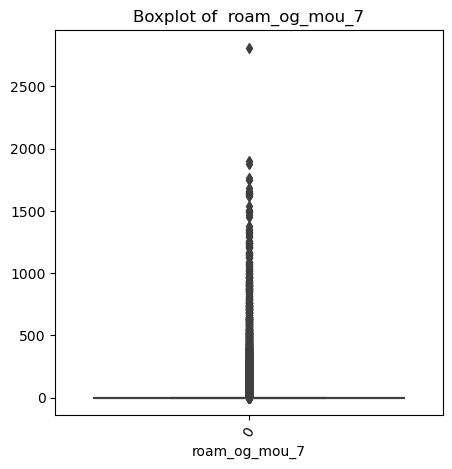

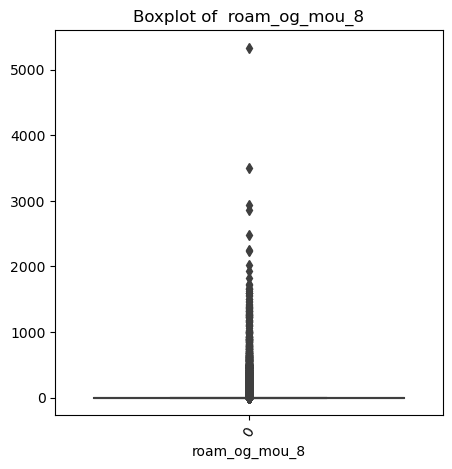

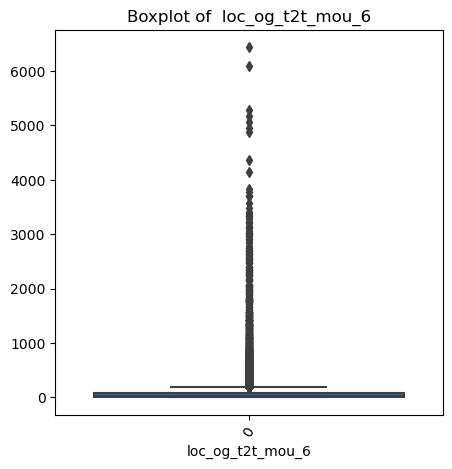

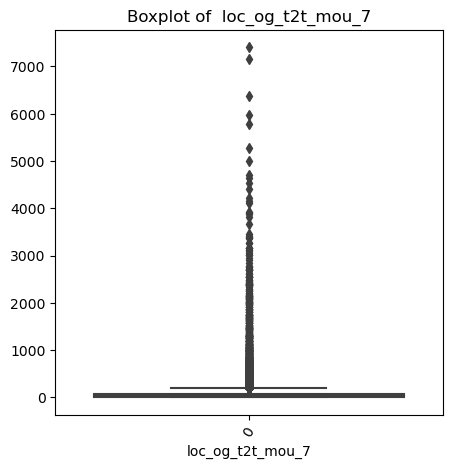

...

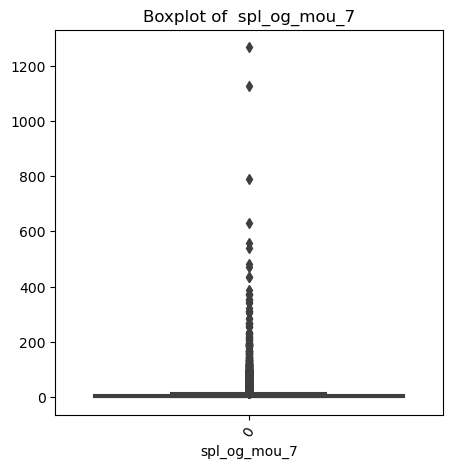

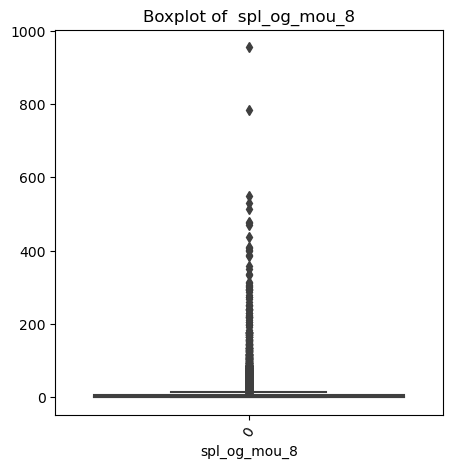

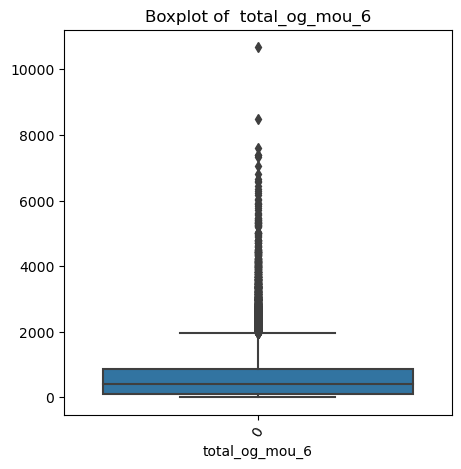

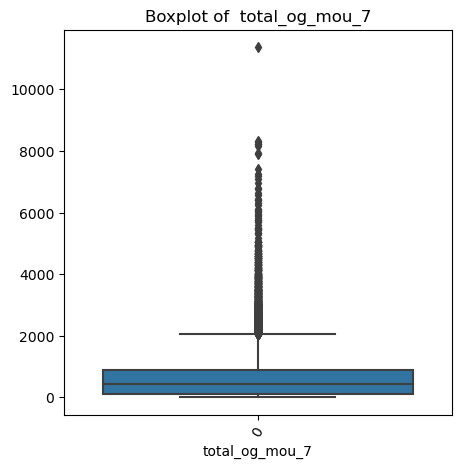

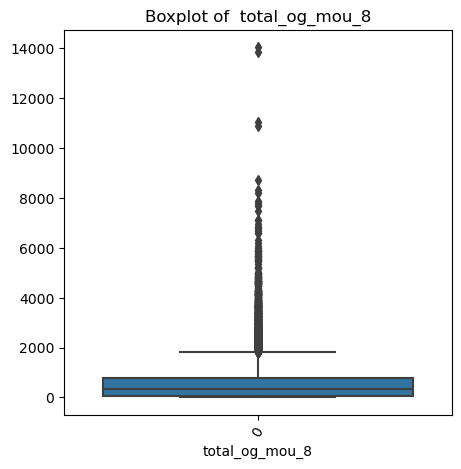

In [125]:
for i in high_val.columns[high_val.columns.str.contains("og")]:
    plt.figure(figsize =(5,5))
    sns.boxplot(high_val[i])
    plt.xticks(rotation = 60)
    plt.title('Boxplot of '+' '+ i)
    plt.xlabel(i)
    plt.show()      

`Outliers in all types of incoming calls in  all the months`

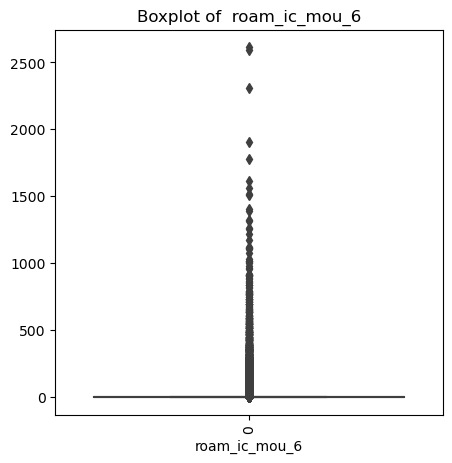

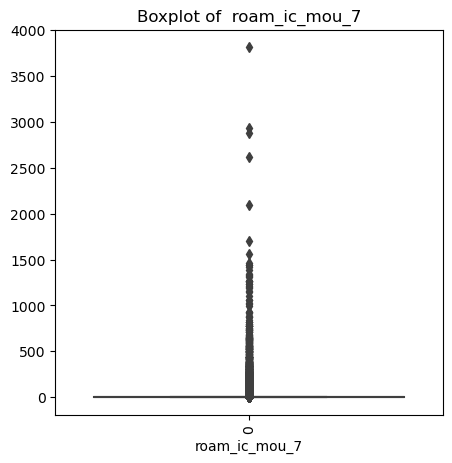

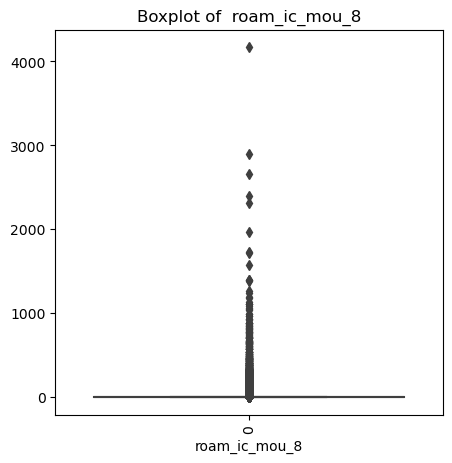

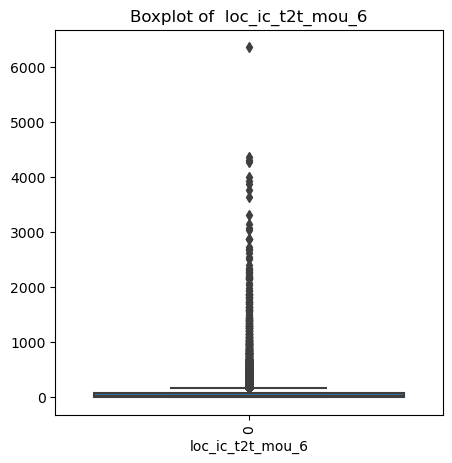

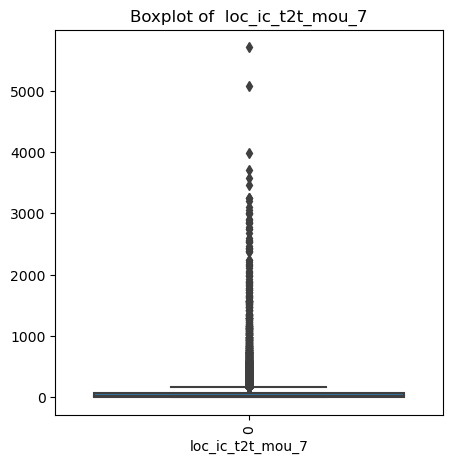

...

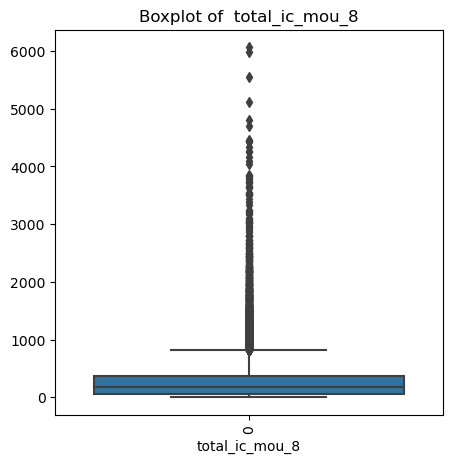

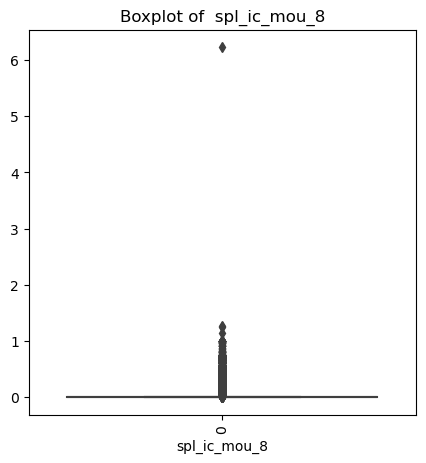

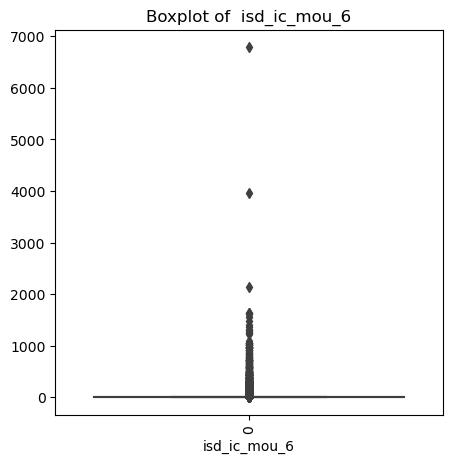

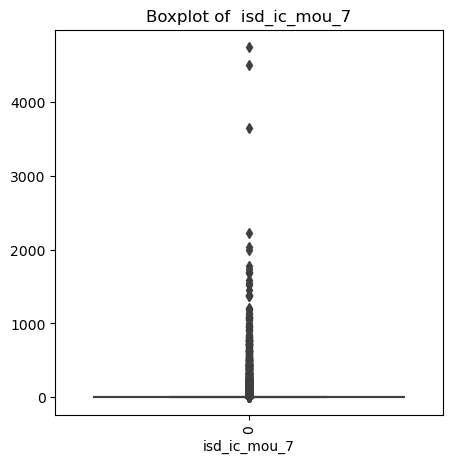

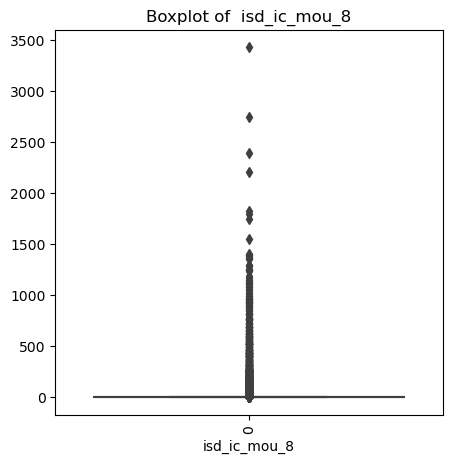

In [126]:
for i in high_val.columns[high_val.columns.str.contains("ic")]:
    plt.figure(figsize =(5,5))
    sns.boxplot(high_val[i])
    plt.xticks(rotation = 90)
    plt.title('Boxplot of '+' '+ i)
    plt.xlabel(i)
    plt.show()      

`Outliers in monthly data recharges done in all the months`

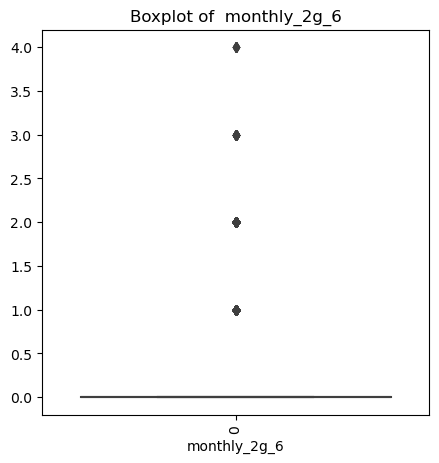

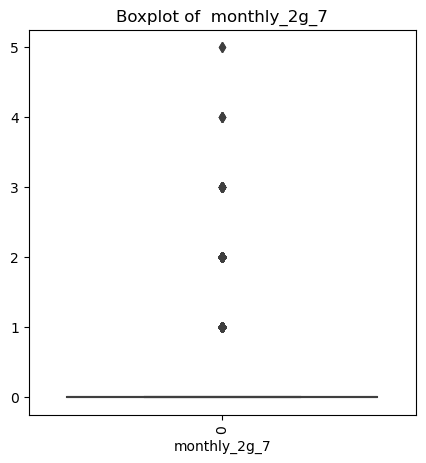

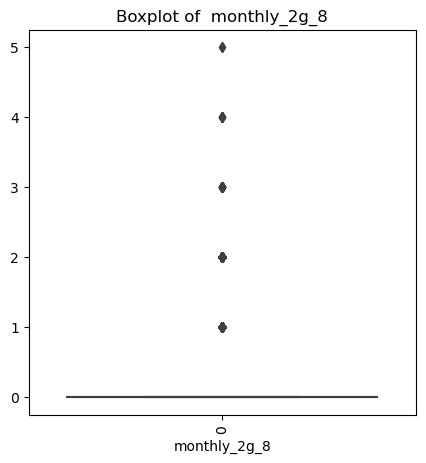

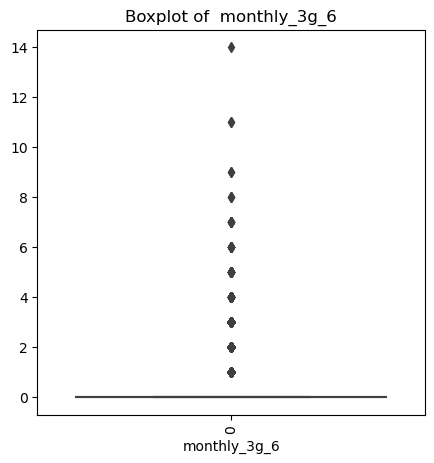

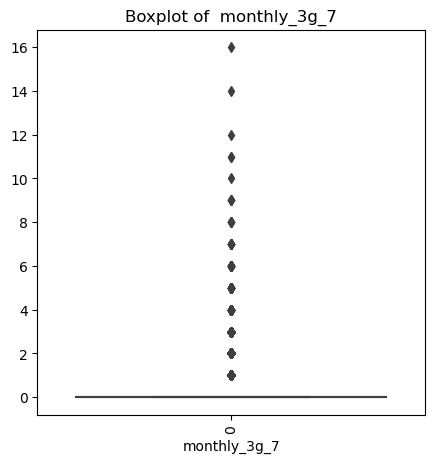

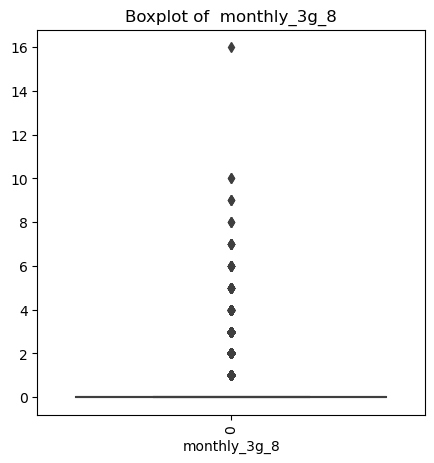

In [127]:
for i in high_val.columns[high_val.columns.str.contains("monthly")]:
        plt.figure(figsize =(5,5))
        sns.boxplot(high_val[i].astype('int'))
        plt.xticks(rotation = 90)
        plt.title('Boxplot of '+' '+ i)
        plt.xlabel(i)
        plt.show()   

`Outliers in sachet recharges done in all the months`

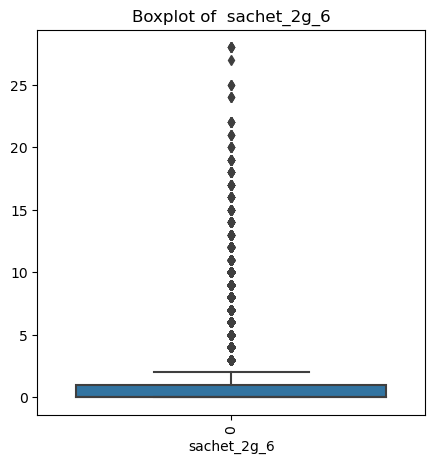

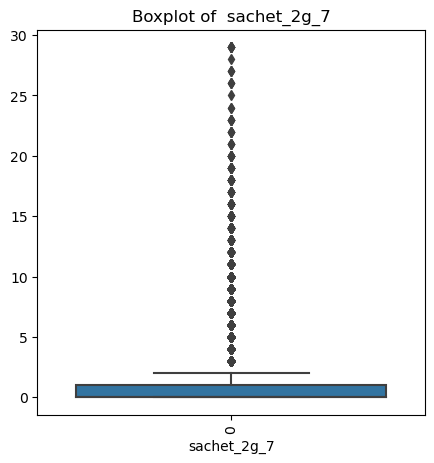

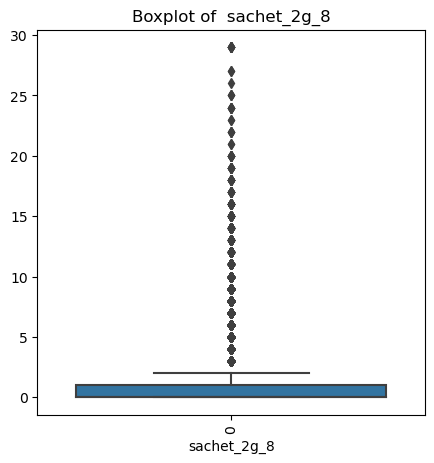

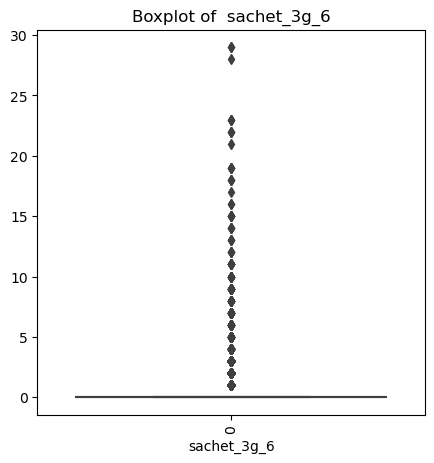

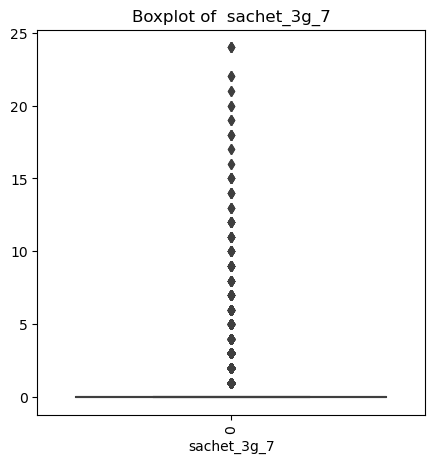

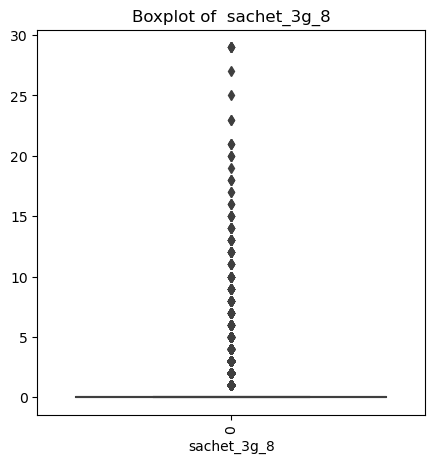

In [128]:
for i in high_val.columns[high_val.columns.str.contains("sachet")]:
        plt.figure(figsize =(5,5))
        sns.boxplot(high_val[i].astype('int'))
        plt.xticks(rotation = 90)
        plt.title('Boxplot of '+' '+ i)
        plt.xlabel(i)
        plt.show()   

`Outliers in All kind of calls within the same operator network in all the months`

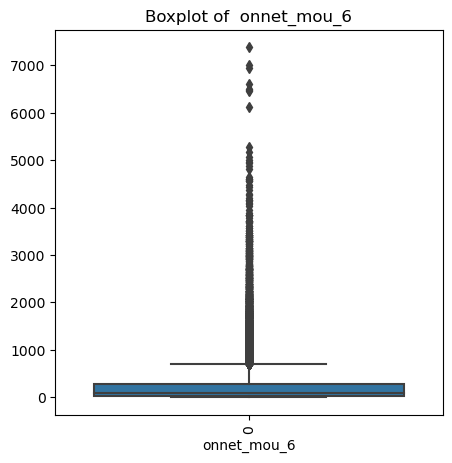

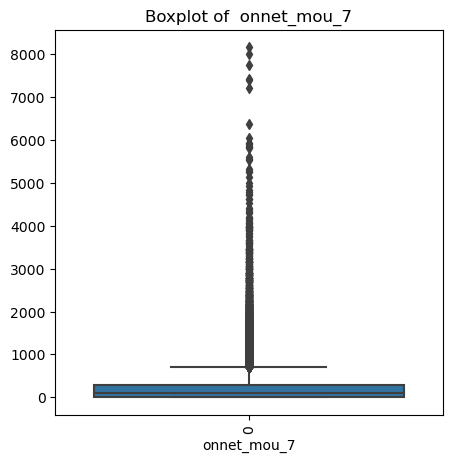

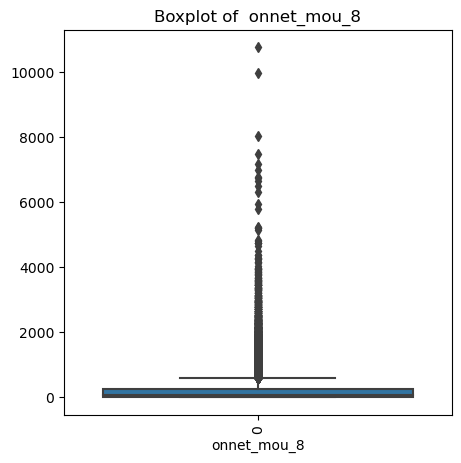

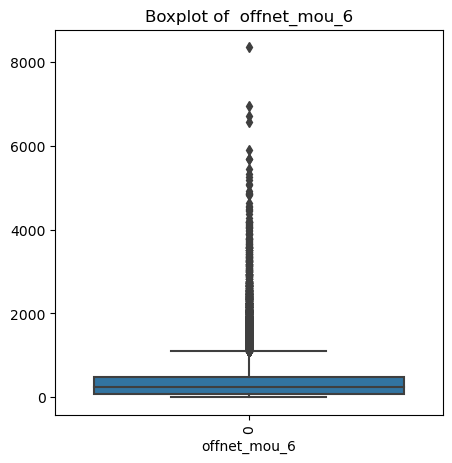

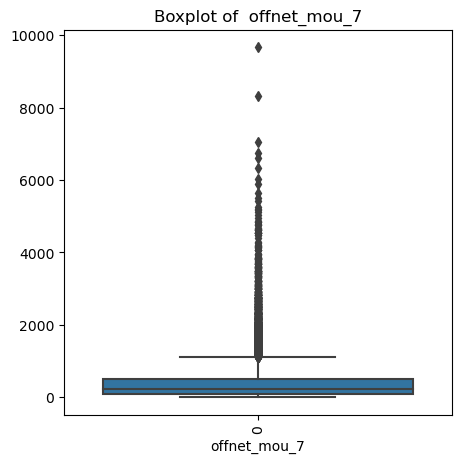

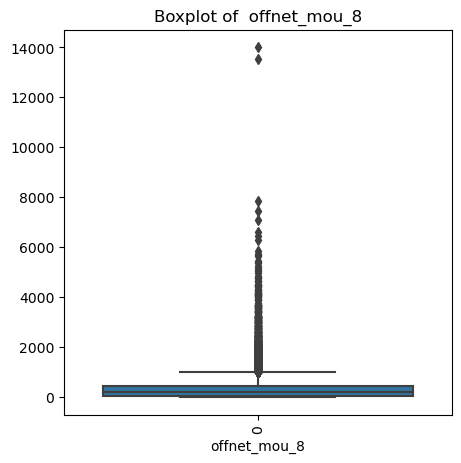

In [129]:
for i in high_val.columns[high_val.columns.str.contains("net")]:
        plt.figure(figsize =(5,5))
        sns.boxplot(high_val[i])
        plt.xticks(rotation = 90)
        plt.title('Boxplot of '+' '+ i)
        plt.xlabel(i)
        plt.show() 

`outliers in all kind of calls outside the operator network`

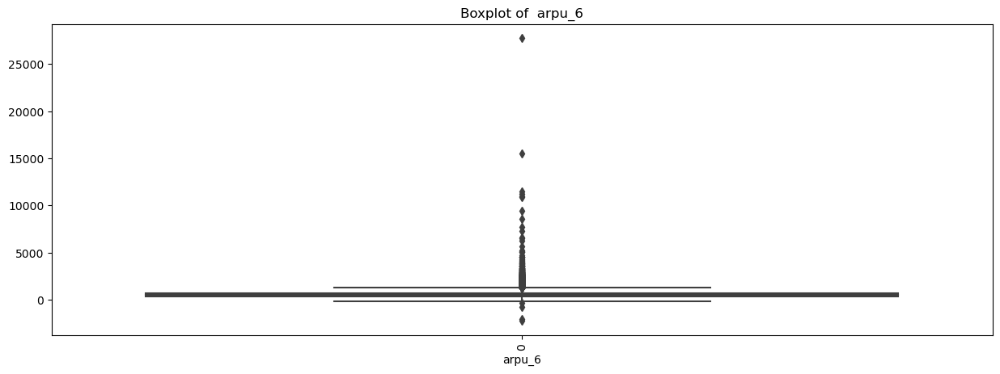

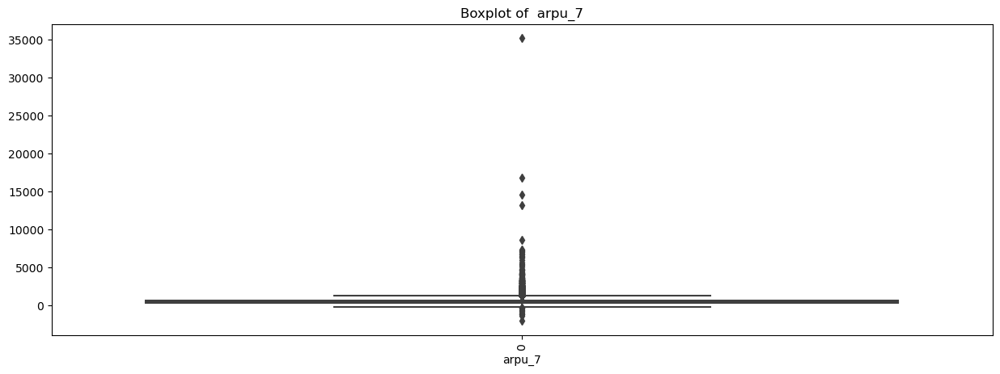

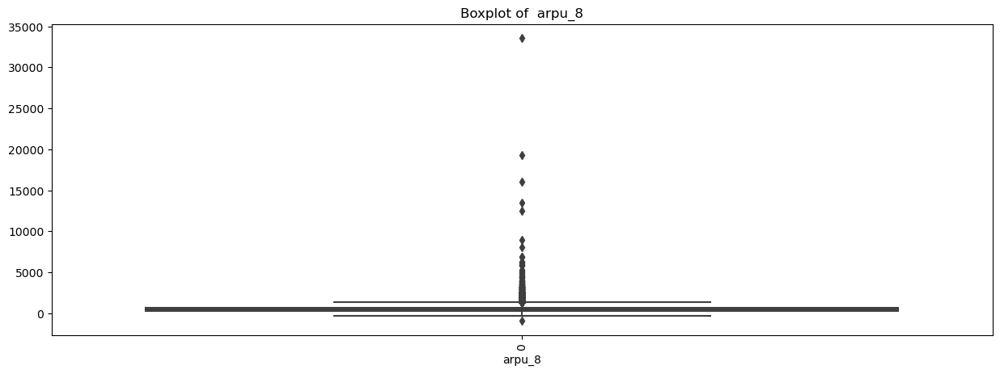

In [130]:
for i in high_val.columns[high_val.columns.str.contains("arpu")]:
        plt.figure(figsize =(15,5))
        sns.boxplot(high_val[i])
        plt.xticks(rotation = 90)
        plt.title('Boxplot of '+' '+ i)
        plt.xlabel(i)
        plt.show() 

<b id ='5'> d.) Observing categorical columns

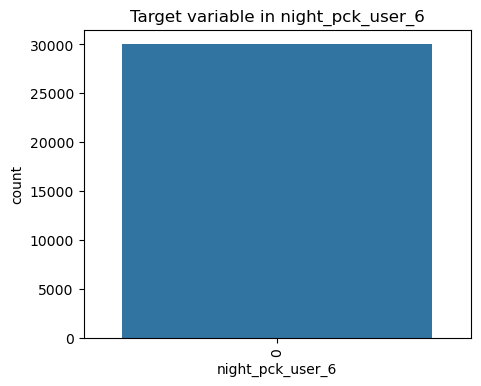

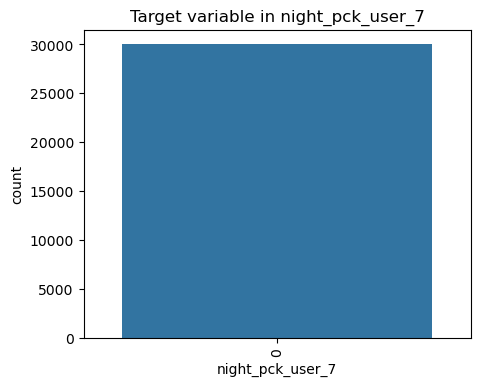

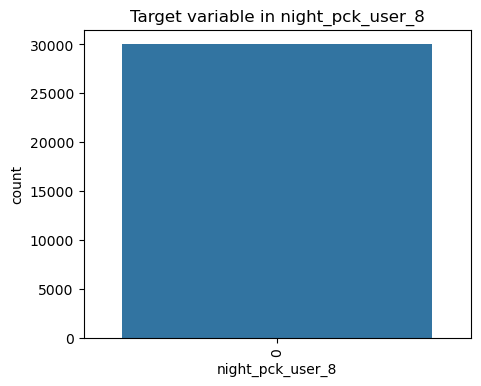

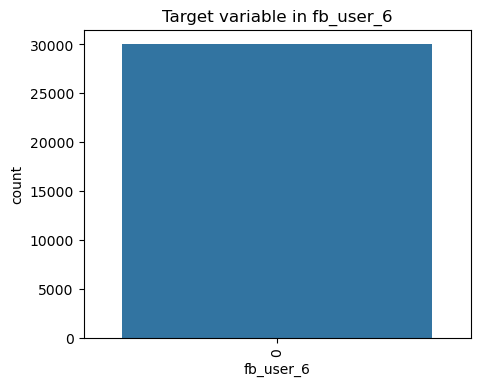

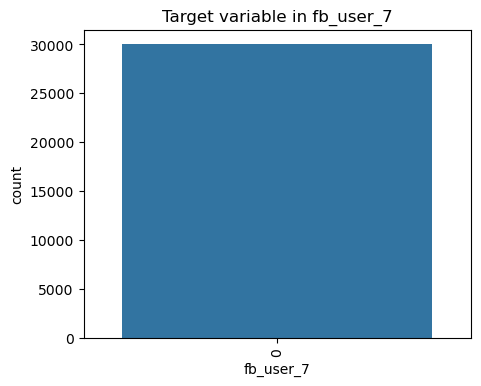

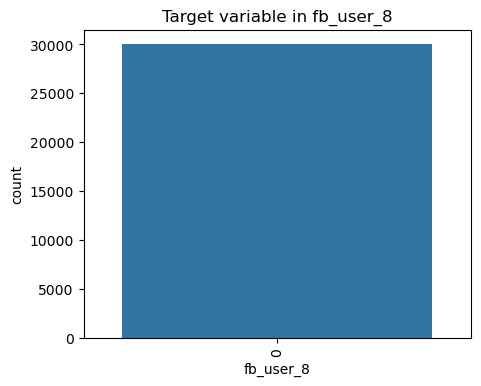

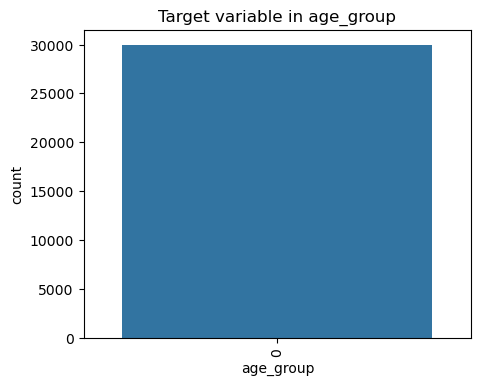

In [131]:
for i in cat_cols:
    if (i != 'churn')|(i != 'age_group'):
        plt.figure(figsize =(5,4))
        sns.countplot(high_val[i])
        plt.xticks(rotation = 90)
        plt.title('Target variable in'+' '+ i)
        plt.xlabel(i)
        plt.show()

<Axes: xlabel='age_group', ylabel='count'>

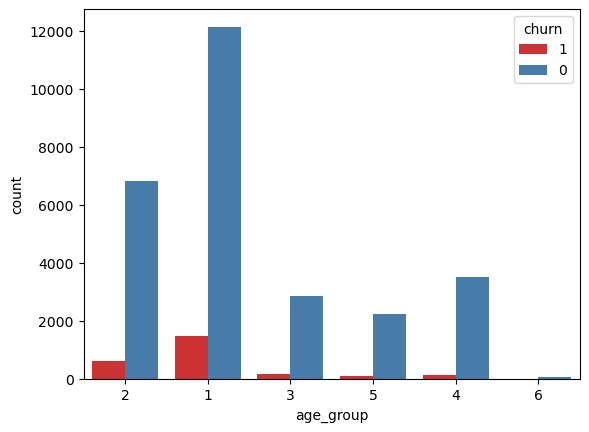

In [132]:
sns.countplot(x=high_val['age_group'], hue = high_val['churn'], palette="Set1")


## 8. Bivariate Analysis

In [133]:
def bivar_plot(var1, var2,fig):
    plt.figure(figsize = (20,15))
    plt.subplot(4,2, fig)
    if var1.dtype != 'object' and var2.dtype != 'object':
        sns.regplot(var1, var2)
    elif (var1.dtype == 'object' and var2.dtype != 'object') or (var1.dtype != 'object' and var2.dtype == 'object'):        
        sns.boxplot(var1)
        sns.boxplot(var2)

<b id ='5'> a.) Analyzing age of network with churn

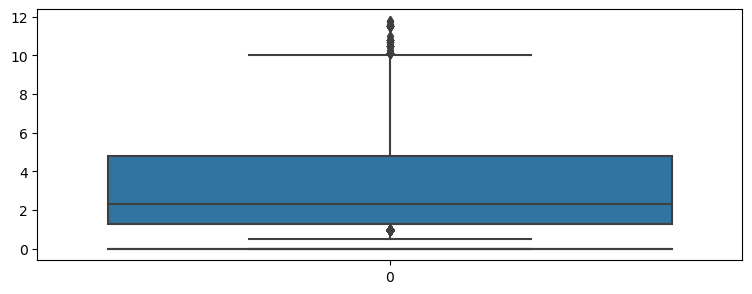

In [134]:
bivar_plot(high_val.churn, high_val.aon_yr,1)

- Average number of days cutomer using the network before churning is less than 1000.

<b id ='5'> b.) Analyzing onnet with churn

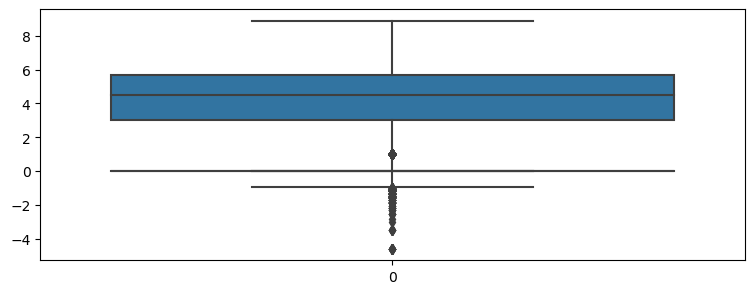

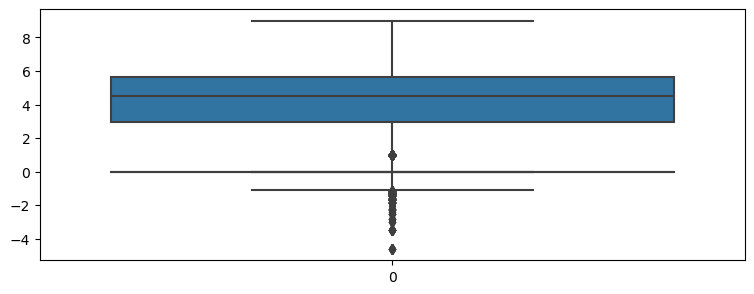

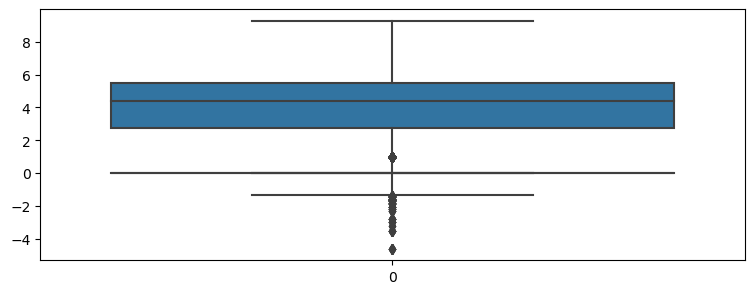

In [135]:
bivar_plot(high_val.churn, np.log(high_val.onnet_mou_6),1)
bivar_plot(high_val.churn, np.log(high_val.onnet_mou_7),2)
bivar_plot(high_val.churn, np.log(high_val.onnet_mou_8),3)

- People who have churned, used most of the calling in moth of June and July on same network, where as in month of August there calling is redcued and it is indicating that the customers are likely to churn

<b id ='5'> c.) Analyzing offnet with churn

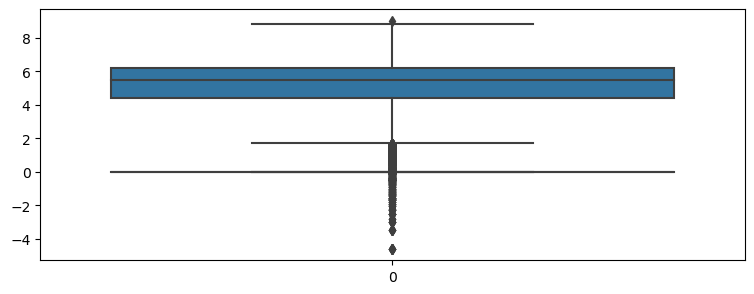

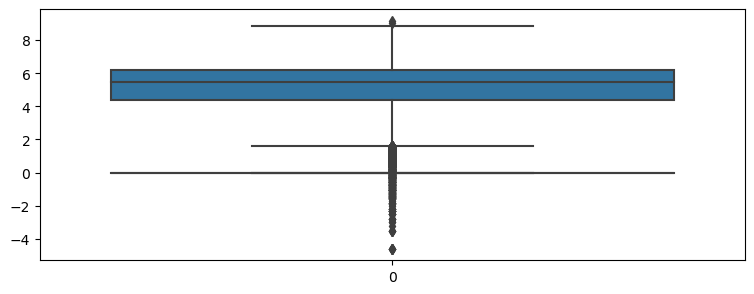

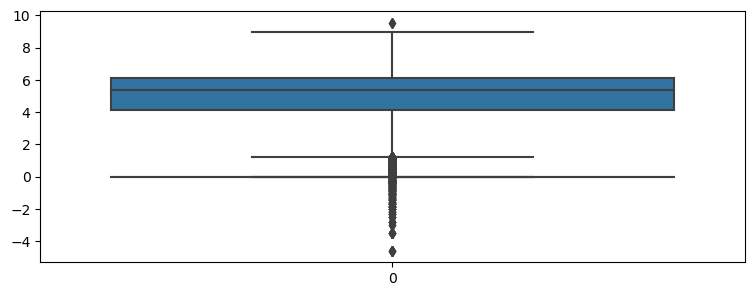

In [136]:
bivar_plot(high_val.churn, np.log(high_val.offnet_mou_6),1)
bivar_plot(high_val.churn, np.log(high_val.offnet_mou_7),2)
bivar_plot(high_val.churn, np.log(high_val.offnet_mou_8),3)

- People who have churned, used most of the calling in month of June and July on different network, where as in month of August there calling is redcued and it is indicating that the customers are likely to churn

<b id ='5'> d.) Analyzing night pack user with churn

In [137]:
pd.crosstab(high_val.churn, high_val.night_pck_user_8, normalize='columns')*100

night_pck_user_8,-1.0,0.0,1.0
churn,,,
0,85.89123,97.117602,97.360704
1,14.10877,2.882398,2.639296


<b id ='5'> e.) Analyzing Sachet with churn

In [138]:
pd.crosstab(high_val.churn, high_val.sachet_3g_8)

sachet_3g_8,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,23,25,27,29
churn,,,,,,,,,,,,,,,,,,,,,,,,,,
0,24972,1609,399,184,106,86,43,35,28,19,15,8,11,10,6,6,2,2,3,1,3,3,2,1,1,5
1,2369,48,5,8,4,2,1,0,2,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0


<b id ='5'> f.) Analyzing average revenue per user with churn

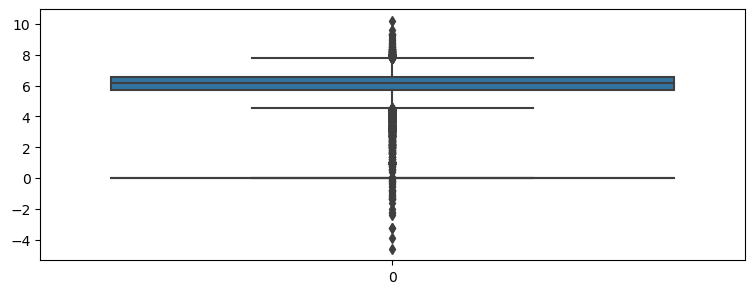

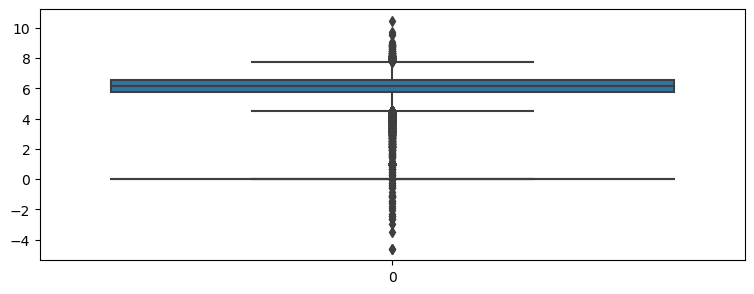

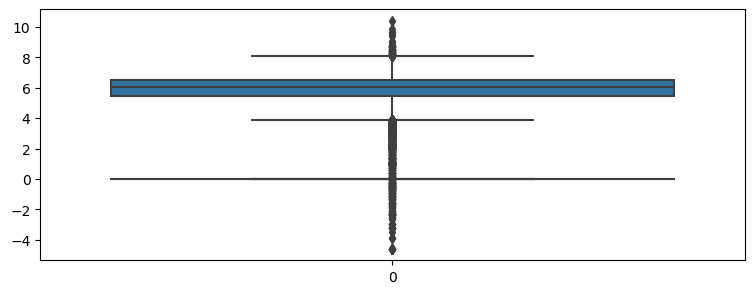

In [139]:
bivar_plot(high_val.churn, np.log(high_val.arpu_6),1)
bivar_plot(high_val.churn, np.log(high_val.arpu_7),2)
bivar_plot(high_val.churn, np.log(high_val.arpu_8),3)

<b id ='5'> g.) Analyzing total recharge amount with churn

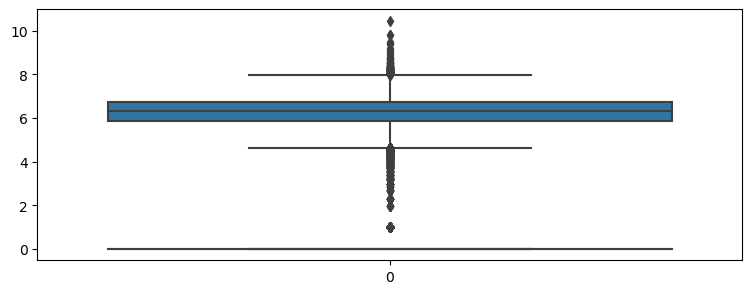

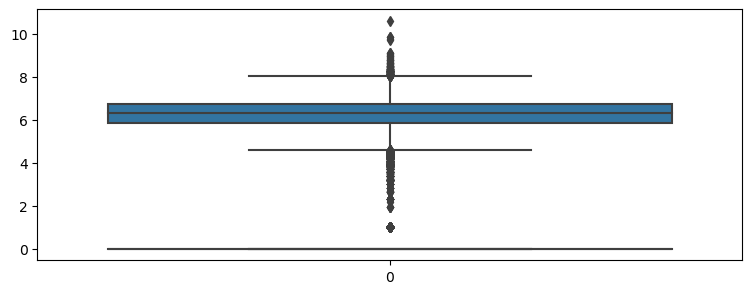

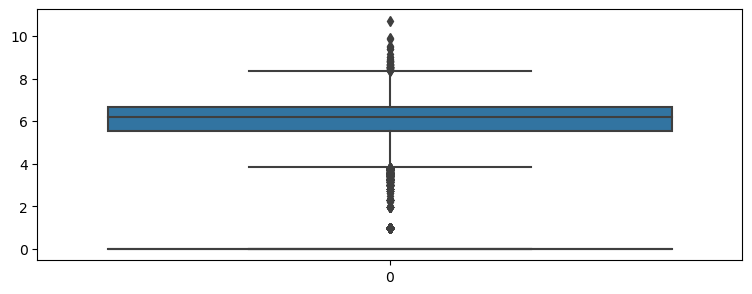

In [140]:
bivar_plot(high_val.churn, np.log(high_val.total_rech_amt_6),1)
bivar_plot(high_val.churn, np.log(high_val.total_rech_amt_7),2)
bivar_plot(high_val.churn, np.log(high_val.total_rech_amt_8),3)

<b id ='5'> h.) Analyzing total recharge number with churn

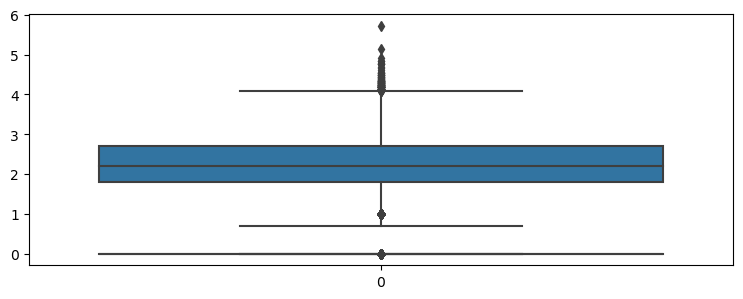

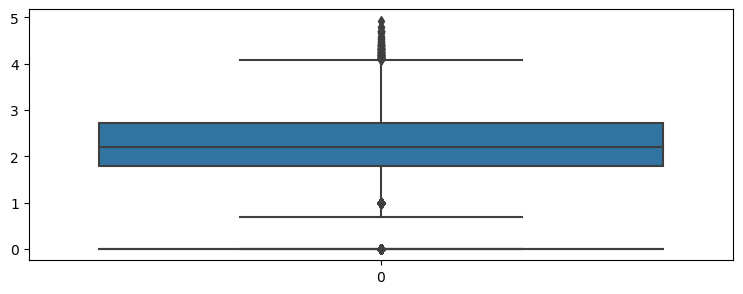

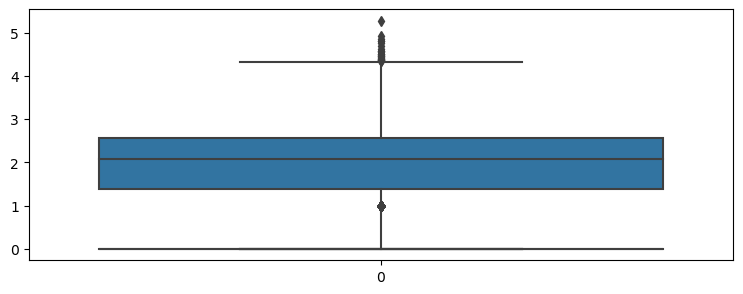

In [141]:
bivar_plot(high_val.churn, np.log(high_val.total_rech_num_6),1)
bivar_plot(high_val.churn, np.log(high_val.total_rech_num_7),2)
bivar_plot(high_val.churn, np.log(high_val.total_rech_num_8),3)

- ###  correlation among the features

In [142]:
# Observing the correlation among these numerical predictor variables

high_val.drop('cust_id',1).corr()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,aon_yr
arpu_6,1.000000,0.671732,0.612617,0.336453,0.216297,0.189710,0.502537,0.340520,0.290549,0.124335,0.083370,0.091041,0.193363,0.143148,0.125789,0.167352,0.127683,0.123732,0.332207,0.245092,0.218150,0.139434,0.114368,0.104302,0.047680,0.010017,0.011393,0.328978,0.246204,0.223301,0.274093,0.161528,0.133795,0.301575,0.181414,0.139780,0.066751,0.053564,0.043895,0.385851,0.230380,0.182037,0.122743,0.068491,0.044582,0.554510,0.363276,0.301856,0.082855,0.062961,0.062838,0.188556,0.149218,0.124188,0.051510,0.039208,0.037365,0.181866,0.142514,0.124191,0.088103,0.061598,0.056880,0.098775,0.065714,0.062874,0.034451,0.032583,0.022957,0.125126,0.085687,0.079334,0.225987,0.169024,0.150749,-0.011741,0.103090,0.063193,0.070653,0.349709,0.136098,0.119406,0.946125,0.650611,0.603673,0.337983,0.261993,0.284518,0.266656,0.207282,0.199304,0.072714,-0.021877,0.025203,-0.165470,-0.208538,-0.161828,0.090485,0.020223,0.035060,-0.062580,-0.098980,-0.077949,0.152507,0.070184,0.084675,-0.039073,-0.084189,-0.061430,-0.159363,-0.195556,-0.152818,0.176436,0.081091,0.103661,-0.002555,-0.027456,-0.018409,0.058547,0.055172,0.112462,0.089005,-0.023731,0.003324,0.419558,0.210705,0.207462,0.368357,0.041431
arpu_7,0.671732,1.000000,0.759858,0.210125,0.314603,0.262084,0.350785,0.483054,0.386365,0.091754,0.091589,0.090830,0.132734,0.177293,0.148744,0.106674,0.157926,0.135348,0.215457,0.303201,0.256019,0.112066,0.140968,0.121890,0.009198,0.040485,0.032706,0.213501,0.304529,0.255867,0.166621,0.260775,0.219911,0.203737,0.307786,0.239066,0.051743,0.070678,0.053822,0.248495,0.381714,0.305135,0.067268,0.114977,0.070283,0.365323,0.535818,0.429002,0.045888,0.076559,0.074023,0.116099,0.171756,0.144085,0.032581,0.047221,0.046059,0.109437,0.166531,0.145045,0.058637,0.084540,0.087425,0.069811,0.100087,0.091000,0.033131,0.042395,0.033291,0.087602,0.124353,0.117452,0.139868,0.212497,0.185611,-0.007172,0.058831,0.099618,0.082177,0.164554,0.304170,0.221740,0.678296,0.943588,0.754470,0.262955,0.368861,0.373979,0.246934,0.295925,0.252987,-0.018995,0.072084,0.049080,-0.197181,-0.157310,-0.139834,0.021384,0.107340,0.065052,-0.093453,

<a> We observe high correlations among many variables. Among these variables, let us see which variables have high correlation and which have least correlation.

In [143]:
#creating correlation matrix for the given data
corrmat = np.corrcoef(high_val.drop('cust_id',1).corr().transpose())

#Make a diagonal matrix with diagonal entry of Matrix corrmat
p = np.diagflat(corrmat.diagonal())

# subtract diagonal entries making all diagonals 0
corrmat_diag_zero = corrmat - p
print("max positive corr:",round(corrmat_diag_zero.max(),3), ", min negative corr: ", round(corrmat_diag_zero.min(),3))

max positive corr: 0.997 , min negative corr:  -0.655


- ## 9. Outlier analysis

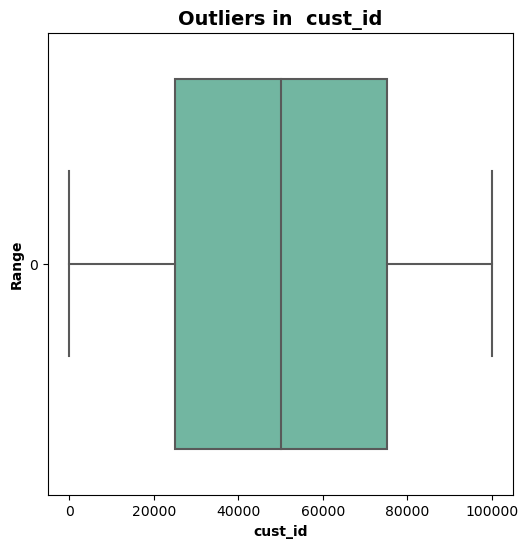

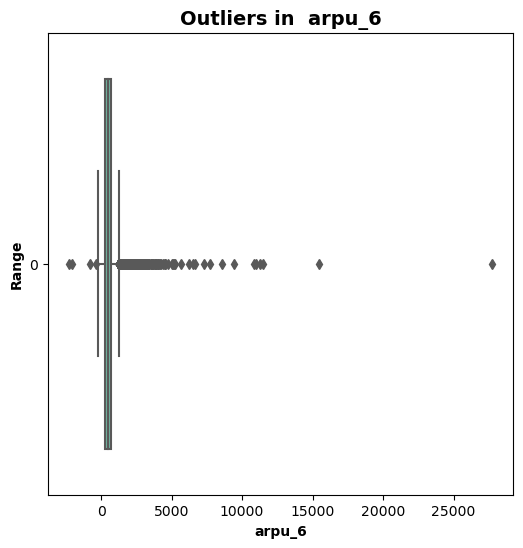

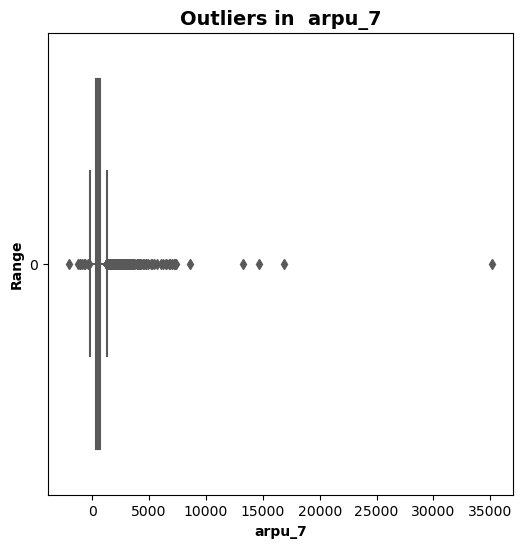

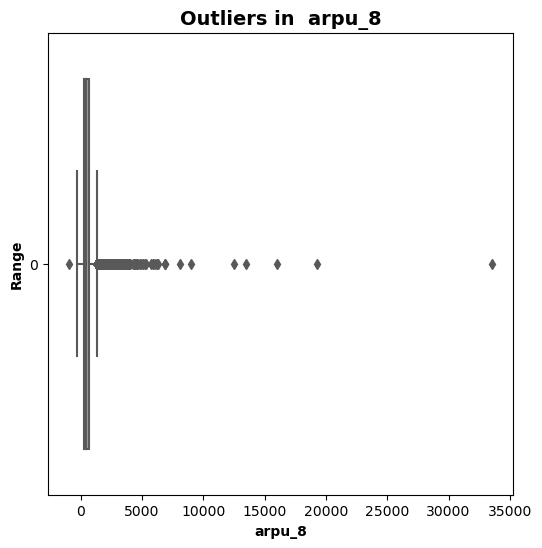

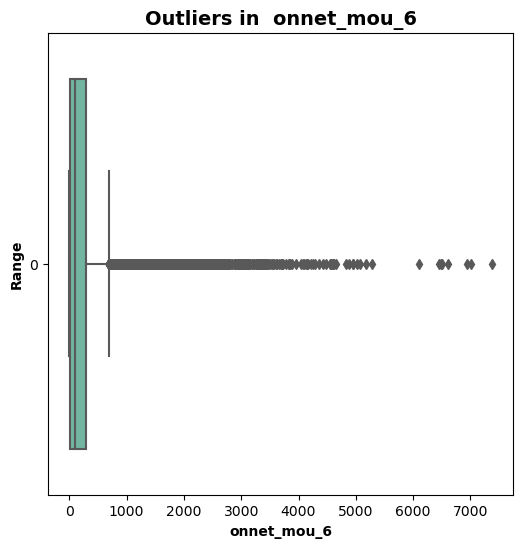

...

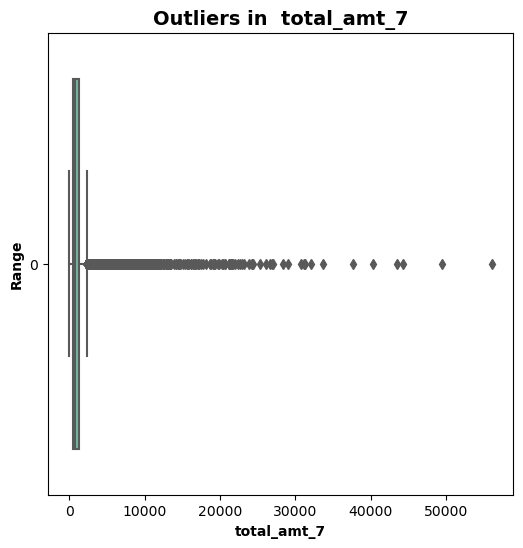

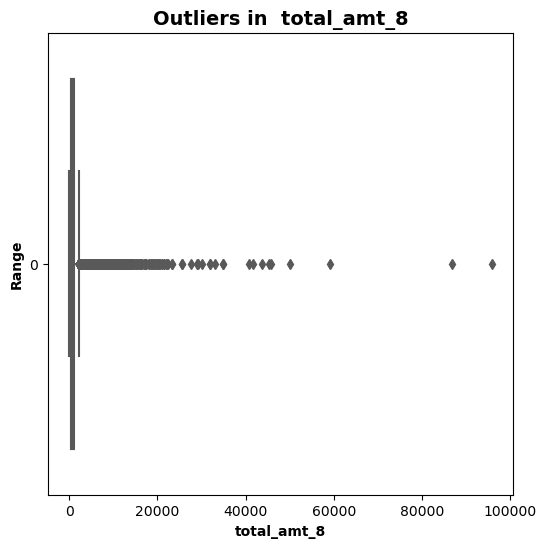

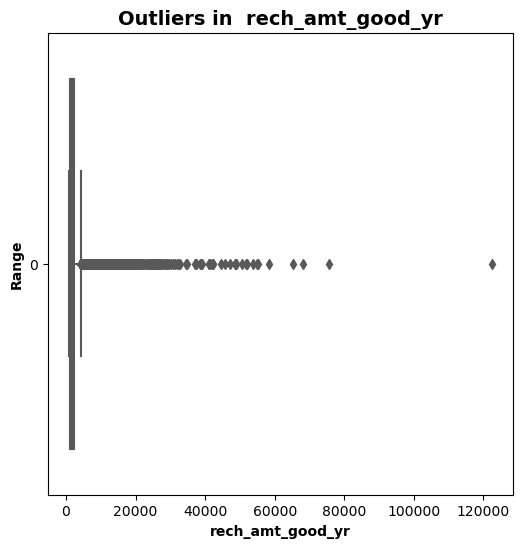

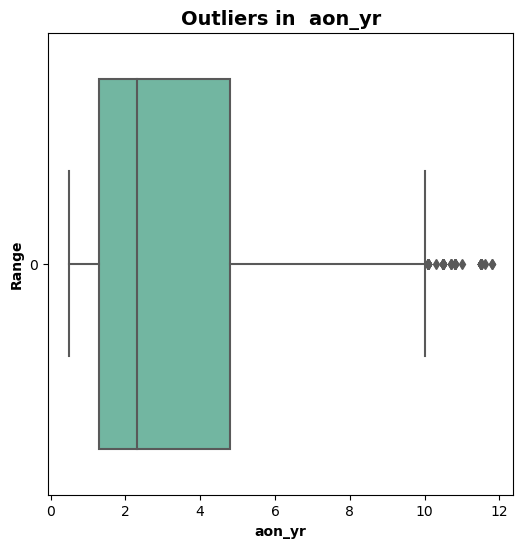

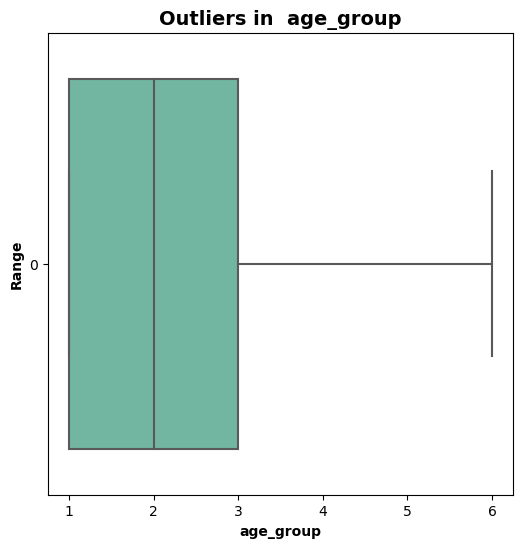

In [144]:
# Outlier analysis

for i  in high_val.drop('churn',1).columns:
    plt.figure(figsize =(6,6))
    ax = sns.boxplot(data = high_val[i], orient="h", palette="Set2" )
    plt.title('Boxplot of '+' '+ i)
    plt.title("Outliers in "+' '+ i, fontsize = 14, fontweight = 'bold')
    plt.ylabel("Range", fontweight = 'bold')
    plt.xlabel(i, fontweight = 'bold')
    for patch in ax.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, .3))
    plt.show()

<a> We observe many extreme data points in our principal components. Let us treat them as these extreme values can affect our clusters.

- ### Outlier Treatment

In [145]:
# Cappign the outliers
for col in high_val.select_dtypes(exclude = 'object').columns:
    perc = high_val[col].quantile([0.05,0.95]).values
    high_val[col]= np.clip(high_val[col],perc[0],perc[1])

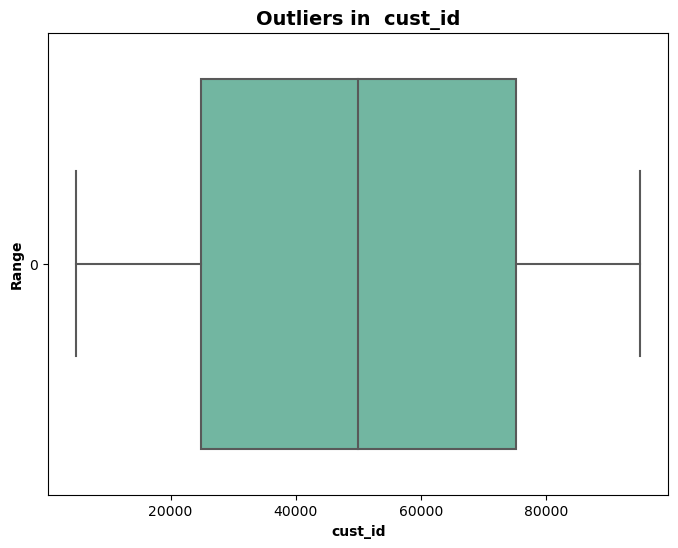

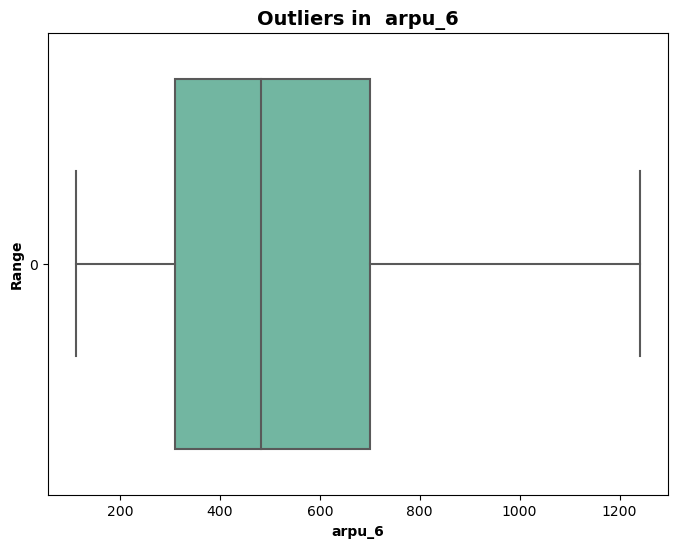

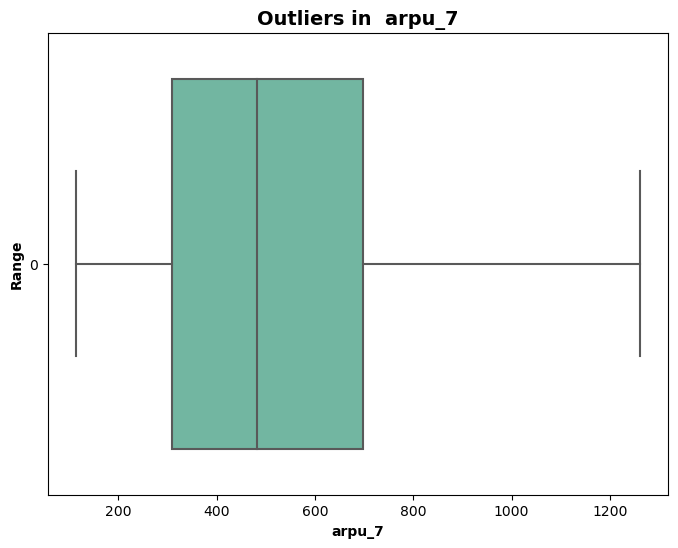

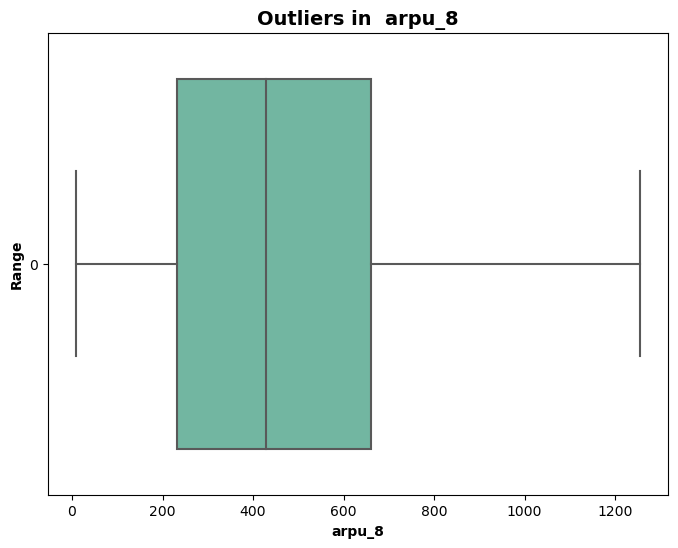

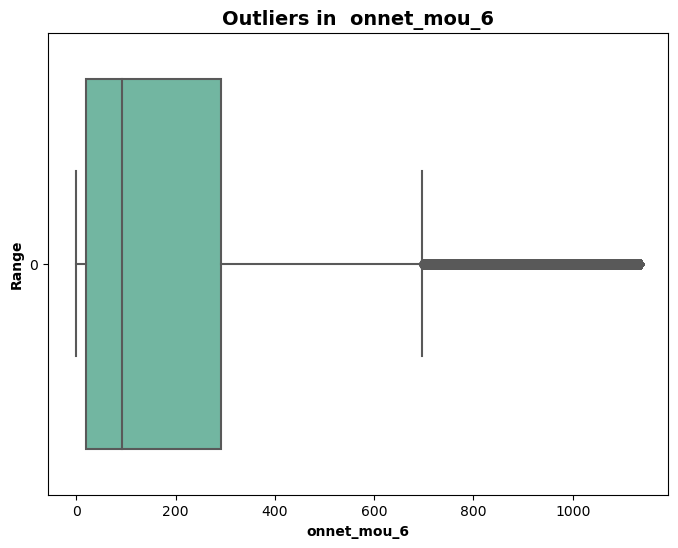

...

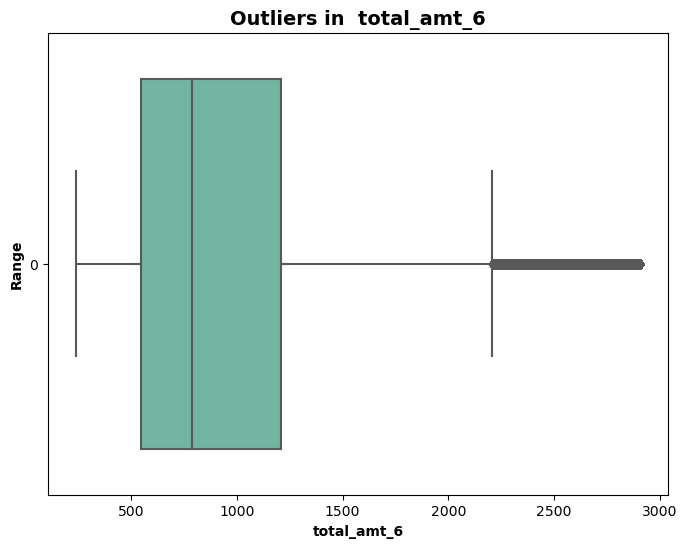

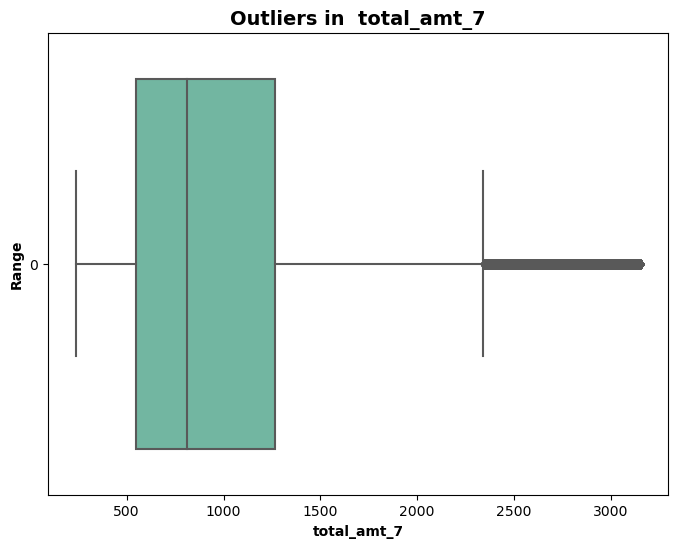

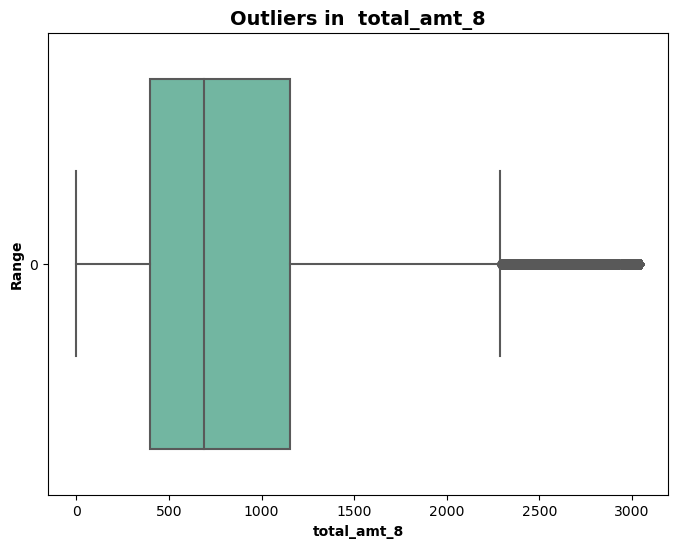

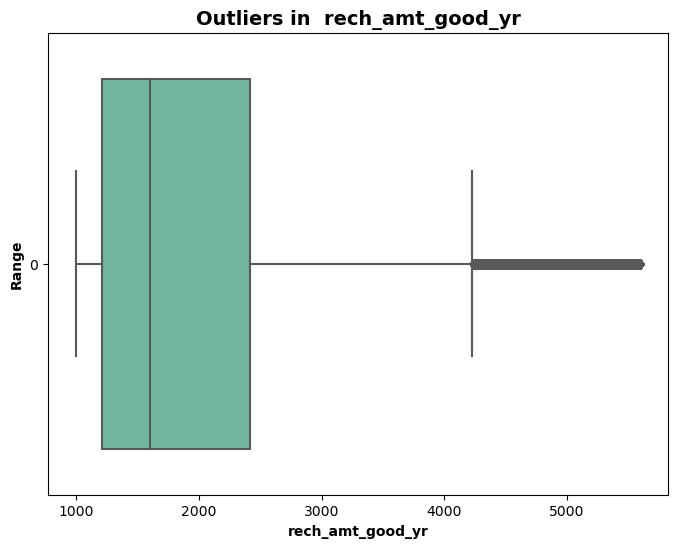

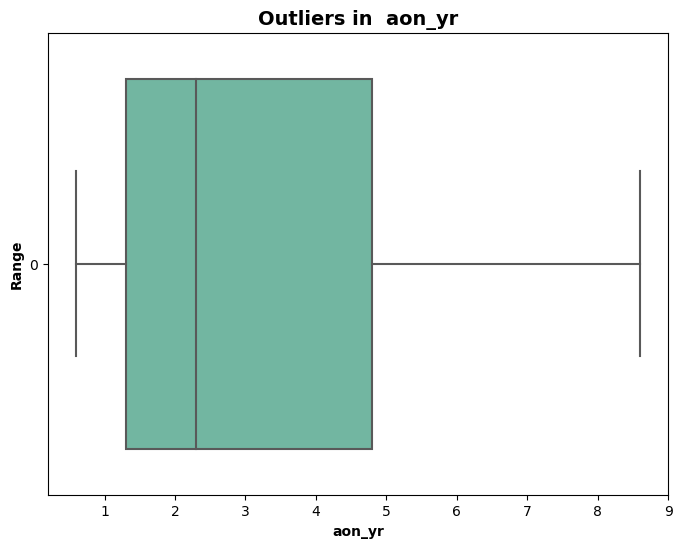

In [146]:
# Cheking whether any Outlier exists or not

for i  in high_val.drop('churn',1).select_dtypes(exclude = 'object').columns:
    plt.figure(figsize =(8,6))
    ax = sns.boxplot(high_val[i], orient="h", palette="Set2", whis = 1.5 )
    plt.title('Boxplot of '+' '+ i)
    plt.title("Outliers in "+' '+ i, fontsize = 14, fontweight = 'bold')
    plt.ylabel("Range", fontweight = 'bold')
    plt.xlabel(i, fontweight = 'bold')
    for patch in ax.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, .3))
    plt.show()

<a> We observe that after treating our dataset for outliers, only few extreme values remain. We choose to proceed with this dataset as treating them beyond this point will hamper our dataset.
    

------------------------------

## 9. Data Modeling and Model Evaluation 

## `PART 1: - Non Interpretable models`

### A) *Data Preparation*

### 1) Copying data and changing Data type

In [147]:
#Replacing  original data with treated data
high_logreg = high_val.copy()
#changing churn column to numeric
high_logreg.churn= high_logreg.churn.astype("int")


In [148]:
high_logreg.head()

,cust_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,churn,aon_yr,age_group
0,4919,197.385,214.816,213.803,265.618262,272.70047,0.00,380.608111,384.994337,0.86,16.408431,12.872921,0.00,27.063178,20.51937,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.31,4.13,0.00,0.00,1.15,0.56,1.15,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.26,2.44,5.44,0.0,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1118.0,1,2.7,2
7,4919,1069.180,1261.272,1255.019,57.840000,54.68000,52.29,453.430000,567.160000,325.91,16.230000,33.490000,31.64,23.740000,12.59000,38.06,51.39,31.38,40.28,308.63,447.38,162.28,30.43,31.13,28.39,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,6.68,5.93,60.86,75.14,77.84,4.5,0.0,6.50,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,71.56,73.34,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,122.09,114.08,11.18,11.53,10.49,180.54,173.08,181.08,626.46,558.04,428.74,0.0,2.06,14.53,31.59,5,5,7,1480,790,1490,459,459,440,0,0,252,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,-1.0,-1.0,-1.0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,57.74,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3043.0,2370.0,1,2.2,2
8,4919,378.721,492.223,137.362,413.690000,351.03000,35.08,94.660000,80.630000,136.48,0.000000,0.000000,0.00,0.000000,0.00000,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.0,10.23,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.0,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0

### 2) Creating dummies for categorical columns

In [149]:
dummies = pd.get_dummies(high_logreg[cat_cols])
dummies.head()

,night_pck_user_6_-1.0,night_pck_user_6_0.0,night_pck_user_6_1.0,night_pck_user_7_-1.0,night_pck_user_7_0.0,night_pck_user_7_1.0,night_pck_user_8_-1.0,night_pck_user_8_0.0,night_pck_user_8_1.0,fb_user_6_-1.0,fb_user_6_0.0,fb_user_6_1.0,fb_user_7_-1.0,fb_user_7_0.0,fb_user_7_1.0,fb_user_8_-1.0,fb_user_8_0.0,fb_user_8_1.0,age_group_1,age_group_2,age_group_3,age_group_4,age_group_5,age_group_6
0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0
7,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0
8,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0
21,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0
23,1,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0


In [150]:
dummies.shape

(30001, 24)

In [151]:
#Dropping all the night pack & FB user categories wtih -1.0 and age_group 1
cols_to_drop = ['night_pck_user_6_-1.0','night_pck_user_7_-1.0','night_pck_user_8_-1.0','fb_user_6_-1.0','fb_user_7_-1.0','fb_user_8_-1.0','age_group_1']

dummies.drop(cols_to_drop, axis =1, inplace = True)
dummies.head()

,night_pck_user_6_0.0,night_pck_user_6_1.0,night_pck_user_7_0.0,night_pck_user_7_1.0,night_pck_user_8_0.0,night_pck_user_8_1.0,fb_user_6_0.0,fb_user_6_1.0,fb_user_7_0.0,fb_user_7_1.0,fb_user_8_0.0,fb_user_8_1.0,age_group_2,age_group_3,age_group_4,age_group_5,age_group_6
0,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
8,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0
21,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
23,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0


In [152]:
dummies.shape

(30001, 17)

In [153]:
#concatenating the dummy variables with Original DataFrame
high_logreg = pd.concat([high_logreg,dummies], axis =1)
high_logreg.shape

(30001, 155)

In [154]:
# drop duplicate columns
high_logreg.drop(cat_cols,axis =1, inplace = True)

high_logreg.shape

(30001, 148)

### 3) Train Test Split

In [155]:
# Putting response variable to y
y = high_logreg.pop('churn')

# Putting feature variables to X
X = high_logreg.drop('cust_id',1)

In [156]:
X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,aon_yr,night_pck_user_6_0.0,night_pck_user_6_1.0,night_pck_user_7_0.0,night_pck_user_7_1.0,night_pck_user_8_0.0,night_pck_user_8_1.0,fb_user_6_0.0,fb_user_6_1.0,fb_user_7_0.0,fb_user_7_1.0,fb_user_8_0.0,fb_user_8_1.0,age_group_2,age_group_3,age_group_4,age_group_5,age_group_6
0,197.385,214.816,213.803,265.618262,272.70047,0.00,380.608111,384.994337,0.86,16.408431,12.872921,0.00,27.063178,20.51937,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.31,4.13,0.00,0.00,1.15,0.56,1.15,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.26,2.44,5.44,0.0,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,0,0,0,0,0,0,1,1,1,0,0,0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1118.0,2.7,1,0,1,0,1,0,0,1,0,1,0,1,1,0,0,0,0
7,1069.180,1261.272,1255.019,57.840000,54.68000,52.29,453.430000,567.160000,325.91,16.230000,33.490000,31.64,23.740000,12.59000,38.06,51.39,31.38,40.28,308.63,447.38,162.28,30.43,31.13,28.39,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,6.68,5.93,60.86,75.14,77.84,4.5,0.0,6.50,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,71.56,73.34,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,122.09,114.08,11.18,11.53,10.49,180.54,173.08,181.08,626.46,558.04,428.74,0.0,2.06,14.53,31.59,5,5,7,1480,790,1490,459,459,440,0,0,252,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,57.74,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3043.0,2370.0,2.2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
8,378.721,492.223,137.362,413.690000,351.03000,35.08,94.660000,80.630000,136.48,0.000000,0.000000,0.00,0.000000,0.00000,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.0,10.23,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22

In [157]:
print("Size of Feature variables dataset is:",X.shape)
print("Size of response variable dataset is:",y.shape)

Size of Feature variables dataset is: (30001, 146)
Size of response variable dataset is: (30001,)


In [158]:
# Split data into train & test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100, stratify=y)

In [159]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((21000, 146), (9001, 146), (21000,), (9001,))

### 4) Feature scaling

In [160]:
print("Glimpse of Feature variables train dataset - x_train:")
X_train.head()

Glimpse of Feature variables train dataset - x_train:


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,aon_yr,night_pck_user_6_0.0,night_pck_user_6_1.0,night_pck_user_7_0.0,night_pck_user_7_1.0,night_pck_user_8_0.0,night_pck_user_8_1.0,fb_user_6_0.0,fb_user_6_1.0,fb_user_7_0.0,fb_user_7_1.0,fb_user_8_0.0,fb_user_8_1.0,age_group_2,age_group_3,age_group_4,age_group_5,age_group_6
81898,271.831,199.033,393.619,2.09,2.03,3.63,111.39,53.43,115.46,0.00,0.0,0.00,0.00,0.0,0.00,2.09,2.03,3.63,110.28,41.83,107.13,0.00,7.23,4.51,0.00,4.36,0.0,112.38,51.09,115.28,0.00,0.00,0.00,0.00,0.00,1.13,1.11,0.00,2.68,1.11,0.00,3.81,0.00,4.36,0.00,113.49,55.46,119.09,8.39,0.71,11.04,165.34,232.73,461.88,16.43,48.66,49.14,190.18,282.11,522.08,0.00,0.00,0.00,0.00,1.01,39.99,10.81,3.21,10.49,10.81,4.23,54.28,200.99,286.34,576.36,0.00,0.00,0.00,0.0,7,6,6,352,232,484,152,152,152,50,50,152,152.0,152.0,152.0,1.0,1.0,2.0,1.0,1.0,2.0,45.99,70.75,97.89,477.71,571.4,631.48,0,0,0,1,1,2,0,0,0,1,1,1,492.59,625.33,486.54,608.0,608.0,2256.0,960.0,840.0,2916.0,1800.0,7.8,1,0,1,0,1,0,0,1,0,1,0,1,0,0,1,0,0
33489,337.141,348.726,285.105,111.68,284.11,144.29,60.78,125.28,134.38,52.16,0.0,0.00,45.79,0.0,0.00,6.04,40.09,83.24,6.99,41.51,70.38,0.00,1.35,2.03,0.00,10.19,0.0,13.04,82.96,155.66,87.28,244.01,61.04,29.13,64.48,61.96,0.00,0.00,0.00,116.41,308.49,123.01,1.36,22.36,1.19,130.83,413.83,279.88,12.94,44.38,18.59,16.71,26.13,39.46,0.00,1.93,12.31,29.66,72.44,70.38,7.79,0.61,2.38,0.91,2.31,3.34,0.00,0.00,0.00,8.71,2.93,5.73,38.84,75.78,76.44,0.25,0.00,0.00,0.0,11,8,6,392,471,307,110,128,130,110,67,67,25.0,56.0,23.0,3.0,1.0,1.0,1.0,0.0,0.0,219.97,248.88,2.54,0.00,0.0,0.00,0,0,0,3,1,1,0,0,0,1,0,0,0.00,0.00,0.00,400.0,56.0,23.0,792.0,527.0,330.0,1319.0,1.2,1,0,1,0,1,0,0,1,0,1,0,1,0,0,0,0,0
21296,569.597,837.682,668.214,300.36,323.21,302.56,486.24,404.33,554.08,0.00,0.0,0.00,0.00,0.0,0.00,279.24,314.94,298.78,431.99,351.38,473.18,16.23,22.06,13.81,0.00,0.00,0.0,727.48,688.39,787.98,21.11,8.26,1.58,36.71,28.79,67.08,0.00,2.08,0.00,57.83,39.14,68.66,0.50,0.00,0.00,786.61,733.88,856.64,234.18,208.98,197.71,507.69,397.21,397.26,37.86,17.83,10.54,759.81,624.03,605.53,30.74,35.23,0.00,36.96,59.31,45.24,4.88,1.10,0.00,72.59,95.64,45.2

In [161]:
num_var = X_train.select_dtypes(exclude='object').drop(dummies.columns,1)
num_col = num_var.columns

In [162]:
## Scaling the train and test data
scale = StandardScaler()
X_train[num_col] = scale.fit_transform(X_train[num_col])
X_test[num_col] = scale.fit_transform(X_test[num_col])
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,aon_yr,night_pck_user_6_0.0,night_pck_user_6_1.0,night_pck_user_7_0.0,night_pck_user_7_1.0,night_pck_user_8_0.0,night_pck_user_8_1.0,fb_user_6_0.0,fb_user_6_1.0,fb_user_7_0.0,fb_user_7_1.0,fb_user_8_0.0,fb_user_8_1.0,age_group_2,age_group_3,age_group_4,age_group_5,age_group_6
81898,-0.870423,-1.107163,-0.263380,-0.727518,-0.714518,-0.700221,-0.680964,-0.839096,-0.616762,-0.378627,-0.357029,-0.379902,-0.383499,-0.361462,-0.378344,-0.689998,-0.692228,-0.657212,-0.200606,-0.614137,-0.169209,-0.531468,0.332973,0.059991,-0.416948,1.169729,-0.420458,-0.441989,-0.691825,-0.384018,-0.506176,-0.506879,-0.478776,-0.569055,-0.565179,-0.533098,0.321426,-0.335223,1.521341,-0.663405,-0.667786,-0.606981,-0.582985,-0.116470,-0.598122,-0.829594,-0.938489,-0.730820,-0.667174,-0.795674,-0.603777,0.234154,0.709466,2.365842,0.284006,1.891055,2.199010,-0.084245,0.337294,1.525662,-0.526456,-0.531497,-0.511105,-0.622324,-0.599736,0.693173,3.449213,0.694686,3.569736,-0.455929,-0.592384,0.479546,-0.249552,0.068871,1.276000,-0.286642,-0.357778,-0.370488,-0.362178,-0.615125,-0.722062,-0.479468,-0.766834,-1.067711,-0.168480,-0.040931,-0.056259,0.040304,-0.473235,-0.457892,0.885590,0.861913,0.841953,0.932643,-0.050304,-0.108059,0.570432,1.074962,1.032045,2.784092,-0.277058,-0.138311,0.108955,0.401756,0.518765,0.699880,-0.427433,-0.436126,-0.400596,0.075072,-0.018034,0.658601,-0.433959,-0.434269,-0.416784,2.876737,2.912919,3.212593,1.316081,1.703765,1.428389,0.476078,0.309849,3.232170,-0.061359,-0.287708,2.601418,-0.219972,1.794122,1,0,1,0,1,0,0,1,0,1,0,1,0,0,1,0,0
33489,-0.653475,-0.615210,-0.592784,-0.379013,0.145047,-0.214628,-0.827675,-0.634940,-0.557875,2.083767,-0.357029,-0.379902,0.853791,-0.361462,-0.378344,-0.644067,-0.251538,0.335284,-0.813582,-0.616049,-0.395898,-0.531468,-0.371748,-0.263561,-0.416948,3.304101,-0.420458,-0.831155,-0.566069,-0.218375,-0.177554,0.364020,-0.223194,-0.455188,-0.326636,-0.265933,-0.336090,-0.335223,-0.326112,-0.413921,-0.030421,-0.329007,-0.399459,1.951452,-0.451805,-0.797882,-0.300585,-0.427219,-0.595774,-0.109202,-0.479850,-0.832648,-0.778114,-0.642152,-0.576448,-0.48

### 5) Applying PCA

        In the exploratory data analaysis we saw that some columns have significant correlation among themselves. This collinearity can hamper our interpretations. Principal component analysis (PCA) is one of the most commonly used dimensionality reduction techniques in the industry. So let us adopt PCA to solve this problem. PCA will also help in dimensionality reduction.

In [163]:
#Improting the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized',random_state = 42)

In [164]:
#Performing PCA on the train data
pca.fit(X_train)

PCA(random_state=42, svd_solver='randomized')

In [165]:
# Let us observe pricipal components created
print("The Principal components are:")
pca.components_

The Principal components are:


array([[ 1.37875449e-01,  1.48158746e-01,  1.45639853e-01, ...,
         9.79369270e-03,  6.97338662e-03,  3.32220218e-04],
       [-1.57884707e-02, -1.75993843e-02,  1.35326112e-02, ...,
         1.35413542e-02,  1.00449679e-02,  5.52716839e-04],
       [ 1.07797002e-01,  1.47756133e-01,  1.48784019e-01, ...,
        -1.11998605e-02, -8.08486402e-03, -2.68168783e-04],
       ...,
       [ 2.63126941e-16,  6.28499238e-17,  5.07905911e-17, ...,
         2.29300627e-16,  3.36462323e-16, -5.53717939e-17],
       [ 0.00000000e+00,  6.31610780e-17, -3.54195561e-17, ...,
        -1.56514200e-16, -1.91035245e-16, -2.89953959e-16],
       [-0.00000000e+00,  4.41488044e-17, -5.10281751e-18, ...,
        -3.47879017e-17, -6.18130548e-18, -1.72965822e-16]])

In [166]:
# Let us also look at the variance ratio
var_ratio = np.round((pca.explained_variance_ratio_) * 100,2)
var_ratio

array([1.483e+01, 1.166e+01, 7.200e+00, 6.110e+00, 4.420e+00, 3.260e+00,
       2.930e+00, 2.790e+00, 2.430e+00, 2.370e+00, 1.990e+00, 1.800e+00,
       1.700e+00, 1.620e+00, 1.550e+00, 1.490e+00, 1.440e+00, 1.370e+00,
       1.300e+00, 1.180e+00, 1.040e+00, 9.500e-01, 8.900e-01, 8.500e-01,
       8.100e-01, 7.900e-01, 7.600e-01, 7.300e-01, 7.200e-01, 6.900e-01,
       6.600e-01, 6.500e-01, 6.200e-01, 6.000e-01, 5.600e-01, 5.500e-01,
       5.100e-01, 5.100e-01, 4.800e-01, 4.700e-01, 4.500e-01, 4.400e-01,
       4.300e-01, 4.300e-01, 4.100e-01, 4.000e-01, 3.800e-01, 3.500e-01,
       3.400e-01, 3.300e-01, 3.200e-01, 3.200e-01, 2.900e-01, 2.800e-01,
       2.800e-01, 2.700e-01, 2.500e-01, 2.400e-01, 2.300e-01, 2.300e-01,
       2.200e-01, 2.200e-01, 2.200e-01, 2.100e-01, 2.100e-01, 2.000e-01,
       2.000e-01, 2.000e-01, 1.800e-01, 1.800e-01, 1.700e-01, 1.700e-01,
       1.600e-01, 1.600e-01, 1.500e-01, 1.500e-01, 1.500e-01, 1.400e-01,
       1.400e-01, 1.300e-01, 1.100e-01, 1.100e-01, 

In [167]:
var_cum = np.cumsum(var_ratio)
var_cum

array([14.83, 26.49, 33.69, 39.8 , 44.22, 47.48, 50.41, 53.2 , 55.63,
       58.  , 59.99, 61.79, 63.49, 65.11, 66.66, 68.15, 69.59, 70.96,
       72.26, 73.44, 74.48, 75.43, 76.32, 77.17, 77.98, 78.77, 79.53,
       80.26, 80.98, 81.67, 82.33, 82.98, 83.6 , 84.2 , 84.76, 85.31,
       85.82, 86.33, 86.81, 87.28, 87.73, 88.17, 88.6 , 89.03, 89.44,
       89.84, 90.22, 90.57, 90.91, 91.24, 91.56, 91.88, 92.17, 92.45,
       92.73, 93.  , 93.25, 93.49, 93.72, 93.95, 94.17, 94.39, 94.61,
       94.82, 95.03, 95.23, 95.43, 95.63, 95.81, 95.99, 96.16, 96.33,
       96.49, 96.65, 96.8 , 96.95, 97.1 , 97.24, 97.38, 97.51, 97.62,
       97.73, 97.84, 97.94, 98.04, 98.13, 98.22, 98.3 , 98.38, 98.46,
       98.54, 98.62, 98.7 , 98.77, 98.84, 98.91, 98.97, 99.03, 99.09,
       99.15, 99.2 , 99.25, 99.3 , 99.34, 99.38, 99.42, 99.46, 99.49,
       99.52, 99.55, 99.58, 99.61, 99.64, 99.66, 99.68, 99.7 , 99.72,
       99.74, 99.76, 99.78, 99.8 , 99.82, 99.84, 99.86, 99.87, 99.88,
       99.89, 99.9 ,

#### Making a scree plot for the explained variance

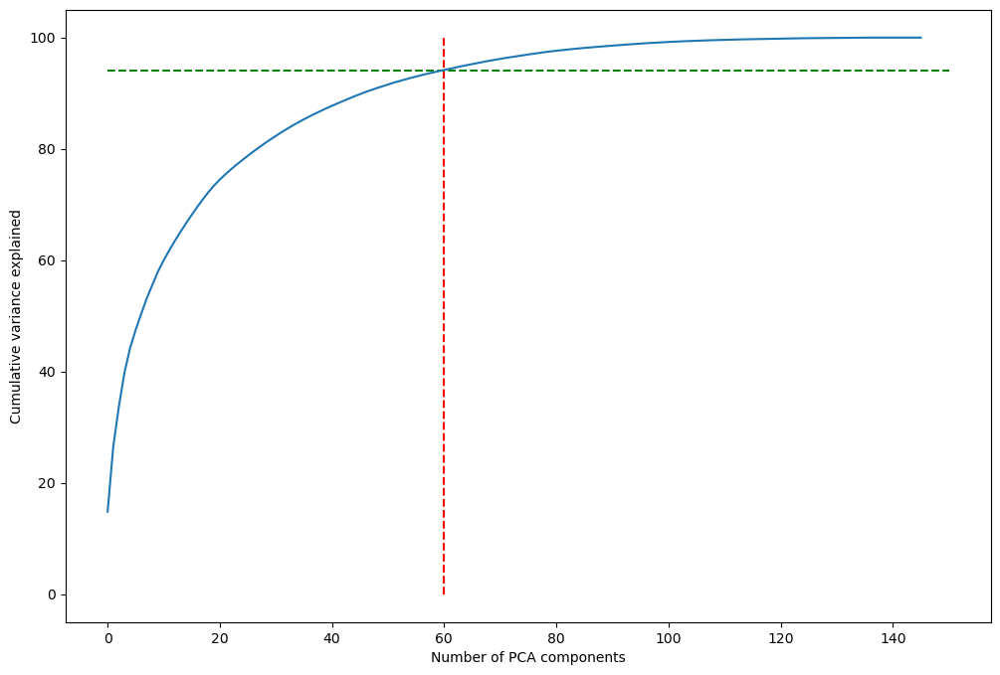

In [168]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=60, ymax=100, ymin=0, colors="r", linestyles="--")
plt.hlines(y=94, xmax=150, xmin=0, colors="g", linestyles="--")
plt.plot(var_cum)
plt.xlabel('Number of PCA components')
plt.ylabel("Cumulative variance explained")
plt.show()

<a>Looks like 60 components are enough to describe 94% of the variance in the dataset. We'll choose 60 components for our modeling

### 6) Adopting Incremental PCA 

Let us Build the dataframe using Incremental PCA for better efficiency.


In [169]:
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components = 60)

X_train_pca = pca_final.fit_transform(X_train)

In [170]:
print("Size of earlier dataset was :",X_train.shape)
print("Size of dataset after PCA is:", X_train_pca.shape)

Size of earlier dataset was : (21000, 146)
Size of dataset after PCA is: (21000, 60)


In [171]:
#creating correlation matrix for the given data
corrmat = np.corrcoef(X_train_pca.transpose())

#Make a diagonal matrix with diagonal entry of Matrix corrmat
p = np.diagflat(corrmat.diagonal())

# subtract diagonal entries making all diagonals 0
corrmat_diag_zero = corrmat - p
print("max positive corr:",round(corrmat_diag_zero.max(),3), ", min negative corr: ", round(corrmat_diag_zero.min(),3))

max positive corr: 0.004 , min negative corr:  -0.005


<a>We can see from the above calculations that the correlation among the attributes is almost 0, we can proceed with these principal components.

In [172]:
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(9001, 60)

### 7) Model Building <br>

Let us now build various models on this PCA Transformed dataset to predict churn

## <a> Model1- PCA and Logistic Regression

In [173]:
from sklearn.linear_model import LogisticRegression

# Make an instance of the Model.
# default solver is very slow so changed to 'lbfgs'
lr = LogisticRegression(solver = 'lbfgs',class_weight="balanced")

In [174]:
X_train_pca.shape, y_train.shape

((21000, 60), (21000,))

In [175]:
# Training the model on the data
lr.fit(X_train_pca, y_train)

LogisticRegression(class_weight='balanced')

In [176]:
#prediction on test data
y_pred = lr.predict(X_test_pca)

#create confusion matrix
cm = confusion_matrix(y_test,y_pred)
print("confusoin matrix \t\n",cm)

#checking sesitivity 
print("sensitivity \t", (cm[1,1]/(cm[1,0]+cm[1,1])).round(2))


#checking  specificity
print("specificity \t", (cm[0,0]/(cm[0,0]+cm[0,1])).round(2))

#check area under the curve
from sklearn.metrics import roc_auc_score
print("area under the curve \t",round(roc_auc_score(y_test,y_pred),2))

confusoin matrix 	
 [[6906 1363]
 [ 126  606]]
sensitivity 	 0.83
specificity 	 0.84
area under the curve 	 0.83


## Hyper Parameter tuning -  Logistic Regression

In [177]:
logistic = LogisticRegression(solver = 'lbfgs',class_weight= "balanced")
penalty = ['l1', 'l2','elasticnet']
C = [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000]

param_grid = dict(penalty=penalty,
                  C=C)

# #creating 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4) 

#GradientSearchCV
logreg_model =  GridSearchCV(estimator=logistic,
                    param_grid=param_grid,
                    scoring='roc_auc',
                    cv = folds,
                    verbose=1,
                    n_jobs=-1)

In [178]:
#model fitting
logreg_model.fit(X_train_pca,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(class_weight='balanced'), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             scoring='roc_auc', verbose=1)

In [179]:
# cross validation results
pd.DataFrame(logreg_model.cv_results_).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.015643,0.001646,0.000000,0.000000,0.0001,l1,"{'C': 0.0001, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
1,0.113966,0.007652,0.007327,0.007383,0.0001,l2,"{'C': 0.0001, 'penalty': 'l2'}",0.885841,0.898977,0.884307,0.883725,0.899345,0.890439,0.007156,8
2,0.013914,0.004015,0.000000,0.000000,0.0001,elasticnet,"{'C': 0.0001, 'penalty': 'elasticnet'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
3,0.018109,0.006065,0.000000,0.000000,0.001,l1,"{'C': 0.001, 'penalty': 'l1'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
4,0.155764,0.012872,0.004923,0.006132,0.001,l2,"{'C': 0.001, 'penalty': 'l2'}",0.895270,0.906415,0.893455,0.895358,0.905696,0.899239,0.005612,7


In [180]:
# print best hyperparameters
print("Best AUC: ", logreg_model.best_score_)
print("Best hyperparameters: ", logreg_model.best_params_)

Best AUC:  0.9000371296014563
Best hyperparameters:  {'C': 0.01, 'penalty': 'l2'}


In [181]:
#fitting the model with best parameters
logistic = LogisticRegression(solver = 'lbfgs',class_weight= "balanced", C = logreg_model.best_params_['C'],penalty=logreg_model.best_params_['penalty'])
logreg_model.fit(X_train_pca, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(class_weight='balanced'), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             scoring='roc_auc', verbose=1)

In [182]:
#prediction on test data
y_pred = logreg_model.predict(X_test_pca)

#create confusion matrix
cm = confusion_matrix(y_test,y_pred)
print("confusoin matrix \t\n",cm)

#checking sesitivity 
print("sensitivity \t", (cm[1,1]/(cm[1,0]+cm[1,1])).round(2))


#checking  specificity
print("specificity \t", (cm[0,0]/(cm[0,0]+cm[0,1])).round(2))

# check area under curve
y_pred_prob = logreg_model.predict_proba(X_test_pca)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

confusoin matrix 	
 [[6900 1369]
 [ 126  606]]
sensitivity 	 0.83
specificity 	 0.83
AUC:    	 0.9


In [183]:
## <a> Model2- PCA and SVM

In [184]:
X_train_pca.shape, y_train.shape

((21000, 60), (21000,))

In [185]:
# linear model

model_linear = SVC(kernel='linear', class_weight="balanced")
model_linear.fit(X_train_pca, y_train)

# predict
y_pred = model_linear.predict(X_test_pca)

In [186]:
# confusion matrix and accuracy

# accuracy
print("accuracy:", accuracy_score(y_true=y_test, y_pred=y_pred), "\n")

# cm
print(confusion_matrix(y_true=y_test, y_pred=y_pred))

accuracy: 0.8472391956449283 

[[7028 1241]
 [ 134  598]]


In [187]:
# non-linear model
# using rbf kernel, C=1, default value of gamma

# model
non_linear_model = SVC(kernel='rbf',class_weight="balanced")

# fit
non_linear_model.fit(X_train_pca, y_train)

# predict
y_pred = non_linear_model.predict(X_test_pca)

In [188]:
# confusion matrix and accuracy

# accuracy
print("accuracy:", accuracy_score(y_true=y_test, y_pred=y_pred), "\n")

# cm
print(confusion_matrix(y_true=y_test, y_pred=y_pred))

accuracy: 0.8879013442950783 

[[7421  848]
 [ 161  571]]


## Hyper Parameter tuning for SVC

- ### <a> ****Note: The Below GridSearch Step will take almost 40-45 mins to run.****

In [189]:
from sklearn.model_selection import StratifiedKFold
# creating a KFold object with 5 splits 
folds = StratifiedKFold(n_splits = 3, shuffle = True, random_state = 100) 

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [1e-1, 1e-2],
                     'C': [1, 10]}]


# specify model
model = SVC(class_weight= "balanced",random_state = 100, kernel = 'linear')

# set up GridSearchCV()
model_cv =  GridSearchCV(estimator=model,
                    param_grid=hyper_params,
                         cv = folds,
                    refit = True, verbose = 3,return_train_score=True, n_jobs= -1)   

# fit the model
model_cv.fit(X_train_pca, y_train)                  
               


Fitting 3 folds for each of 4 candidates, totalling 12 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=100, shuffle=True),
             estimator=SVC(class_weight='balanced', kernel='linear',
                           random_state=100),
             n_jobs=-1, param_grid=[{'C': [1, 10], 'gamma': [0.1, 0.01]}],
             return_train_score=True, verbose=3)

In [190]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,91.657795,2.485375,5.337349,0.601709,1,0.1,"{'C': 1, 'gamma': 0.1}",0.850714,0.852000,0.846000,0.849571,0.002579,3,0.853643,0.850286,0.851071,0.851667,0.001434
1,91.901926,2.512944,5.302027,0.572622,1,0.01,"{'C': 1, 'gamma': 0.01}",0.850714,0.852000,0.846000,0.849571,0.002579,3,0.853643,0.850286,0.851071,0.851667,0.001434
2,525.062656,14.660820,2.764260,0.054284,10,0.1,"{'C': 10, 'gamma': 0.1}",0.850714,0.852143,0.846143,0.849667,0.002559,1,0.853643,0.850429,0.850929,0.851667,0.001412
3,497.794196,6.988951,2.621559,0.213094,10,0.01,"{'C': 10, 'gamma': 0.01}",0.850714,0.852143,0.846143,0.849667,0.002559,1,0.853643,0.850429,0.850929,0.851667,0.001412


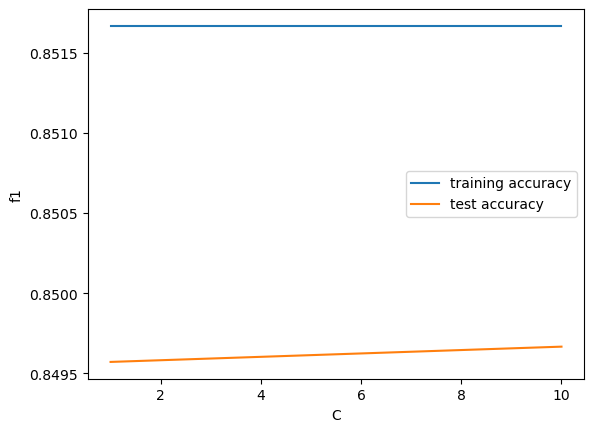

In [191]:
# plotting 'C'

plt.figure()
plt.plot(model_cv.cv_results_["param_C"], 
model_cv.cv_results_["mean_train_score"], 
label="training accuracy")
plt.plot(model_cv.cv_results_["param_C"], 
model_cv.cv_results_["mean_test_score"], 
label="test accuracy")
plt.xlabel('C')
plt.ylabel("f1")
plt.legend()
plt.show()

In [192]:
# printing the optimal accuracy score and hyperparameters
best_score = model_cv.best_score_
best_hyperparams = model_cv.best_params_

print("The best test score is {0} corresponding to hyperparameters {1}".format(best_score, best_hyperparams))

The best test score is 0.8496666666666667 corresponding to hyperparameters {'C': 10, 'gamma': 0.1}


## Building and Evaluating the Final Model

In [193]:
# model with optimal hyperparameters

# model
model = SVC(C=1, gamma=0.01, class_weight= 'balanced',random_state=100,kernel = 'linear',verbose = 1)

model.fit(X_train_pca, y_train)
y_pred = model.predict(X_test_pca)

# metrics
print("accuracy", accuracy_score(y_test, y_pred), "\n")
print(confusion_matrix(y_test, y_pred), "\n")
print(classification_report(y_test, y_pred), "\n")


[LibSVM]accuracy 0.8472391956449283 

[[7028 1241]
 [ 134  598]] 

              precision    recall  f1-score   support

           0       0.98      0.85      0.91      8269
           1       0.33      0.82      0.47       732

    accuracy                           0.85      9001
   macro avg       0.65      0.83      0.69      9001
weighted avg       0.93      0.85      0.87      9001
 



In [194]:
#create confusion matrix
cm = confusion_matrix(y_test,y_pred)
print("confusoin matrix \t\n",cm)

#checking sesitivity 
print("sensitivity \t", (cm[1,1]/(cm[1,0]+cm[1,1])).round(2))


#checking  specificity
print("specificity \t", (cm[0,0]/(cm[0,0]+cm[0,1])).round(2))

# check area under curve
y_pred_prob = logreg_model.predict_proba(X_test_pca)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2)) 

confusoin matrix 	
 [[7028 1241]
 [ 134  598]]
sensitivity 	 0.82
specificity 	 0.85
AUC:    	 0.9


## <a> Model3 PCA and Random Forest



#### Default Hyperparameters
Let's first fit a random forest model with default hyperparameters.

In [195]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc = RandomForestClassifier()

In [196]:
# fit
rfc.fit(X_train_pca,y_train)

RandomForestClassifier()

In [197]:
# Making predictions
predictions = rfc.predict(X_test_pca)

In [198]:
# Let's check the report of our default model
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      8269
           1       0.71      0.19      0.30       732

    accuracy                           0.93      9001
   macro avg       0.82      0.59      0.63      9001
weighted avg       0.91      0.93      0.91      9001



In [199]:
# Printing confusion matrix
print(confusion_matrix(y_test,predictions))

[[8212   57]
 [ 592  140]]


In [200]:
print(accuracy_score(y_test,predictions))

0.9278969003444062


So far so good, let's now look at the list of hyperparameters which we can tune to improve model performance.

<hr>

### Hyperparameter Tuning

### Tuning max_depth

Let's try to find the optimum values for ```max_depth``` and understand how the value of max_depth impacts the overall accuracy of the ensemble.


In [201]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestClassifier(class_weight= 'balanced', random_state=100)


# fit tree on training data
rf = GridSearchCV(rf, parameters, cv=n_folds, 
                   scoring="accuracy",verbose =1, n_jobs = -1, return_train_score=True)
rf.fit(X_train_pca, y_train)

print(rf.best_score_)
print(rf.best_params_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
0.9262380952380953
{'max_depth': 17}


In [202]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,8.897948,0.189138,0.089908,0.005637,2,{'max_depth': 2},0.834286,0.846905,0.848810,0.837619,0.845476,0.842619,0.005644,4,0.845714,0.843333,0.843393,0.847143,0.848214,0.845560,0.001961
1,23.806906,0.576470,0.112583,0.005106,7,{'max_depth': 7},0.881429,0.890238,0.901667,0.882857,0.887381,0.888714,0.007201,3,0.905238,0.907857,0.904643,0.903393,0.904107,0.905048,0.001531
2,32.616839,0.466160,0.133116,0.008211,12,{'max_depth': 12},0.916667,0.917857,0.928333,0.918333,0.917857,0.919810,0.004297,2,0.961964,0.965238,0.962560,0.962560,0.965238,0.963512,0.001426
3,30.178858,3.198456,0.096351,0.013728,17,{'max_depth': 17},0.927857,0.922857,0.928333,0.926190,0.925952,0.926238,0.001925,1,0.980119,0.981726,0.978869,0.981667,0.981964,0.980869,0.001194


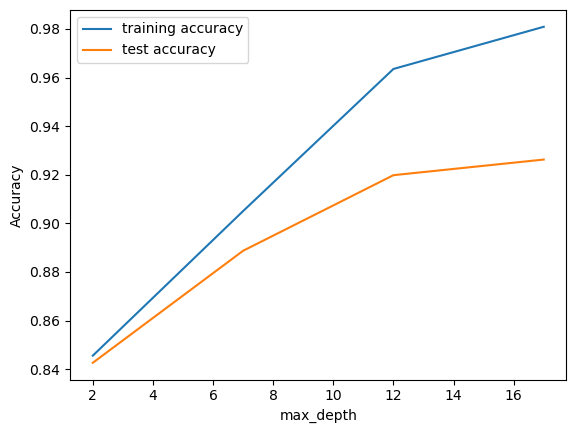

In [203]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


You can see that as we increase the value of max_depth, both train and test scores increase till a point, but after that test score starts to decrease. The ensemble tries to overfit as we increase the max_depth.

Thus, controlling the depth of the constituent trees will help reduce overfitting in the forest.

<hr>

### Tuning n_estimators

Let's try to find the optimum values for n_estimators and understand how the value of n_estimators impacts the overall accuracy. Notice that we'll specify an appropriately low value of max_depth, so that the trees do not overfit.
<br>


In [204]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 1500, 500)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=4, class_weight ='balanced', random_state=100)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, verbose = 1,
                   scoring="accuracy",return_train_score=True, n_jobs = -1)
rf.fit(X_train_pca, y_train)

print(rf.best_score_)
print(rf.best_params_)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
0.8618571428571429
{'n_estimators': 1100}


In [205]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,13.985413,0.186706,0.139470,0.031311,100,{'n_estimators': 100},0.852143,0.861190,0.867619,0.847143,0.855476,0.856714,0.007113,3,0.864405,0.865119,0.862143,0.864702,0.863452,0.863964,0.001063
1,87.456803,0.797996,0.556482,0.054655,600,{'n_estimators': 600},0.858333,0.863095,0.872619,0.854048,0.859286,0.861476,0.006271,2,0.870000,0.869643,0.865655,0.866607,0.865000,0.867381,0.002060
2,126.505279,18.432628,0.623842,0.162643,1100,{'n_estimators': 1100},0.858333,0.863571,0.873095,0.854286,0.860000,0.861857,0.006363,1,0.870655,0.870000,0.866190,0.867262,0.865357,0.867893,0.002088


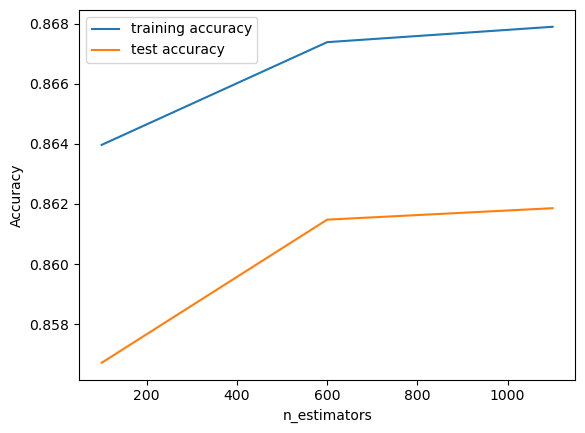

In [206]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


<hr>

### Tuning max_features

Let's see how the model performance varies with ```max_features```, which is the maximum numbre of features considered for splitting at a node.

In [207]:

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4,class_weight='balanced',random_state=100)


# fit tree on training data
rf = GridSearchCV(rf, parameters, verbose = 1,cv=n_folds, 
                   scoring="accuracy",n_jobs = -1, return_train_score = True)
rf.fit(X_train_pca, y_train)

print(rf.best_score_)
print(rf.best_params_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
0.8616666666666667
{'max_features': 4}


In [208]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,8.464496,0.128440,0.096529,0.004558,4,{'max_features': 4},0.855238,0.863571,0.869762,0.858571,0.861190,0.861667,0.004905,1,0.869702,0.867798,0.866726,0.866369,0.866250,0.867369,0.001288
1,16.402554,0.334165,0.104510,0.009699,8,{'max_features': 8},0.852381,0.853571,0.867381,0.851905,0.851429,0.855333,0.006066,3,0.863393,0.861488,0.857917,0.863036,0.859405,0.861048,0.002105
2,27.586284,0.375731,0.086612,0.002418,14,{'max_features': 14},0.852143,0.862143,0.866190,0.848810,0.850238,0.855905,0.006947,2,0.864940,0.864286,0.860357,0.863333,0.860119,0.862607,0.002002
3,38.829981,0.602913,0.103977,0.011627,20,{'max_features': 20},0.847619,0.855476,0.860238,0.844048,0.847381,0.850952,0.005970,4,0.860476,0.858750,0.855655,0.855238,0.855833,0.857190,0.002061
4,39.831805,4.695186,0.052524,0.009267,24,{'max_features': 24},0.852857,0.852857,0.856190,0.838810,0.844286,0.849000,0.006442,5,0.862024,0.854643,0.849702,0.853214,0.850952,0.854107,0.004315


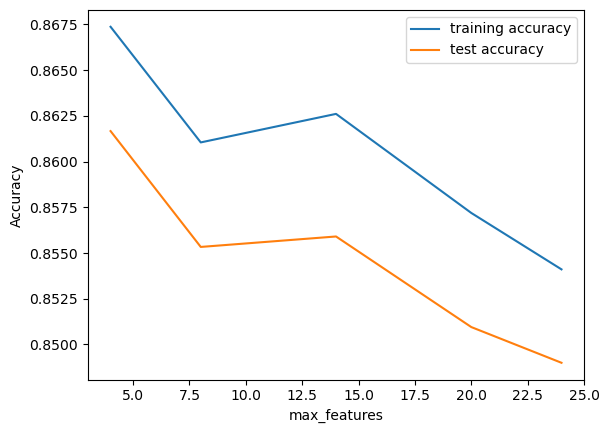

In [209]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


The training and test scores *both* seem to increase as we increase max_features, and the model doesn't seem to overfit more with increasing max_features. 

### Tuning min_samples_leaf

The hyperparameter **min_samples_leaf** is the minimum number of samples required to be at a leaf node:
- If int, then consider min_samples_leaf as the minimum number.
- If float, then min_samples_leaf is a percentage and ceil(min_samples_leaf * n_samples) are the minimum number of samples for each node.

Let's now check the optimum value for min samples leaf in our case.

In [210]:

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight ='balanced',random_state=100)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",verbose =1, return_train_score = True, n_jobs = -1)
rf.fit(X_train_pca, y_train)
print(rf.best_score_)
print(rf.best_params_)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
0.8775238095238095
{'min_samples_leaf': 100}


In [211]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,24.891679,0.496455,0.142381,0.024704,100,{'min_samples_leaf': 100},0.873333,0.880238,0.888810,0.869048,0.876190,0.877524,0.006722,1,0.889881,0.890536,0.887798,0.884940,0.886369,0.887905,0.002097
1,22.232312,0.757714,0.123078,0.019455,150,{'min_samples_leaf': 150},0.863571,0.873095,0.879524,0.857857,0.867143,0.868238,0.007506,2,0.878155,0.881786,0.878214,0.874762,0.876071,0.877798,0.002383
2,20.324873,0.369947,0.124343,0.013960,200,{'min_samples_leaf': 200},0.860238,0.865000,0.872619,0.853095,0.856190,0.861429,0.006874,3,0.871369,0.870357,0.868512,0.869881,0.867679,0.869560,0.001315
3,18.962091,0.339420,0.138059,0.019780,250,{'min_samples_leaf': 250},0.858810,0.861905,0.867143,0.853333,0.854762,0.859190,0.004993,4,0.871250,0.866667,0.863095,0.866369,0.865417,0.866560,0.002659
4,17.075954,1.207384,0.116325,0.030575,300,{'min_samples_leaf': 300},0.853571,0.857143,0.867143,0.848571,0.856190,0.856524,0.006086,5,0.865417,0.864107,0.863512,0.862619,0.860298,0.863190,0.001708


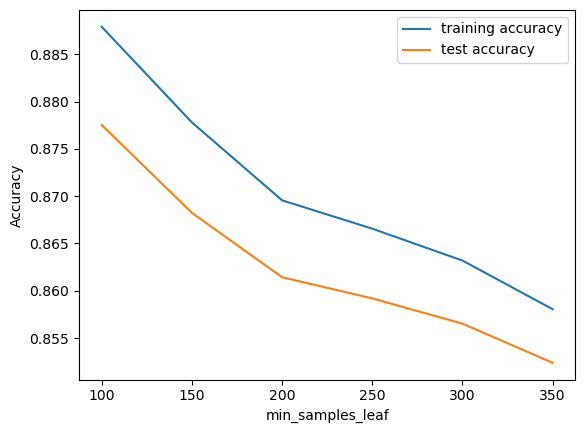

In [212]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can see that the model starts of overfit as you decrease the value of min_samples_leaf. 

### Tuning min_samples_split

Let's now look at the performance of the ensemble as we vary min_samples_split.

In [213]:

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(200, 500, 50)}

# instantiate the model
rf = RandomForestClassifier(class_weight = 'balanced',random_state=100)


# fit tree on training data
rf = GridSearchCV(rf, parameters, verbose = 1,
                    cv=n_folds, 
                   scoring="accuracy",n_jobs =-1, return_train_score = True)
rf.fit(X_train_pca, y_train)

print(rf.best_score_)
print(rf.best_params_)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
0.9013809523809524
{'min_samples_split': 200}


In [214]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,33.312796,0.203643,0.130038,0.007316,200,{'min_samples_split': 200},0.896667,0.903095,0.910714,0.895476,0.900952,0.901381,0.005428,1,0.921607,0.922917,0.920536,0.917976,0.920833,0.920774,0.001623
1,32.504491,0.370612,0.130356,0.009235,250,{'min_samples_split': 250},0.887857,0.893571,0.902381,0.887619,0.894286,0.893143,0.005390,2,0.911845,0.911429,0.913095,0.910179,0.911369,0.911583,0.000938
2,31.261908,0.543901,0.123419,0.016717,300,{'min_samples_split': 300},0.880476,0.886429,0.899048,0.885000,0.888571,0.887905,0.006171,3,0.903274,0.904167,0.905476,0.903810,0.901964,0.903738,0.001146
3,29.280781,0.655958,0.127320,0.009249,350,{'min_samples_split': 350},0.881190,0.883571,0.894762,0.880000,0.882857,0.884476,0.005293,4,0.901429,0.897917,0.898393,0.896012,0.895238,0.897798,0.002158
4,27.452094,1.669471,0.118802,0.003906,400,{'min_samples_split': 400},0.875000,0.878571,0.889524,0.878810,0.880238,0.880429,0.004864,5,0.895714,0.894167,0.890714,0.893929,0.892321,0.893369,0.001708


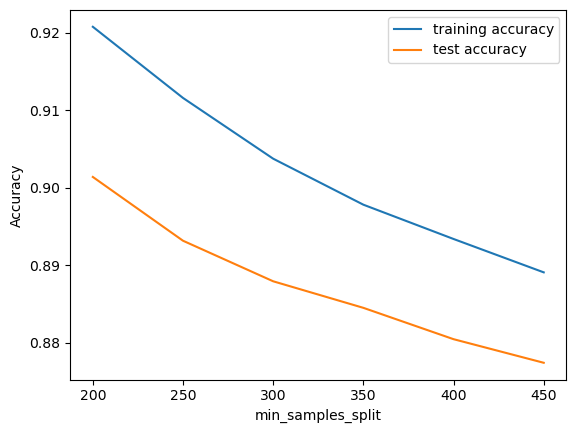

In [215]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

<hr>

## Grid Search to Find Optimal Hyperparameters

We can now find the optimal hyperparameters using GridSearchCV.

- ### <a> ****Note: The Below GridSearch Step will take almost 30-35 mins to run.****

In [216]:
# Create the parameter grid based on the results of random search  
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [5, 10]}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [217]:
# Fit the grid search to the data
grid_search.fit(X_train_pca, y_train)


Fitting 3 folds for each of 72 candidates, totalling 216 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [4, 8, 10], 'max_features': [5, 10],
                         'min_samples_leaf': range(100, 400, 200),
                         'min_samples_split': range(200, 500, 200),
                         'n_estimators': [100, 200, 300]},
             verbose=1)

In [218]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9188095238095239 using {'max_depth': 8, 'max_features': 10, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 200}


In [219]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,class_weight = 'balanced',
                             max_depth=grid_search.best_params_['max_depth'],
                             min_samples_split=grid_search.best_params_['min_samples_split'],
                             max_features=grid_search.best_params_['max_features'],n_estimators =grid_search.best_params_['n_estimators'], random_state=100)

In [220]:
# fit
rfc.fit(X_train_pca,y_train)

RandomForestClassifier(class_weight='balanced', max_depth=8, max_features=10,
                       min_samples_split=200, n_estimators=200,
                       random_state=100)

In [221]:
# predict
predictions = rfc.predict(X_test_pca)

In [222]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.97      0.89      0.93      8269
           1       0.37      0.73      0.49       732

    accuracy                           0.88      9001
   macro avg       0.67      0.81      0.71      9001
weighted avg       0.92      0.88      0.89      9001



In [223]:
#create confusion matrix
cm = confusion_matrix(y_test,predictions)
print("confusoin matrix \t\n",cm)

#checking sesitivity 
print("sensitivity \t", (cm[1,1]/(cm[1,0]+cm[1,1])).round(2))


#checking  specificity
print("specificity \t", (cm[0,0]/(cm[0,0]+cm[0,1])).round(2))

# check area under curve
y_pred_prob = rfc.predict_proba(X_test_pca)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2)) 

confusoin matrix 	
 [[7351  918]
 [ 196  536]]
sensitivity 	 0.73
specificity 	 0.89
AUC:    	 0.89


### 8) Final Choice of Model
Recall is the most important business metric for the telecom churn problem. The company would like to identify most customers at risk of churning, even if there are many customers that are misclassified as churn. The cost to the company of churning is much higher than having a few false positives.

##### $Model/Metricity$

#### a) Logistic Regression
    - Sensitivity/Recall  - .83
    - Specificity         - .83
    - Roc AUC Score       - .90 
    
#### b) SMV
    - Sensitivity/Recall  - .82
    - Specificity         - .85
    - Roc AUC Score       - .90 
    
    
#### c) Random Forest
    - Sensitivity/Recall  - .73
    - Specificity         - .90
    - Roc AUC Score       - .90    
 

<a> **INFERENCE:**<br>    

We choose logistic regression from all the above models as it has less time complexity and take less memory compared to all above models. Morevover, its sensitivity is very good which is our prime requirement in this case study.

## `PART 2: -  Interpretable models` 

Let us now build models to identify the churn indicators. Identification of these churn indicators will help in retaining customers that are likely to churn.

In [224]:
# create a copy of dataset
high_df = high_val.copy()
high_df.head()

,cust_id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,churn,aon_yr,age_group
0,4919,197.385,214.816,213.803,265.618262,272.70047,0.00,380.608111,384.994337,0.86,16.408431,12.872921,0.00,27.063178,20.51937,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.31,4.13,0.00,0.00,1.15,0.56,1.15,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.26,2.44,5.44,0.0,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1118.0,1,2.7,2
7,4919,1069.180,1261.272,1255.019,57.840000,54.68000,52.29,453.430000,567.160000,325.91,16.230000,33.490000,31.64,23.740000,12.59000,38.06,51.39,31.38,40.28,308.63,447.38,162.28,30.43,31.13,28.39,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,6.68,5.93,60.86,75.14,77.84,4.5,0.0,6.50,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,71.56,73.34,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,122.09,114.08,11.18,11.53,10.49,180.54,173.08,181.08,626.46,558.04,428.74,0.0,2.06,14.53,31.59,5,5,7,1480,790,1490,459,459,440,0,0,252,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,-1.0,-1.0,-1.0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,57.74,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3043.0,2370.0,1,2.2,2
8,4919,378.721,492.223,137.362,413.690000,351.03000,35.08,94.660000,80.630000,136.48,0.000000,0.000000,0.00,0.000000,0.00000,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.0,10.23,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.0,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0

## 1) Data Preparation

### a) Let us drop highly correlated features

a) 2G data recharge in the month of june

<Axes: >

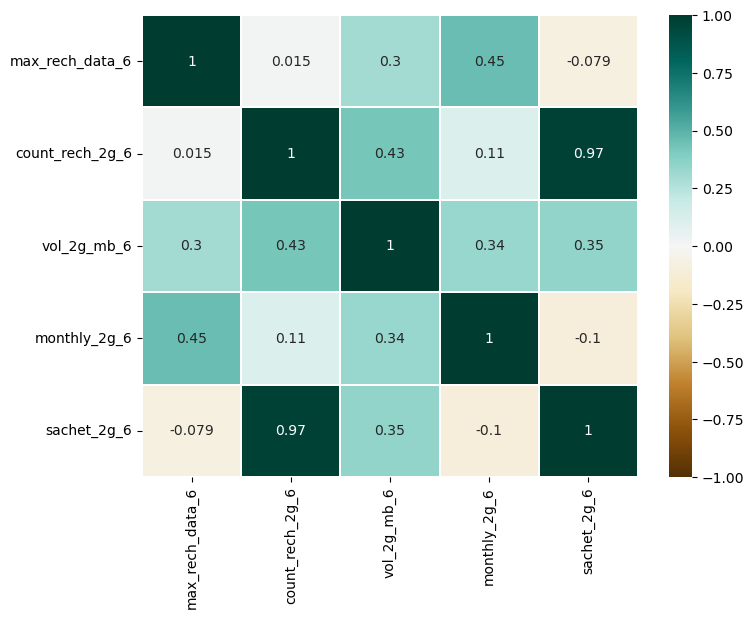

In [225]:
col_2g_6 = ['max_rech_data_6','count_rech_2g_6','vol_2g_mb_6','monthly_2g_6','sachet_2g_6']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[col_2g_6].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<A> We observe that count_rech_2g_6 has high correlation with other features. Let us drop count_rech_2g_6 to avoid multicollinearity.

In [226]:
high_df.drop('count_rech_2g_6',1,inplace = True)

b) 2G data recharge in the month of july

<Axes: >

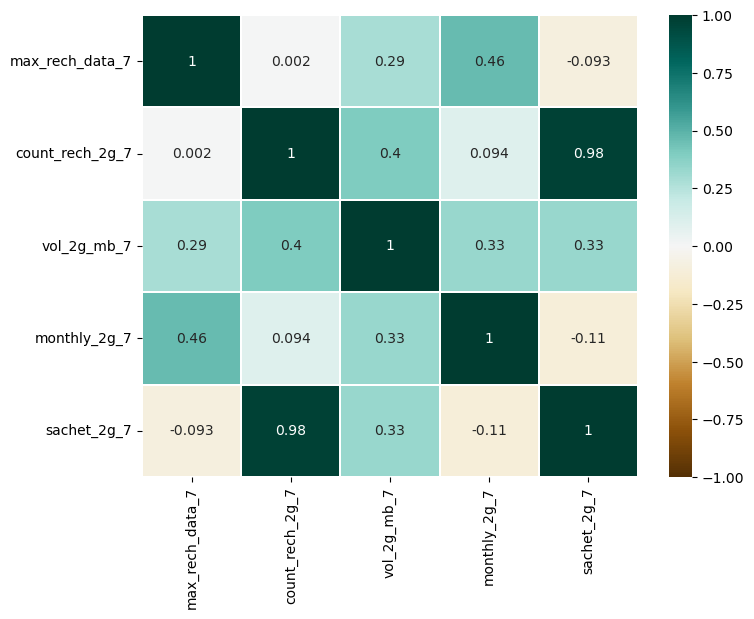

In [227]:
col_2g_7 = ['max_rech_data_7','count_rech_2g_7','vol_2g_mb_7','monthly_2g_7','sachet_2g_7']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[col_2g_7].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<A> We observe that `count_rech_2g_7` has high correlation with other features. Let us drop count_rech_2g_6 to avoid multicollinearity.

In [228]:
high_df.drop('count_rech_2g_7',1,inplace = True)

c) 2G data recharge in the month of August

<Axes: >

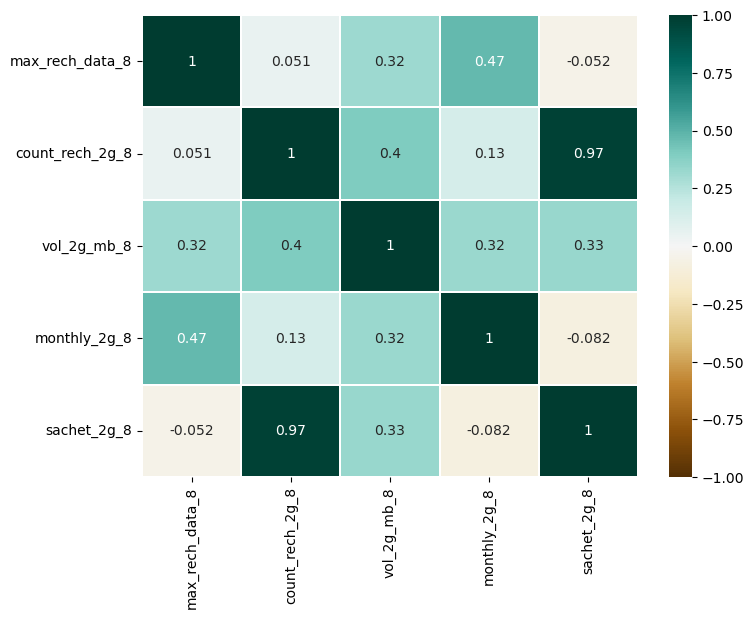

In [229]:
col_2g_8 = ['max_rech_data_8','count_rech_2g_8','vol_2g_mb_8','monthly_2g_8','sachet_2g_8']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[col_2g_8].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<A> We observe that `count_rech_2g_8` has high correlation with other features. Let us drop count_rech_2g_6 to avoid multicollinearity.

In [230]:
high_df.drop('count_rech_2g_8',1,inplace = True)

d) 3G data recharge in the month of june

<Axes: >

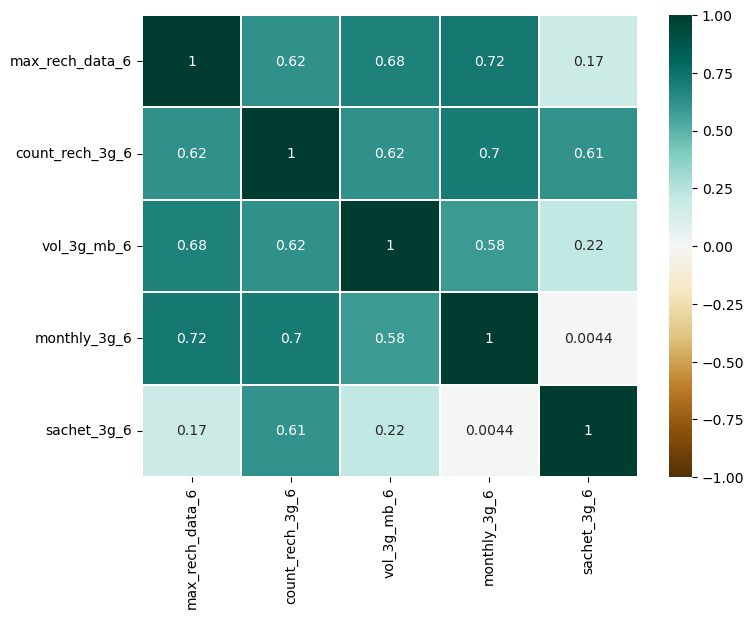

In [231]:
col_3g_6 = ['max_rech_data_6','count_rech_3g_6','vol_3g_mb_6','monthly_3g_6','sachet_3g_6']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[col_3g_6].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<A> We observe that count_rech_3g_6 has high correlation with other features. Let us drop count_rech_2g_6 to avoid multicollinearity.

In [232]:
high_df.drop('count_rech_3g_6',1,inplace = True)

e) 3G data recharge in the month of july

<Axes: >

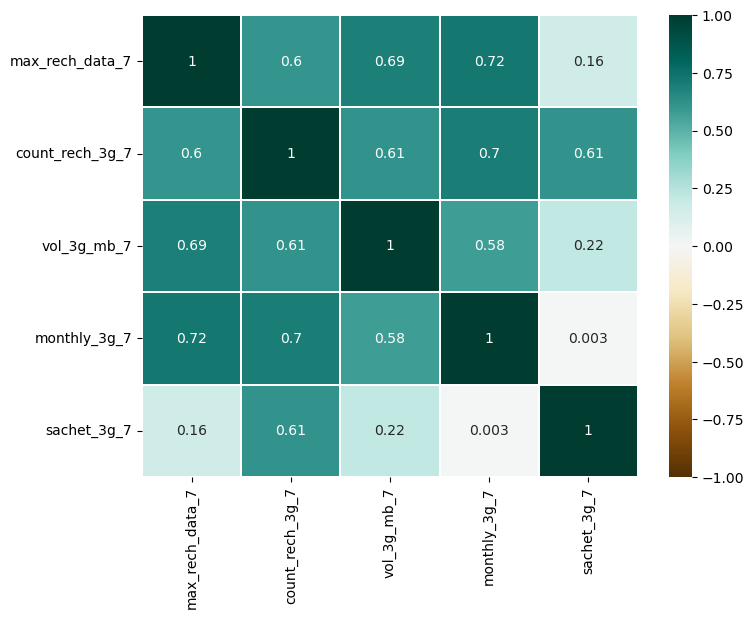

In [233]:
col_3g_7 = ['max_rech_data_7','count_rech_3g_7','vol_3g_mb_7','monthly_3g_7','sachet_3g_7']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[col_3g_7].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<A> We observe that `count_rech_3g_7` has high correlation with other features. Let us drop count_rech_2g_6 to avoid multicollinearity.

In [234]:
high_df.drop('count_rech_3g_7',1,inplace = True)

f) 3G data recharge in the month of August

<Axes: >

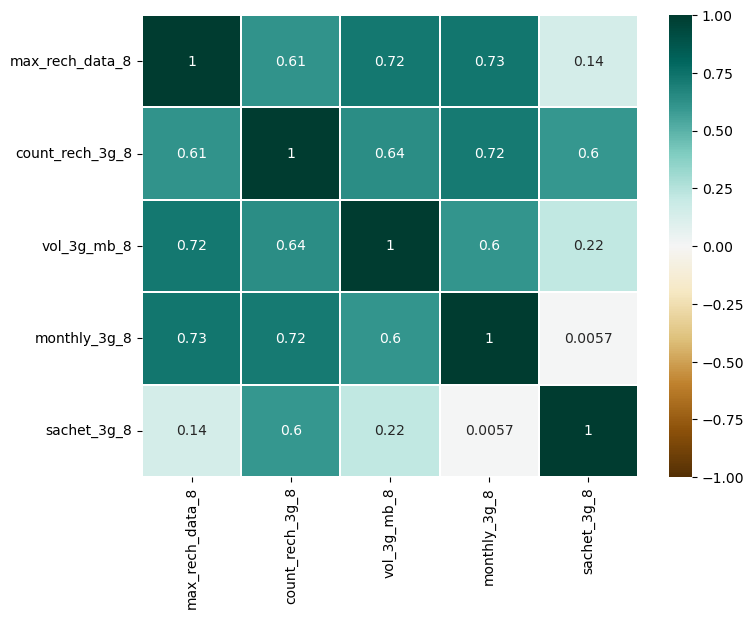

In [235]:
col_3g_8 = ['max_rech_data_8','count_rech_3g_8','vol_3g_mb_8','monthly_3g_8','sachet_3g_8']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[col_3g_8].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<A> We observe that `count_rech_3g_8` has high correlation with other features. Let us drop count_rech_2g_6 to avoid multicollinearity.

In [236]:
high_df.drop('count_rech_3g_8',1,inplace = True)

g) Total outgoing calls made in the month of june

<Axes: >

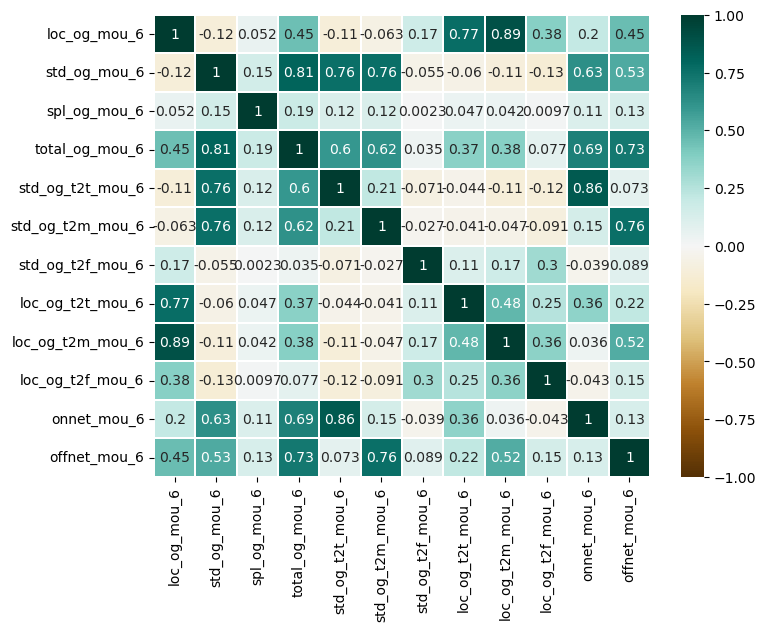

In [237]:
og_col_6 = ['loc_og_mou_6','std_og_mou_6','spl_og_mou_6','total_og_mou_6','std_og_t2t_mou_6','std_og_t2m_mou_6','std_og_t2f_mou_6','loc_og_t2t_mou_6','loc_og_t2m_mou_6','loc_og_t2f_mou_6','onnet_mou_6','offnet_mou_6']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[og_col_6].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<a> We observe that loc_og_mou_6, std_og_mou_6 tot, l_og_mou_6, onnet_7 & offnet_6 have strong correlation with other features. These features should be taken care of to handle multicollinearity.

In [238]:
high_df.drop(['loc_og_mou_6', 'std_og_mou_6','total_og_mou_6','offnet_mou_6','onnet_mou_6'],1,inplace=True)

h) Total outgoing calls made in the month of july

<Axes: >

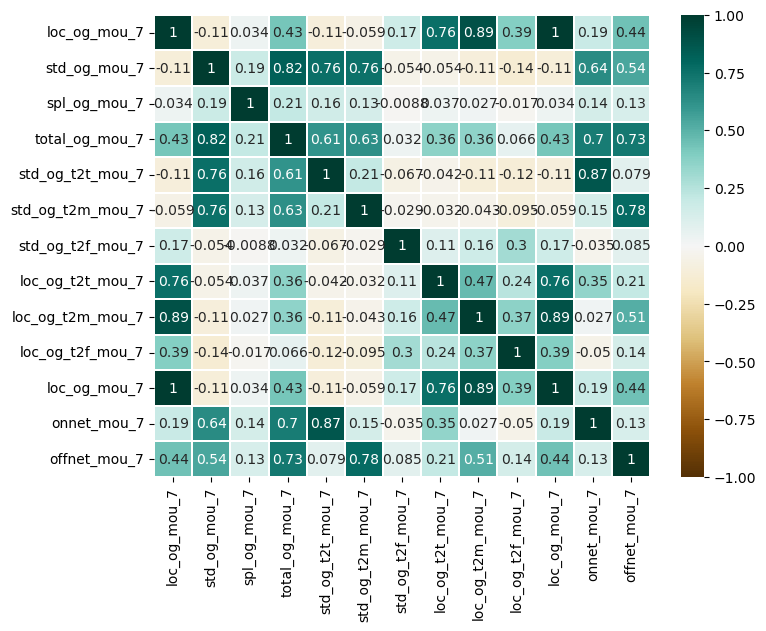

In [239]:
og_col_7 = ['loc_og_mou_7','std_og_mou_7','spl_og_mou_7','total_og_mou_7','std_og_t2t_mou_7','std_og_t2m_mou_7','std_og_t2f_mou_7','loc_og_t2t_mou_7','loc_og_t2m_mou_7','loc_og_t2f_mou_7','loc_og_mou_7','onnet_mou_7','offnet_mou_7']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[og_col_7].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<a> We observe that loc_og_mou_7, std_og_mou_7 and total_og_mou_7 have strong correlation with other features. These features should be taken care of to handle multicollinearity.

In [240]:
high_df.drop(['loc_og_mou_7', 'std_og_mou_7','total_og_mou_7','onnet_mou_7','offnet_mou_7'],1,inplace=True)

i) Total outgoing calls made in the month of August

<Axes: >

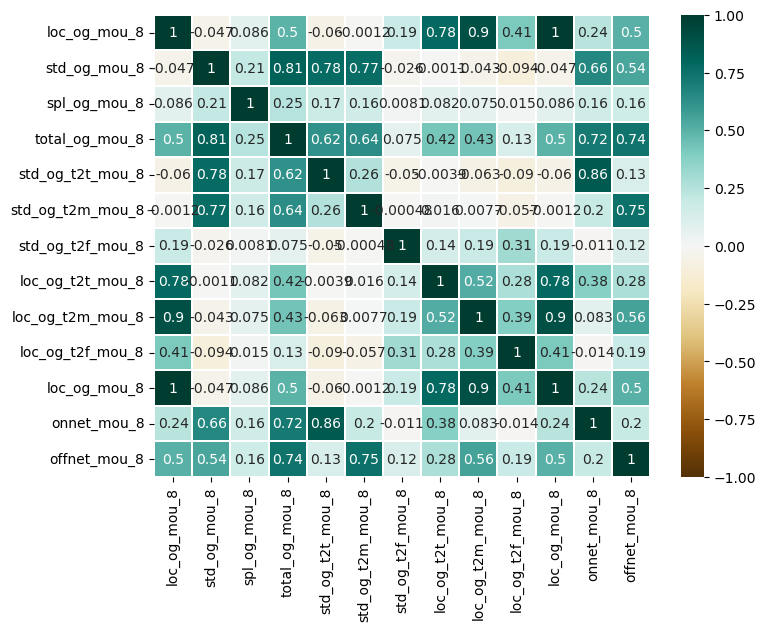

In [241]:
og_col_8 = ['loc_og_mou_8','std_og_mou_8','spl_og_mou_8','total_og_mou_8','std_og_t2t_mou_8','std_og_t2m_mou_8','std_og_t2f_mou_8','loc_og_t2t_mou_8','loc_og_t2m_mou_8','loc_og_t2f_mou_8','loc_og_mou_8','onnet_mou_8','offnet_mou_8']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[og_col_8].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<a> We observe that loc_og_mou_8, std_og_mou_8 and total_og_mou_8 have strong correlation with other features. These features should be taken care of to handle multicollinearity.

In [242]:
high_df.drop(['loc_og_mou_8', 'std_og_mou_8','total_og_mou_8','onnet_mou_8','offnet_mou_8'],1,inplace=True)

j) Total incoming calls made in the month of june

<Axes: >

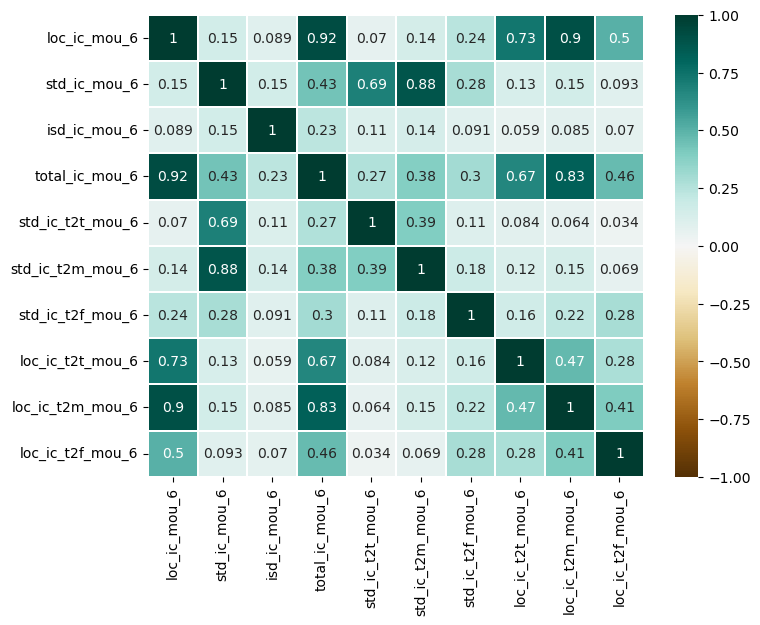

In [243]:
ic_col_6 = ['loc_ic_mou_6','std_ic_mou_6','isd_ic_mou_6','total_ic_mou_6','std_ic_t2t_mou_6','std_ic_t2m_mou_6','std_ic_t2f_mou_6','loc_ic_t2t_mou_6','loc_ic_t2m_mou_6','loc_ic_t2f_mou_6']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[ic_col_6].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<a> We observe that loc_ic_mou_6, std_ic_mou_6 and total_ic_mou_6 have strong correlation with other features. These features should be taken care of to handle multicollinearity.

In [244]:
high_df.drop(['loc_ic_mou_6', 'std_ic_mou_6','total_ic_mou_6'],1,inplace=True)

k) Total incoming calls made in the month of july

<Axes: >

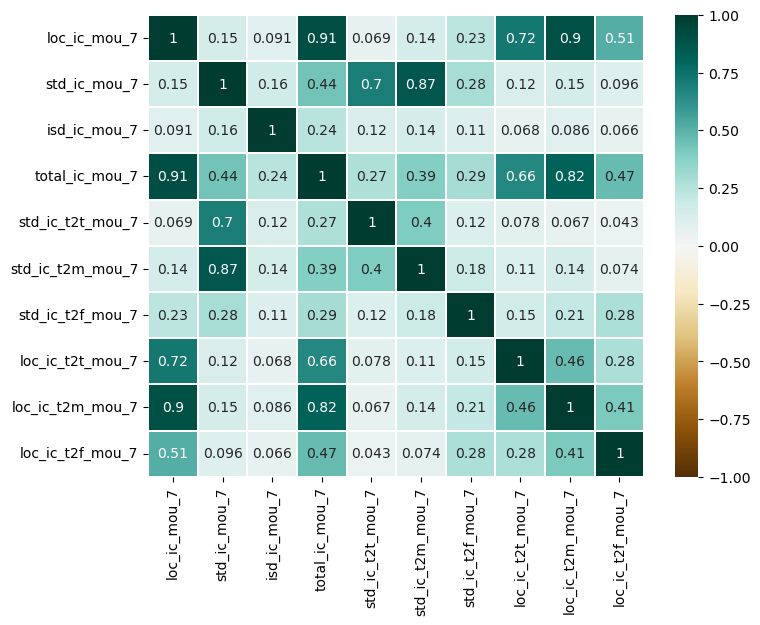

In [245]:
ic_col_7 = ['loc_ic_mou_7','std_ic_mou_7','isd_ic_mou_7','total_ic_mou_7','std_ic_t2t_mou_7','std_ic_t2m_mou_7','std_ic_t2f_mou_7','loc_ic_t2t_mou_7','loc_ic_t2m_mou_7','loc_ic_t2f_mou_7']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[ic_col_7].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<a> We observe that loc_ic_mou_7, std_ic_mou_7 and total_ic_mou_7 have strong correlation with other features. These features should be taken care of to handle multicollinearity.

In [246]:
high_df.drop(['loc_ic_mou_7', 'std_ic_mou_7','total_ic_mou_7'],1,inplace=True)

l) Total incoming calls made in the month of August

<Axes: >

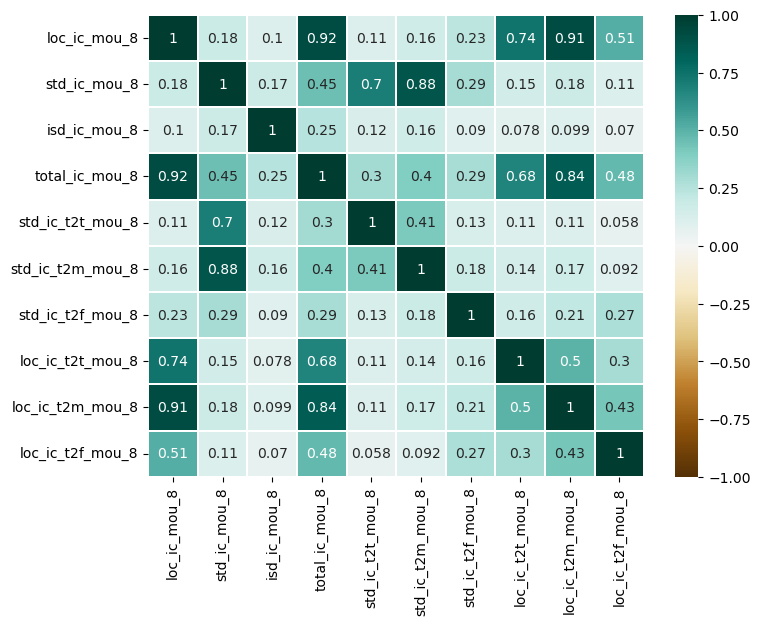

In [247]:
ic_col_8 = ['loc_ic_mou_8','std_ic_mou_8','isd_ic_mou_8','total_ic_mou_8','std_ic_t2t_mou_8','std_ic_t2m_mou_8','std_ic_t2f_mou_8','loc_ic_t2t_mou_8','loc_ic_t2m_mou_8','loc_ic_t2f_mou_8']
plt.figure(figsize=[8,6])
sns.heatmap(high_df[ic_col_8].corr(), annot=True,cmap="BrBG" , robust=True,linewidth=0.1, vmin=-1)

<a> We observe that loc_ic_mou_8, std_ic_mou_8 and total_ic_mou_8 have strong correlation with other features. These features should be taken care of to handle multicollinearity.

In [248]:
high_df.drop(['loc_ic_mou_8', 'std_ic_mou_8','total_ic_mou_8'],1,inplace=True)

In [249]:
# Let us also drop age_group from our dataset as aon_year & age_group are highly correlated.
high_df.drop('age_group',1,inplace=True)

In [250]:
# The shape of final dataset

print("The shape of final dataset is :",high_df.shape)

The shape of final dataset is : (30001, 107)


In [251]:
high_df.head()

,cust_id,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,churn,aon_yr
0,4919,197.385,214.816,213.803,16.408431,12.872921,0.00,27.063178,20.51937,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.16,0.00,0.31,4.13,0.00,0.00,1.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1118.0,1,2.7
7,4919,1069.180,1261.272,1255.019,16.230000,33.490000,31.64,23.740000,12.59000,38.06,51.39,31.38,40.28,308.63,447.38,162.28,30.43,31.13,28.39,0.0,0.0,0.00,4.30,23.29,12.01,49.89,31.76,49.14,6.66,6.68,5.93,4.5,0.0,6.50,58.14,32.26,27.31,217.56,221.49,121.19,71.56,73.34,39.53,36.89,11.83,30.39,91.44,122.09,114.08,11.18,11.53,10.49,0.0,2.06,14.53,31.59,5,5,7,1480,790,1490,459,459,440,0,0,252,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,-1.0,-1.0,-1.0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,57.74,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3043.0,2370.0,1,2.2
8,4919,378.721,492.223,137.362,0.000000,0.000000,0.00,0.000000,0.00000,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,10.23,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.0,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,154.0,23.0,0.00,356.00,0.03,0.00,750.95,11.94,-1.0,0.0,0.0,0,1,0,0,1,3,0,0,0,0,0,0,-1.0,1.0,1.0,21.03,910.65,122.16,0.0,354.0,207.0,437.0,955.0,327.0,1392.0,0,0.9
21,4919,514.453,597.753,637.760,0.000000,0.000000,0.00,0.000000,0.00000,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.93,125.94,61.79,665.36,808.74,842.83,0.00,0.00,0.00,0.0,0.0,0.00,2.48,10.19,19.54,118.23,74.63,129.16,4.61,2.84,10.39,14.06,5.98,0.18,67.69,38.23,101.74,0.00,0.00,0.00,0.0,0.00,0.00,0.00,22,26,27,600,680,718,50,50,50,30,20,50,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,-1.0,-1.0,-1.0,0,0,0,0,0,0,0,0,0,0,0,0,-1.0,-1.0,-1.0,0.00,0.00,0.00,0.0,0.0,0.0,600.0,680.0,718.0,1280.0,0,2.0
23,4919,112.510,193.897,366.966,0.000000,0.000000,0.00,0.000000,0.00000,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,9.38,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,0.00,0.1,0.0,17.71,20.71,61.04,76.64,95.91,113.36,146.84,0.00,0.00,0.71,0.51,0.00,13.38,2.43,14.89,43.91,0.00,0.00,0.00,0.0,0.00

### b) Encoding categorical variables

In [252]:
# encode categorical variables using Label Encoder

# select all categorical variables
df_categorical = high_df.select_dtypes(include=['object'])
df_categorical.drop('churn',1).head()

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
0,0.0,0.0,0.0,1.0,1.0,1.0
7,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
8,-1.0,0.0,0.0,-1.0,1.0,1.0
21,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
23,-1.0,0.0,0.0,-1.0,1.0,1.0


In [253]:
from sklearn import preprocessing
# apply Label encoder to df_categorical
le = preprocessing.LabelEncoder()
df_categorical = df_categorical.apply(le.fit_transform)
df_categorical.head()

,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8,churn
0,1,1,1,2,2,2,1
7,0,0,0,0,0,0,1
8,0,1,1,0,2,2,0
21,0,0,0,0,0,0,0
23,0,1,1,0,2,2,0


In [254]:
# concat df_categorical with original df
high_df = high_df.drop(df_categorical.columns, axis=1)

high_df = pd.concat([high_df, df_categorical], axis=1)
high_df.head()

,cust_id,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,aon_yr,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8,churn
0,4919,197.385,214.816,213.803,16.408431,12.872921,0.00,27.063178,20.51937,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.16,0.00,0.31,4.13,0.00,0.00,1.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,4,3,2,362,252,252,252,252,252,252,252,252,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,0,0,0,0,0,0,1,1,1,0,0,0,30.40,0.00,101.20,252.0,252.0,252.0,614.0,504.0,504.0,1118.0,2.7,1,1,1,2,2,2,1
7,4919,1069.180,1261.272,1255.019,16.230000,33.490000,31.64,23.740000,12.59000,38.06,51.39,31.38,40.28,308.63,447.38,162.28,30.43,31.13,28.39,0.0,0.0,0.00,4.30,23.29,12.01,49.89,31.76,49.14,6.66,6.68,5.93,4.5,0.0,6.50,58.14,32.26,27.31,217.56,221.49,121.19,71.56,73.34,39.53,36.89,11.83,30.39,91.44,122.09,114.08,11.18,11.53,10.49,0.0,2.06,14.53,31.59,5,5,7,1480,790,1490,459,459,440,0,0,252,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,57.74,19.38,18.74,0.0,0.0,0.0,1580.0,790.0,3043.0,2370.0,2.2,0,0,0,0,0,0,1
8,4919,378.721,492.223,137.362,0.000000,0.000000,0.00,0.000000,0.00000,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,10.23,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.0,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,154.0,23.0,0.00,356.00,0.03,0.00,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,21.03,910.65,122.16,0.0,354.0,207.0,437.0,955.0,327.0,1392.0,0.9,0,1,1,0,2,2,0
21,4919,514.453,597.753,637.760,0.000000,0.000000,0.00,0.000000,0.00000,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.93,125.94,61.79,665.36,808.74,842.83,0.00,0.00,0.00,0.0,0.0,0.00,2.48,10.19,19.54,118.23,74.63,129.16,4.61,2.84,10.39,14.06,5.98,0.18,67.69,38.23,101.74,0.00,0.00,0.00,0.0,0.00,0.00,0.00,22,26,27,600,680,718,50,50,50,30,20,50,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.0,0.0,0.0,600.0,680.0,718.0,1280.0,2.0,0,0,0,0,0,0,0
23,4919,112.510,193.897,366.966,0.000000,0.000000,0.00,0.000000,0.00000,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,9.38,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,0.00,0.1,0.0,17.71,20.71,61.04,76.64,95.91,113.36,146.84,0.00,0.00,0.71,0.51,0.00,13.38,2.43,14.89,43.91,0.00,0.00,0.00,0.0,0.00,28.23,3.74,3,5,4,120,454,439,25,179,179,0,179,0,0.0,179.0,179

## 3) Model building

The main objective behind building these models  is identifying important predictor attributes which help the business understand indicators of churn.

### MODEL 1 -  Tree Model Regression

In [255]:
high_tree = high_df.copy()

In [256]:
# Putting response variable to y
y = high_tree.pop('churn')

# Putting feature variables to X
X = high_tree

In [257]:
print("Size of Feature variables dataset is:",X.shape)
print("Size of response variable dataset is:",y.shape)

Size of Feature variables dataset is: (30001, 106)
Size of response variable dataset is: (30001,)


In [258]:
# splitting the data into train & test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.3, random_state=100, stratify = y)
X_train.head()

,cust_id,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,aon_yr,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
81898,81899,271.831,199.033,393.619,0.00,0.0,0.00,0.00,0.0,0.00,2.09,2.03,3.63,110.28,41.83,107.13,0.00,7.23,4.51,0.00,4.36,0.0,0.00,0.00,0.00,0.00,0.00,1.13,1.11,0.00,2.68,0.00,4.36,0.00,8.39,0.71,11.04,165.34,232.73,461.88,16.43,48.66,49.14,0.00,0.00,0.00,0.00,1.01,39.99,10.81,3.21,10.49,0.00,0.00,0.00,0.0,7,6,6,352,232,484,152,152,152,50,50,152,152.0,152.0,152.0,45.99,70.75,97.89,477.71,571.4,631.48,0,0,0,1,1,2,0,0,0,1,1,1,492.59,625.33,486.54,608.0,608.0,2256.0,960.0,840.0,2916.0,1800.0,7.8,1,1,1,2,2,2
33489,33490,337.141,348.726,285.105,52.16,0.0,0.00,45.79,0.0,0.00,6.04,40.09,83.24,6.99,41.51,70.38,0.00,1.35,2.03,0.00,10.19,0.0,87.28,244.01,61.04,29.13,64.48,61.96,0.00,0.00,0.00,1.36,22.36,1.19,12.94,44.38,18.59,16.71,26.13,39.46,0.00,1.93,12.31,7.79,0.61,2.38,0.91,2.31,3.34,0.00,0.00,0.00,0.25,0.00,0.00,0.0,11,8,6,392,471,307,110,128,130,110,67,67,25.0,56.0,23.0,219.97,248.88,2.54,0.00,0.0,0.00,0,0,0,3,1,1,0,0,0,1,0,0,0.00,0.00,0.00,400.0,56.0,23.0,792.0,527.0,330.0,1319.0,1.2,1,1,1,2,2,2
21296,21297,569.597,837.682,668.214,0.00,0.0,0.00,0.00,0.0,0.00,279.24,314.94,298.78,431.99,351.38,473.18,16.23,22.06,13.81,0.00,0.00,0.0,21.11,8.26,1.58,36.71,28.79,67.08,0.00,2.08,0.00,0.50,0.00,0.00,234.18,208.98,197.71,507.69,397.21,397.26,37.86,17.83,10.54,30.74,35.23,0.00,36.96,59.31,45.24,4.88,1.10,0.00,0.00,15.28,5.69,0.0,7,6,7,1064,706,925,339,339,440,252,0,252,0.0,0.0,179.0,0.00,0.00,613.02,0.00,0.0,279.66,0,0,0,0,0,1,0,0,1,0,0,0,359.82,984.93,551.99,0.0,0.0,404.0,1064.0,706.0,1329.0,1770.0,3.2,0,0,1,0,0,2
85765,85766,512.213,587.604,329.858,0.00,0.0,34.04,0.00,0.0,31.44,58.76,80.03,8.66,319.78,170.66,88.61,0.00,0.00,0.90,0.00,0.00,0.0,0.48,0.00,4.51,469.78,716.39,322.56,6.83,6.68,5.93,0.00,0.00,6.25,18.74,69.04,5.51,233.79,156.59,114.44,0.31,1.00,0.00,0.23,7.69,4.23,120.43,106.14,69.93,2.64,6.21,0.30,0.00,0.00,0.10,0.0,4,3,6,346,808,406,279,279,339,67,252,0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.0,0.0,0.0,346.0,808.0,406.0,1154.0,4.2,0,0,0,0,0,0
51152,51153,285.673,161.771,176.107,0.00,0.0,0.00,0.00,0.0,0.00,7.73,3.13,4.04,26.33,28.13,30.34,0.00,0.00,0.00,8.88,0.31,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.04,1.89,0.00,36.18,57.38,22.64,178.74,301.63,156.01,71.56,73.34,52.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.21,0.43,0.00,0.0,9,9,9,326,190,211,154,30,56,14,25,25,154.0,25.0,56.0,702.29,378.06,444.93,0.00,0.0,0.00,1,0,0,4,6,5,0,0

**Decision tree with default parameters**

In [259]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeClassifier(random_state = 100, class_weight='balanced')
dt_default.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', random_state=100)

In [260]:
# Let's check the evaluation metrics of our default model

# Making predictions
y_pred_default = dt_default.predict(X_test)

# Printing classification report
print(classification_report(y_test, y_pred_default))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      8269
           1       0.47      0.47      0.47       732

    accuracy                           0.91      9001
   macro avg       0.71      0.71      0.71      9001
weighted avg       0.91      0.91      0.91      9001



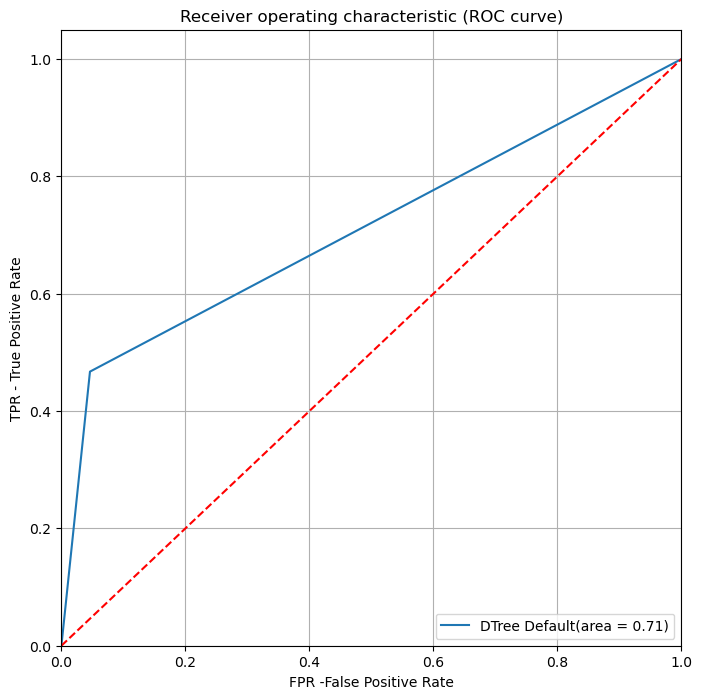

Area under curve is: 0.71
Recall for our model is: 0.47
Accuracy on test set is: 0.91
Confusion matrix for our model is: [[7888  381]
 [ 390  342]]


In [261]:
import sklearn.metrics as metrics 

# Plotting AUC curve
logit_roc_auc = metrics.roc_auc_score(y_test, y_pred_default)
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_default, drop_intermediate =True)
plt.figure(figsize=(8,8))
plt.plot(fpr, tpr, label='DTree Default(area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FPR -False Positive Rate')
plt.ylabel('TPR - True Positive Rate')
plt.title('Receiver operating characteristic (ROC curve)')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

print("Area under curve is:", round(metrics.roc_auc_score(y_test, y_pred_default),2))
print("Recall for our model is:" , round(metrics.recall_score(y_test, y_pred_default),2))
print("Accuracy on test set is:" , round(metrics.accuracy_score(y_test, y_pred_default),2))
print("Confusion matrix for our model is:" , metrics.confusion_matrix(y_test, y_pred_default))

**Hyperparameter Tuning**

The results of default tree are quite poor, and we need to improve it by tuning the hyperparameters.

`Tuning max_depth`

In [262]:

# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 10,1)}

# instantiate the model
dtree = DecisionTreeClassifier(random_state = 100, class_weight='balanced')

# fit tree on training data
tree = GridSearchCV(dtree, parameters,cv=n_folds,scoring="recall",return_train_score=True, n_jobs=-1, 
                    error_score = 'raise',verbose = 1)
tree.fit(X_train, y_train)
print(tree.best_score_)
print(tree.best_params_)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
0.8104199893673577
{'max_depth': 5}


In [263]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()



,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.206659,0.008303,0.015622,0.000000,1,{'max_depth': 1},0.633431,0.675439,0.666667,0.654971,0.719298,0.669961,0.028405,9,0.679094,0.670812,0.673007,0.674470,0.657644,0.671005,0.007211
1,0.469528,0.033078,0.018096,0.003410,2,{'max_depth': 2},0.774194,0.780702,0.766082,0.757310,0.804094,0.776476,0.015882,5,0.784357,0.782004,0.790783,0.779810,0.780541,0.783499,0.003959
2,0.765661,0.015811,0.011902,0.005422,3,{'max_depth': 3},0.706745,0.795322,0.789474,0.833333,0.868421,0.798659,0.054061,3,0.763158,0.796635,0.809802,0.866862,0.878566,0.823005,0.043501
3,1.039323,0.009462,0.014723,0.001842,4,{'max_depth': 4},0.744868,0.804094,0.792398,0.801170,0.801170,0.788740,0.022284,4,0.804825,0.803950,0.837601,0.837601,0.803219,0.817439,0.016470
4,1.291832,0.013962,0.015462,0.002237,5,{'max_depth': 5},0.818182,0.792398,0.830409,0.777778,0.833333,0.810420,0.021795,1,0.855994,0.840527,0.874177,0.865399,0.898317,0.866883,0.019270


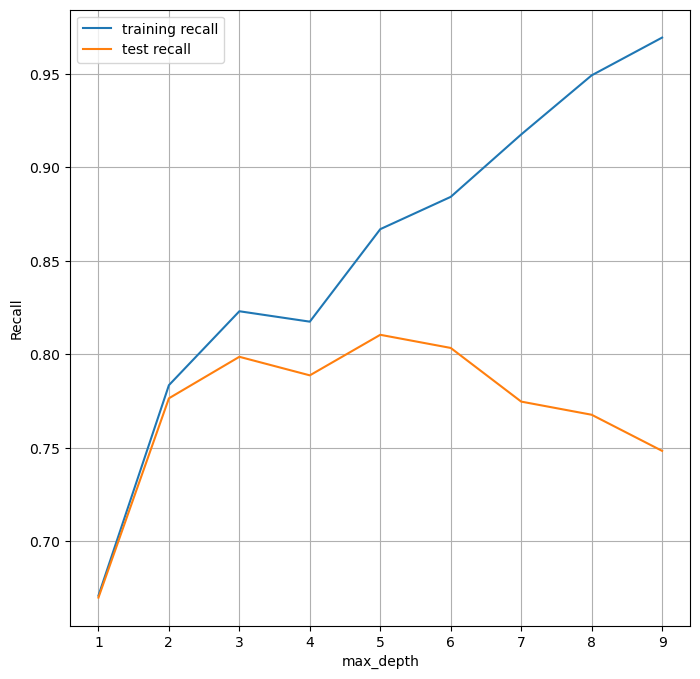

In [264]:
# plotting accuracies with max_depth
plt.figure(figsize=(8,8))
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.legend()
plt.grid(True)
plt.show()


<a> The model perfroms the best at max_depth = 5 and after that the increase in depth drops the accuracy on the test dataset.

`Tuning min_samples_leaf`

In [265]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 5)}

# instantiate the model
dtree = DecisionTreeClassifier(random_state = 100, class_weight='balanced')

# fit tree on training data
tree = GridSearchCV(dtree, parameters,cv=n_folds, 
                   scoring="recall", n_jobs = -1,return_train_score=True, verbose = 1)
tree.fit(X_train, y_train)
print(tree.best_score_)
print(tree.best_params_)


Fitting 5 folds for each of 39 candidates, totalling 195 fits
0.8244447874329028
{'min_samples_leaf': 120}


In [266]:
scores = tree.cv_results_
pd.DataFrame(scores).head()


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.817143,0.078475,0.017302,0.003116,5,{'min_samples_leaf': 5},0.615836,0.619883,0.654971,0.619883,0.640351,0.630185,0.015072,39,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
1,2.716876,0.142534,0.018341,0.010218,10,{'min_samples_leaf': 10},0.703812,0.722222,0.692982,0.690058,0.713450,0.704505,0.012132,38,0.989035,0.994148,0.991953,0.991222,0.991953,0.991662,0.001640
2,2.707715,0.093280,0.017703,0.005135,15,{'min_samples_leaf': 15},0.724340,0.754386,0.739766,0.716374,0.707602,0.728494,0.016722,37,0.973684,0.974396,0.970007,0.975128,0.978054,0.974254,0.002592
3,2.942798,0.206464,0.020300,0.008341,20,{'min_samples_leaf': 20},0.771261,0.760234,0.763158,0.742690,0.763158,0.760100,0.009449,36,0.972222,0.967813,0.968544,0.972933,0.975128,0.971328,0.002754
4,2.824840,0.261889,0.014255,0.007450,25,{'min_samples_leaf': 25},0.741935,0.786550,0.792398,0.751462,0.760234,0.766516,0.019705,35,0.941520,0.954645,0.954645,0.953914,0.950988,0.951142,0.004996


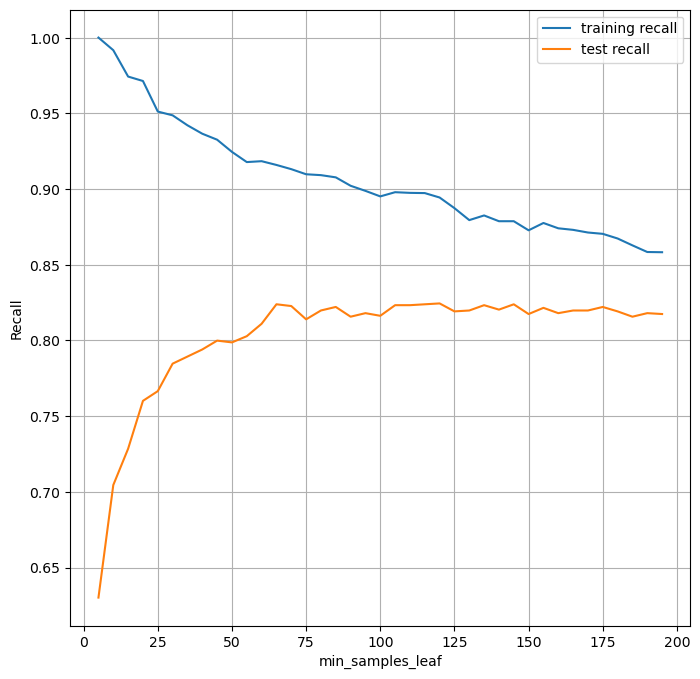

In [267]:
# plotting accuracies with min_samples_leaf
plt.figure(figsize = (8,8))
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.grid(True)
plt.show()

As seen from the above plot, accuracy of the model increases as min_samples_leaf increases. A steep increase from 0 to 115 and it kind of flattens rest of the way. 

`Tuning min_samples_split`

In [268]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(300,450,5)}

# instantiate the model
dtree = DecisionTreeClassifier(random_state = 100, class_weight='balanced')

# fit tree on training data
tree = GridSearchCV(dtree, parameters, return_train_score=True,
                    cv=n_folds, verbose=1,
                   scoring="recall",n_jobs=-1)
tree.fit(X_train, y_train)
print(tree.best_score_)
print(tree.best_params_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
0.8191936341342114
{'min_samples_split': 395}


In [269]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,3.172926,0.308594,0.022272,0.013797,300,{'min_samples_split': 300},0.797654,0.856725,0.812865,0.780702,0.815789,0.812747,0.025290,24,0.871345,0.911485,0.910753,0.910753,0.907827,0.902433,0.015595
1,3.055700,0.233676,0.019026,0.010864,305,{'min_samples_split': 305},0.803519,0.856725,0.812865,0.786550,0.815789,0.815090,0.023183,13,0.872807,0.911485,0.910753,0.912217,0.907827,0.903018,0.015179
2,3.093957,0.222225,0.026027,0.007320,310,{'min_samples_split': 310},0.803519,0.862573,0.812865,0.786550,0.815789,0.816259,0.025305,7,0.872807,0.916606,0.910753,0.912217,0.907827,0.904042,0.015872
3,2.722710,0.301602,0.015091,0.002075,315,{'min_samples_split': 315},0.803519,0.845029,0.812865,0.786550,0.815789,0.812751,0.019094,23,0.872807,0.899049,0.911485,0.912217,0.907827,0.900677,0.014700
4,2.531022,0.109140,0.013695,0.004655,320,{'min_samples_split': 320},0.806452,0.845029,0.812865,0.792398,0.807018,0.812752,0.017485,18,0.872807,0.899049,0.911485,0.912217,0.896123,0.898336,0.014302


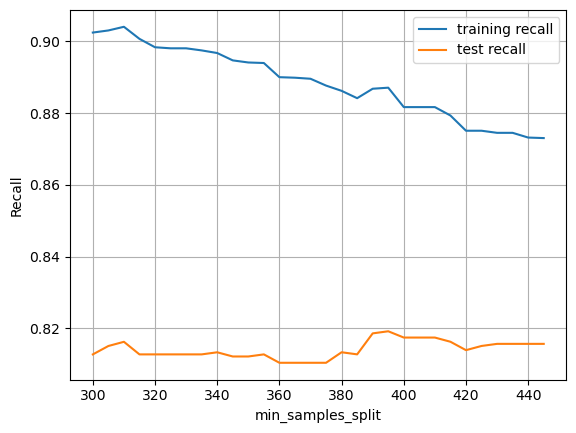

In [270]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.grid(True)
plt.show()


<a> The test accuracy of the model increases as the min_samples_split increases.

#### Grid Search to Find Optimal Hyperparameters

We can now use GridSearchCV to find multiple optimal hyperparameters together. Note that this time, we'll also specify the criterion (gini/entropy or IG).

In [271]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(3,10, 2),
    'min_samples_leaf': range(100, 125, 5),
    'min_samples_split': range(380,400,5),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(random_state = 100, class_weight='balanced')
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train,y_train)


Fitting 5 folds for each of 160 candidates, totalling 800 fits


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=100),
             n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': range(3, 10, 2),
                         'min_samples_leaf': range(100, 125, 5),
                         'min_samples_split': range(380, 400, 5)},
             verbose=1)

In [272]:
print(grid_search.best_score_)
print(grid_search.best_params_)

0.8519523809523809
{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 100, 'min_samples_split': 380}


In [273]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.989283,0.063240,0.011775,0.005811,entropy,3,100,380,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
1,1.047458,0.103178,0.016915,0.002865,entropy,3,100,385,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
2,1.098201,0.098265,0.013720,0.007630,entropy,3,100,390,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
3,1.054021,0.058734,0.010763,0.008740,entropy,3,100,395,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
4,1.027703,0.018588,0.007139,0.004485,entropy,3,105,380,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
5,1.076377,0.034701,0.011371,0.003610,entropy,3,105,385,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
6,1.060669,0.067984,0.012082,0.006333,entropy,3,105,390,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
7,0.989160,0.025638,0.008980,0.007064,entropy,3,105,395,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
8,0.973897,0.011218,0.013633,0.003827,entropy,3,110,380,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61
9,0.966498,0.020985,0.012088,0.008654,entropy,3,110,385,"{'criterion': 'entropy', 'max_depth': 3, 'min_...",0.854286,0.862381,0.851905,0.815714,0.792143,0.835286,0.026891,61


**Running the model with best parameters obtained from grid search.**

In [274]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "entropy", 
                                  random_state = 100,
                                  max_depth=grid_search.best_params_['max_depth'],
                                  min_samples_leaf=grid_search.best_params_['min_samples_leaf'],
                                  min_samples_split=grid_search.best_params_['min_samples_split'], class_weight='balanced')
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, min_samples_leaf=100, min_samples_split=380,
                       random_state=100)

In [275]:
# accuracy score
clf_gini.score(X_train,y_train)

0.8254285714285714

<a>The accuracy of the Decision Tree model on the train dataset is around 82%, which is really good for a model to be classified as a good model.

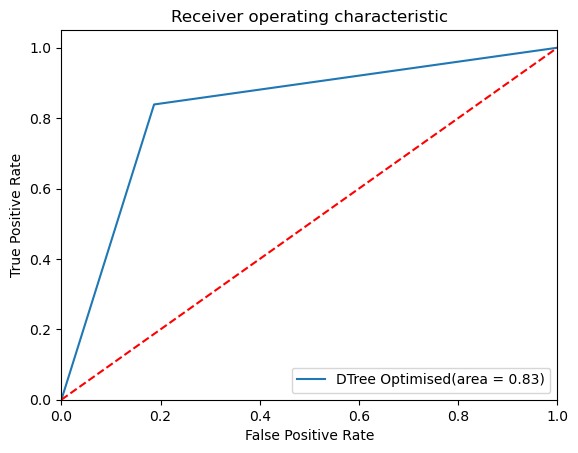

Area under curve is: 0.83
Recall for our model is: 0.84
Accuracy on test set is: 0.82
Confusion matrix for our model is: [[6724 1545]
 [ 118  614]]


In [276]:
# classification metrics

y_pred = clf_gini.predict(X_test)

logit_roc_auc = metrics.roc_auc_score(y_test, y_pred)
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
plt.figure()
plt.plot(fpr, tpr, label='DTree Optimised(area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

print("Area under curve is:", round(metrics.roc_auc_score(y_test, y_pred),2))
print("Recall for our model is:" , round(metrics.recall_score(y_test, y_pred),2))
print("Accuracy on test set is:" , round(metrics.accuracy_score(y_test, y_pred),2))
print("Confusion matrix for our model is:" , metrics.confusion_matrix(y_test, y_pred))

In [277]:
# accuracy score on training set

y_train_pred = clf_gini.predict(X_train)
y_train_pred = y_train_pred.reshape(-1,1)
print("Accuracy on train set is:" , round(metrics.accuracy_score(y_test, y_pred),2))

Accuracy on train set is: 0.82


In [278]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.81      0.89      8269
           1       0.28      0.84      0.42       732

    accuracy                           0.82      9001
   macro avg       0.63      0.83      0.66      9001
weighted avg       0.93      0.82      0.85      9001



In [279]:
# confusion matrix
cm = confusion_matrix(y_test,y_pred)
print(cm)

[[6724 1545]
 [ 118  614]]


In [280]:
speci = round((cm[0,0]/(cm[0,0]+cm[0,1])),2)
sensi = round((cm[1,1]/(cm[1,0]+cm[1,1])),2)

print('The specificity is:',speci)
print('The sensitivity is:',sensi)

The specificity is: 0.81
The sensitivity is: 0.84


 **<a>INFERENCE**<br>
<a> 
 - The accuracy of the Decision Tree model on the TEST dataset is 83% and train set is 82% , which is pretty good.<br>
 - The RECALL score for both Churn and Non-Churns is around 80%.<br>
 - specificity obtained is : 81%
 - sensitivity obtained is: 84%

From the above metrics, we can conclude that the above is a decent one.

<hr>

### MODEL 2 -  Random Forest

In [281]:
high_rf = high_df.copy()

In [282]:
# Putting response variable to y
y = high_rf.pop('churn')

# Putting feature variables to X
X = high_rf

In [283]:
print("Size of Feature variables dataset is:",X.shape)
print("Size of response variable dataset is:",y.shape)

Size of Feature variables dataset is: (30001, 106)
Size of response variable dataset is: (30001,)


In [284]:
# splitting the data into train & test
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.3, random_state=100, stratify = y)
X_train.head()

,cust_id,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,3g_vbc_8,3g_vbc_7,3g_vbc_6,total_data_rech_6,total_data_rech_7,total_data_rech_8,total_amt_6,total_amt_7,total_amt_8,rech_amt_good_yr,aon_yr,night_pck_user_6,night_pck_user_7,night_pck_user_8,fb_user_6,fb_user_7,fb_user_8
81898,81899,271.831,199.033,393.619,0.00,0.0,0.00,0.00,0.0,0.00,2.09,2.03,3.63,110.28,41.83,107.13,0.00,7.23,4.51,0.00,4.36,0.0,0.00,0.00,0.00,0.00,0.00,1.13,1.11,0.00,2.68,0.00,4.36,0.00,8.39,0.71,11.04,165.34,232.73,461.88,16.43,48.66,49.14,0.00,0.00,0.00,0.00,1.01,39.99,10.81,3.21,10.49,0.00,0.00,0.00,0.0,7,6,6,352,232,484,152,152,152,50,50,152,152.0,152.0,152.0,45.99,70.75,97.89,477.71,571.4,631.48,0,0,0,1,1,2,0,0,0,1,1,1,492.59,625.33,486.54,608.0,608.0,2256.0,960.0,840.0,2916.0,1800.0,7.8,1,1,1,2,2,2
33489,33490,337.141,348.726,285.105,52.16,0.0,0.00,45.79,0.0,0.00,6.04,40.09,83.24,6.99,41.51,70.38,0.00,1.35,2.03,0.00,10.19,0.0,87.28,244.01,61.04,29.13,64.48,61.96,0.00,0.00,0.00,1.36,22.36,1.19,12.94,44.38,18.59,16.71,26.13,39.46,0.00,1.93,12.31,7.79,0.61,2.38,0.91,2.31,3.34,0.00,0.00,0.00,0.25,0.00,0.00,0.0,11,8,6,392,471,307,110,128,130,110,67,67,25.0,56.0,23.0,219.97,248.88,2.54,0.00,0.0,0.00,0,0,0,3,1,1,0,0,0,1,0,0,0.00,0.00,0.00,400.0,56.0,23.0,792.0,527.0,330.0,1319.0,1.2,1,1,1,2,2,2
21296,21297,569.597,837.682,668.214,0.00,0.0,0.00,0.00,0.0,0.00,279.24,314.94,298.78,431.99,351.38,473.18,16.23,22.06,13.81,0.00,0.00,0.0,21.11,8.26,1.58,36.71,28.79,67.08,0.00,2.08,0.00,0.50,0.00,0.00,234.18,208.98,197.71,507.69,397.21,397.26,37.86,17.83,10.54,30.74,35.23,0.00,36.96,59.31,45.24,4.88,1.10,0.00,0.00,15.28,5.69,0.0,7,6,7,1064,706,925,339,339,440,252,0,252,0.0,0.0,179.0,0.00,0.00,613.02,0.00,0.0,279.66,0,0,0,0,0,1,0,0,1,0,0,0,359.82,984.93,551.99,0.0,0.0,404.0,1064.0,706.0,1329.0,1770.0,3.2,0,0,1,0,0,2
85765,85766,512.213,587.604,329.858,0.00,0.0,34.04,0.00,0.0,31.44,58.76,80.03,8.66,319.78,170.66,88.61,0.00,0.00,0.90,0.00,0.00,0.0,0.48,0.00,4.51,469.78,716.39,322.56,6.83,6.68,5.93,0.00,0.00,6.25,18.74,69.04,5.51,233.79,156.59,114.44,0.31,1.00,0.00,0.23,7.69,4.23,120.43,106.14,69.93,2.64,6.21,0.30,0.00,0.00,0.10,0.0,4,3,6,346,808,406,279,279,339,67,252,0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.0,0.0,0.0,346.0,808.0,406.0,1154.0,4.2,0,0,0,0,0,0
51152,51153,285.673,161.771,176.107,0.00,0.0,0.00,0.00,0.0,0.00,7.73,3.13,4.04,26.33,28.13,30.34,0.00,0.00,0.00,8.88,0.31,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.04,1.89,0.00,36.18,57.38,22.64,178.74,301.63,156.01,71.56,73.34,52.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.21,0.43,0.00,0.0,9,9,9,326,190,211,154,30,56,14,25,25,154.0,25.0,56.0,702.29,378.06,444.93,0.00,0.0,0.00,1,0,0,4,6,5,0,0



#### Default Hyperparameters
Let's first fit a random forest model with default hyperparameters.

In [285]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters
rfc = RandomForestClassifier(class_weight = 'balanced',random_state=100,n_jobs = -1)

# fit
rfc.fit(X_train,y_train)


RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=100)

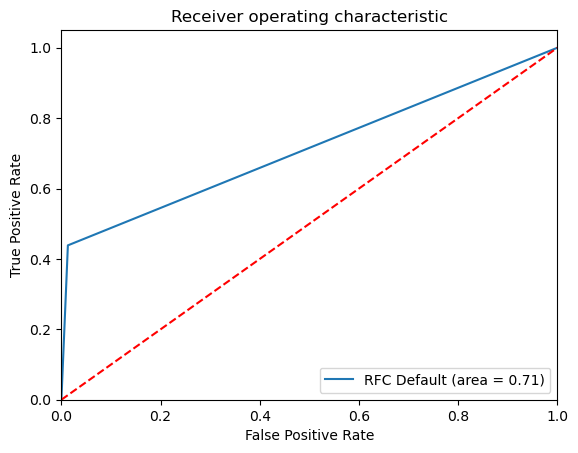

Area under curve is: 0.71
Recall for our model is: 0.44
Accuracy on test set is: 0.94
Confusion matrix for our model is: [[8161  108]
 [ 411  321]]


In [286]:
# Making Predictions
y_pred_default = rfc.predict(X_test)


logit_roc_auc = metrics.roc_auc_score(y_test, y_pred_default )
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_default )
plt.figure()
plt.plot(fpr, tpr, label='RFC Default (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

print("Area under curve is:", round(metrics.roc_auc_score(y_test, y_pred_default),2))
print("Recall for our model is:" , round(metrics.recall_score(y_test, y_pred_default),2))
print("Accuracy on test set is:" , round(metrics.accuracy_score(y_test, y_pred_default),2))
print("Confusion matrix for our model is:" , metrics.confusion_matrix(y_test, y_pred_default))

In [287]:
# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

# Let's check the report of our default model
print(classification_report(y_test,y_pred_default))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      8269
           1       0.75      0.44      0.55       732

    accuracy                           0.94      9001
   macro avg       0.85      0.71      0.76      9001
weighted avg       0.94      0.94      0.94      9001



In [288]:
# Printing confusion matrix
cm = confusion_matrix(y_test,y_pred_default)
print(cm)

[[8161  108]
 [ 411  321]]


In [289]:
speci = round((cm[0,0]/(cm[0,0]+cm[0,1])),2)
sensi = round((cm[1,1]/(cm[1,0]+cm[1,1])),2)

print('The specificity is:',speci)
print('The sensitivity is:',sensi)

The specificity is: 0.99
The sensitivity is: 0.44


In [290]:
print(accuracy_score(y_test,y_pred_default))

0.9423397400288857


The model does not do good. let's now look at the list of hyperparameters which we can tune to improve model performance.

**Hyperparameter Tuning**

The results of default tree are poor, and we need to improve it by tuning the hyperparameters.

`Tuning max_depth`

In [291]:
# parameters to build the model on
parameters = {'max_depth': range(2, 15, 1)}

# number of folds
n_folds = 5

# instantiate the model
rf = RandomForestClassifier(class_weight = 'balanced',random_state=0)


# fit tree on training data
rf = GridSearchCV(rf, parameters, return_train_score=True,cv=n_folds, n_jobs=-1,
                   scoring="recall",verbose = 1)
rf.fit(X_train, y_train)
print(rf.best_score_)
print(rf.best_params_)

Fitting 5 folds for each of 13 candidates, totalling 65 fits
0.7548112706007443
{'max_depth': 5}


In [292]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,4.549911,0.114801,0.128850,0.009612,2,{'max_depth': 2},0.665689,0.719298,0.695906,0.687135,0.733918,0.700389,0.024007,7,0.711988,0.706657,0.717630,0.711046,0.707388,0.710942,0.003920
1,5.927610,0.380745,0.098343,0.002985,3,{'max_depth': 3},0.703812,0.769006,0.716374,0.713450,0.760234,0.732575,0.026637,4,0.745614,0.741039,0.752012,0.734455,0.747623,0.744148,0.005995
2,8.145830,0.541521,0.134336,0.033315,4,{'max_depth': 4},0.706745,0.786550,0.733918,0.736842,0.789474,0.750706,0.032231,2,0.780702,0.768837,0.787125,0.773958,0.773226,0.776769,0.006420
3,9.414730,0.447246,0.121271,0.006604,5,{'max_depth': 5},0.727273,0.786550,0.736842,0.733918,0.789474,0.754811,0.027301,1,0.804094,0.798830,0.810534,0.802487,0.811266,0.805442,0.004777
4,11.273986,0.412353,0.113130,0.007022,6,{'max_depth': 6},0.736070,0.771930,0.722222,0.733918,0.774854,0.747799,0.021441,3,0.822368,0.825165,0.831748,0.820775,0.828091,0.825629,0.003947


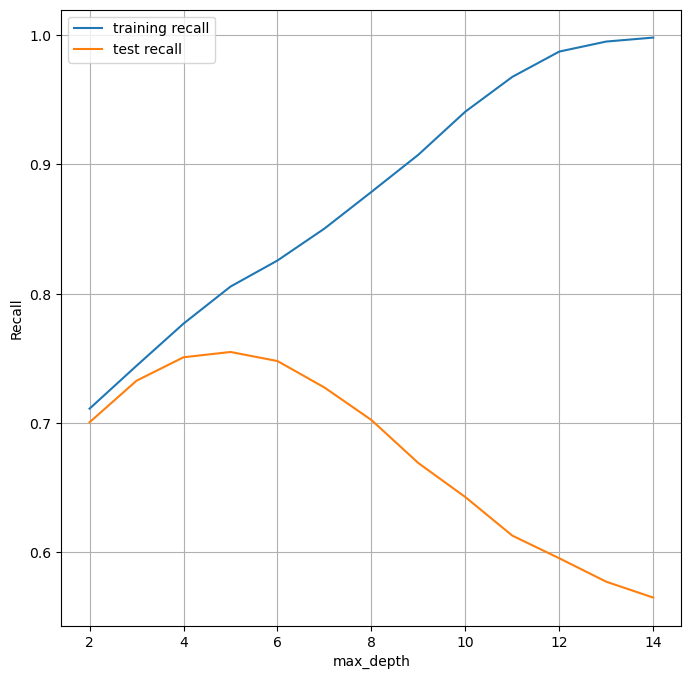

In [293]:
# plotting accuracies with max_depth
plt.figure(figsize=(8,8))
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_depth")
plt.ylabel("Recall")
plt.grid(True)
plt.legend()
plt.show()


<a> We observe that with increase in the value of max_depth, both train and test scores increase till a point, but after that test score starts to decrease. The ensemble tries to overfit as we increase the max_depth. The model perfroms the best at max_depth = 5 and after that the increase in depth drops the accuracy on the test dataset.

`Tuning n_estimators`

Let's try to find the optimum values for n_estimators and understand how the value of n_estimators impacts the overall accuracy. We'll specify an appropriately low value of max_depth, so that the trees do not overfit.
<br>


In [294]:
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': [10,25,50,75,100]}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(random_state = 100,class_weight='balanced')


# fit tree on training data
rf = GridSearchCV(rf, parameters,cv=n_folds, verbose=1,scoring="recall",return_train_score = True, 
                  n_jobs=-1)
rf.fit(X_train, y_train)
print(rf.best_score_)
print(rf.best_params_)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
0.45230231002726756
{'n_estimators': 75}


In [295]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.785066,0.031101,0.033117,0.004666,10,{'n_estimators': 10},0.407625,0.418129,0.415205,0.380117,0.432749,0.410765,0.017357,5,0.921053,0.921726,0.927579,0.918800,0.912948,0.920421,0.004729
1,4.926746,0.378041,0.072256,0.019953,25,{'n_estimators': 25},0.416422,0.467836,0.435673,0.432749,0.479532,0.446442,0.023483,2,0.989766,0.991222,0.987564,0.985369,0.984638,0.987712,0.002510
2,10.034326,0.610109,0.092374,0.008052,50,{'n_estimators': 50},0.428152,0.473684,0.432749,0.426901,0.456140,0.443525,0.018426,4,0.995614,0.998537,0.996342,0.996342,0.993416,0.996050,0.001642
3,16.224765,0.908508,0.128400,0.005692,75,{'n_estimators': 75},0.436950,0.488304,0.423977,0.438596,0.473684,0.452302,0.024410,1,0.998538,0.998537,0.999268,0.998537,0.998537,0.998683,0.000293
4,15.470846,2.130639,0.107812,0.025422,100,{'n_estimators': 100},0.416422,0.464912,0.426901,0.441520,0.473684,0.444688,0.021795,3,0.999269,1.000000,1.000000,0.999268,0.998537,0.999415,0.000547


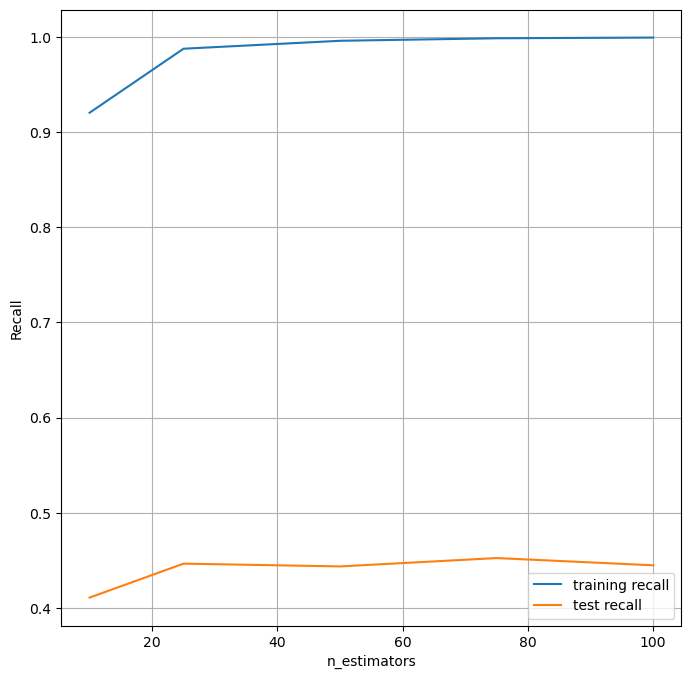

In [296]:
# plotting accuracies with n_estimators
plt.figure(figsize=(8,8))
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("n_estimators")
plt.ylabel("Recall")
plt.legend()
plt.grid(True)
plt.show()


`Tuning min_samples_split`

Let's now look at the performance of the ensemble as we vary min_samples_split.

In [297]:
# specify number of folds for k-fold CV
n_folds = 3

# parameters to build the model on
parameters = {"min_samples_split": range(100,200,10)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight = 'balanced',random_state=0)

# fit tree on training data
rf = GridSearchCV(rf, parameters, n_jobs = -1,cv=n_folds, verbose = 1,
                   scoring="recall",return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


GridSearchCV(cv=3,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=0),
             n_jobs=-1, param_grid={'min_samples_split': range(100, 200, 10)},
             return_train_score=True, scoring='recall', verbose=1)

In [298]:
print(rf.best_score_)
print(rf.best_params_)

0.7753039599584786
{'min_samples_split': 190}


In [299]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,14.450385,0.526991,0.288093,0.056825,100,{'min_samples_split': 100},0.713533,0.724561,0.761404,0.733166,0.020468,10,0.880702,0.878841,0.878841,0.879461,0.000877
1,14.005400,0.657843,0.251083,0.012106,110,{'min_samples_split': 110},0.731107,0.733333,0.778947,0.747796,0.022046,9,0.881579,0.875329,0.875329,0.877412,0.002946
2,14.111051,0.693762,0.297904,0.078486,120,{'min_samples_split': 120},0.736380,0.731579,0.778947,0.748969,0.021289,8,0.862281,0.870061,0.870061,0.867468,0.003668
3,14.007074,0.173735,0.236645,0.023908,130,{'min_samples_split': 130},0.759227,0.733333,0.780702,0.757754,0.019366,6,0.866667,0.867428,0.872695,0.868930,0.002681
4,13.605235,0.322009,0.251446,0.023930,140,{'min_samples_split': 140},0.752197,0.733333,0.784211,0.756580,0.021001,7,0.862281,0.867428,0.858648,0.862785,0.003602


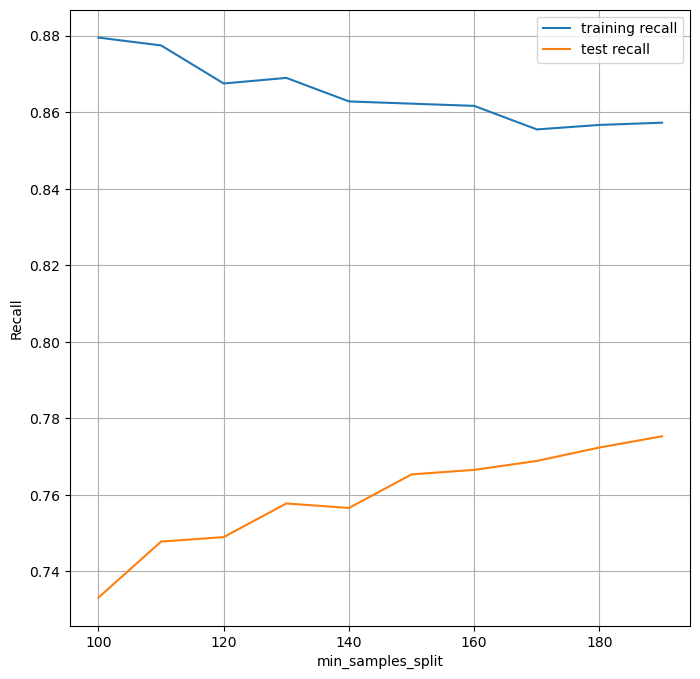

In [300]:
# plotting accuracies with min_samples_split
plt.figure(figsize=(8,8))
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_split")
plt.ylabel("Recall")
plt.legend()
plt.grid(True)
plt.show()

`Tuning min_samples_leaf`

In [301]:
# specify number of folds for k-fold CV
n_folds = 3

# parameters to build the model on
parameters = {"min_samples_leaf": range(1,200,20)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(class_weight = 'balanced',random_state=0)

# fit tree on training data
rf = GridSearchCV(rf, parameters, n_jobs = -1,cv=n_folds, verbose = 1,
                   scoring="recall",return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


GridSearchCV(cv=3,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=0),
             n_jobs=-1, param_grid={'min_samples_leaf': range(1, 200, 20)},
             return_train_score=True, scoring='recall', verbose=1)

In [302]:
print(rf.best_score_)
print(rf.best_params_)

0.7905199436787634
{'min_samples_leaf': 181}


In [303]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,15.429145,0.118807,0.283651,0.011631,1,{'min_samples_leaf': 1},0.423550,0.408772,0.466667,0.432996,0.024561,10,1.000000,1.000000,1.000000,1.000000,0.000000
1,12.881910,0.101383,0.229653,0.002305,21,{'min_samples_leaf': 21},0.704745,0.712281,0.759649,0.725558,0.024301,9,0.891228,0.888499,0.896400,0.892042,0.003277
2,11.992652,0.359741,0.232361,0.003539,41,{'min_samples_leaf': 41},0.755712,0.735088,0.785965,0.758921,0.020894,8,0.867544,0.856892,0.862160,0.862199,0.004349
3,11.840375,0.316762,0.211632,0.001916,61,{'min_samples_leaf': 61},0.775044,0.756140,0.796491,0.775892,0.016484,7,0.844737,0.846356,0.849868,0.846987,0.002142
4,11.262038,0.285278,0.196986,0.004447,81,{'min_samples_leaf': 81},0.787346,0.754386,0.796491,0.779408,0.018083,6,0.839474,0.842845,0.838455,0.840258,0.001876


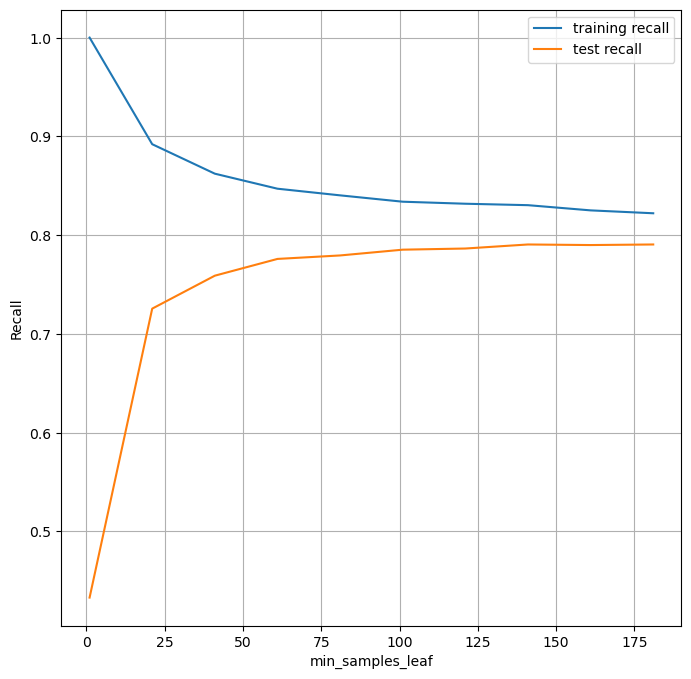

In [304]:
# plotting accuracies with min_samples_split
plt.figure(figsize=(8,8))
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("min_samples_leaf")
plt.ylabel("Recall")
plt.legend()
plt.grid(True)
plt.show()

As seen from the above plot, recall of the model increases as min_samples_leaf increases. A steep increase is observed from 0 to 25. The curve flattens after min_samples_leaf = 125. So let us choose this as our Optimal minimum number of samples leaf.

`Tuning max_features`

Let's see how the model performance varies with `max_features`, which is the maximum number of features considered for splitting at a node.

In [305]:
# specify number of folds for k-fold CV
n_folds = 3

# parameters to build the model on
parameters = {'max_features': [25,50,75]}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=4, class_weight = 'balanced',random_state=100)

# fit tree on training data
rf = GridSearchCV(rf, parameters, n_jobs  = -1,cv=n_folds, verbose = 1,
                   scoring="recall",return_train_score=True)
rf.fit(X_train, y_train)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


GridSearchCV(cv=3,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              max_depth=4, random_state=100),
             n_jobs=-1, param_grid={'max_features': [25, 50, 75]},
             return_train_score=True, scoring='recall', verbose=1)

In [306]:
print(rf.best_score_)
print(rf.best_params_)

0.7969526922167751
{'max_features': 75}


In [307]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,14.576673,0.294186,0.148318,0.006679,25,{'max_features': 25},0.759227,0.759649,0.805263,0.774713,0.021603,3,0.793860,0.811238,0.826163,0.810420,0.013201
1,25.896819,0.237366,0.108546,0.007692,50,{'max_features': 50},0.780316,0.784211,0.821053,0.795193,0.018354,2,0.802632,0.841967,0.851624,0.832074,0.021189
2,30.664599,4.008729,0.069933,0.011862,75,{'max_features': 75},0.789104,0.777193,0.824561,0.796953,0.020119,1,0.814912,0.838455,0.857770,0.837046,0.017525


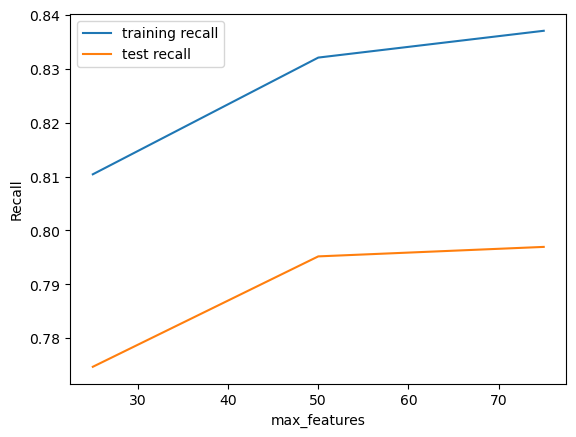

In [308]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training recall")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test recall")
plt.xlabel("max_features")
plt.ylabel("Recall")
plt.legend()
plt.show()


Apparently, the training and test scores *both* seem to increase as we increase max_features, and the model doesn't seem to overfit more with increasing max_features.

#### **Grid Search to Find Optimal Hyperparameters**

We can now find the optimal hyperparameters using GridSearchCV.

In [309]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [8,8,10],
    'min_samples_split': [170,190,200], 'min_samples_leaf': [120,130,140] }

# Create a based model
rf = RandomForestClassifier(class_weight = 'balanced',random_state=100)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1,return_train_score=True)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)
print(grid_search.best_score_)
print(grid_search.best_params_)

Fitting 3 folds for each of 27 candidates, totalling 81 fits
0.8883333333333333
{'max_depth': 8, 'min_samples_leaf': 120, 'min_samples_split': 170}


In [310]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.8883333333333333 using {'max_depth': 8, 'min_samples_leaf': 120, 'min_samples_split': 170}


**Fitting the final model with the best parameters obtained from grid search.**

In [311]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,random_state=100,
                             max_depth=grid_search.best_params_['max_depth'],
                             min_samples_split=grid_search.best_params_['min_samples_split'],
                              class_weight='balanced')

In [312]:
# fit
rfc.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced', max_depth=8,
                       min_samples_split=170, random_state=100)

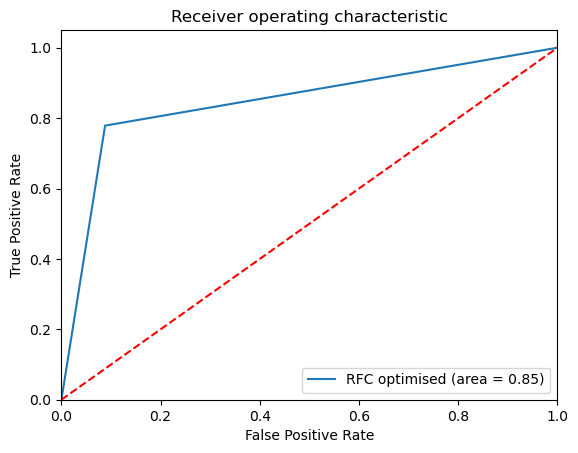

Area under curve is: 0.85
Recall for our model is: 0.78
Accuracy on test set is: 0.9
Confusion matrix for our model is: [[7541  728]
 [ 162  570]]


In [313]:
# predict
predictions = rfc.predict(X_test)

# Plotting ROC
logit_roc_auc = metrics.roc_auc_score(y_test, predictions)
fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions)
plt.figure()
plt.plot(fpr, tpr, label='RFC optimised (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

print("Area under curve is:", round(metrics.roc_auc_score(y_test, predictions),2))
print("Recall for our model is:" , round(metrics.recall_score(y_test, predictions),2))
print("Accuracy on test set is:" , round(metrics.accuracy_score(y_test, predictions),2))
print("Confusion matrix for our model is:" , metrics.confusion_matrix(y_test, predictions))

In [314]:
# accuracy score on training set

y_train_pred = rfc.predict(X_train)
y_train_pred = y_train_pred.reshape(-1,1)
print("Accuracy on train set is:" , round(metrics.accuracy_score(y_test, y_pred),2))

Accuracy on train set is: 0.82


In [315]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      0.91      0.94      8269
           1       0.44      0.78      0.56       732

    accuracy                           0.90      9001
   macro avg       0.71      0.85      0.75      9001
weighted avg       0.94      0.90      0.91      9001



In [316]:
# confusion matrix
cm = confusion_matrix(y_test,predictions)
print(cm)

[[7541  728]
 [ 162  570]]


In [317]:
speci = cm[0,0]/(cm[0,0]+cm[0,1])
sensi = cm[1,1]/(cm[1,0]+cm[1,1])

print('The specificity is:',speci)
print('The sensitivity is:',sensi)

The specificity is: 0.9119603337767566
The sensitivity is: 0.7786885245901639


 **<a>INFERENCE**<br>
<a> 
 - The accuracy of the Random Forest Tree model on the TEST dataset is 85% % training dataset is 82%, which is pretty good for a model.<br>
 - The RECALL score for Churn is 78% and Non-Churns is around 91%.<br>
 - specificity obtained is : 91%
 - sensitivity obtained is: 78%

From the above metrics, we can conclude that the above model performs well.

--------------------------

## 3) MODEL SUMMARY

In our case study we have chosen `Recall` as the Performace measure because it is more important to predict the customers who are more likely to churn rather than accuracy.

In [318]:
model_stats = pd.DataFrame(
    {'model':['DTree - Default Param','DTree - Tuned Param','RFC - Default Param','RFC - Tuned Param'],
                      
    'Recall':       [0.48,0.84,0.43,0.78],
    'Test accuracy':     [0.92,0.82,0.94,0.85],
    'Roc_auc_score':[0.71,0.83,0.71,0.85],
    })

model_stats.sort_values(by=['Recall','Test accuracy','Roc_auc_score'],ascending=False)

,model,Recall,Test accuracy,Roc_auc_score
1,DTree - Tuned Param,0.84,0.82,0.83
3,RFC - Tuned Param,0.78,0.85,0.85
0,DTree - Default Param,0.48,0.92,0.71
2,RFC - Default Param,0.43,0.94,0.71


<a> `Decision tree with tuned hyperparameters` outperforms all the other models in terms of `recall` and has a pretty `decent accuracy and AUC score`. Let us choose this model to find out the most important features affecting churn.

In [319]:
features = clf_gini.feature_importances_
cols = X.iloc[:,sorted(range(len(features)), key=lambda i: features[i])[-10:]].columns
cols


Index(['arpu_7', 'max_rech_amt_6', 'std_og_t2m_mou_8', 'loc_og_t2m_mou_8',
       'max_rech_data_8', 'last_day_rch_amt_8', 'total_data_rech_8',
       'total_amt_8', 'roam_og_mou_8', 'loc_ic_t2m_mou_8'],
      dtype='object')

In [320]:
# plotting the tree
from six import StringIO

dot_data = StringIO()  
features = X.columns
export_graphviz(clf_gini, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph[0].create_png())

NameError: name 'pydot' is not defined

-----------------------------

# 4) **Strategies to be incorporated:**<br>
    
1. In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. <br>
2. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.<br>
3. In order to manage High Value Customer Churn, we have predicted customers that are more likely to churn and the factors that influence the high churn.<br>
4. From the exploratory analysis, we observed that there is considerable drop in recharge, call usage and data usage in the 8th month which is the  `Action Phase`. From the list of important predictors affecting the churn, this is again evident as follows:<br>
  - 'arpu_7', 
  - 'max_rech_amt_6', 
  - 'std_og_t2m_mou_8', 
  - 'loc_og_t2m_mou_8',
  - 'max_rech_data_8', 
  - 'last_day_rch_amt_8', 
  - 'total_data_rech_8',
  - 'total_amt_8', 
  - 'roam_og_mou_8', 
  - 'loc_ic_t2m_mou_8'
  <br>
  
5. Average revenue per user in the `7th month` plays a vital role in deciding churn. A sudden drop in it might indicate that the customer might be thinking about churning and appropriate actions should be taken.<br>
6. Local & STD Minutes of usage (incoming & outgoing) are the most affecting features on the customer churn.<br>
7. Lastday of recharge amount in the action phase also plays a crucial role in determing churn.
8. The maximum rcharge for calling data by a client in the 6th Month and 8th Month should be carefully focussed as the 6th month indicates the begining of the good phase and 8th month indicates the action phase.<br>
9. Last day of recharge in the 8th month, the total recharge for data done in the 8th month and the total amount spent on calls and data by clients in 8th month also play crucial role in indicating churn.
10. Outgoing roaming calls made by clients in the 8th month also play key role in indicating churn.

Following strategies can be incorporated :<br>

 - Sudden drop in Local & STD Minutes of usage might be because of the unsatisfactory customer service or because of poor network or unsuitable customer schemes/plans. Efforts shall be made to provide better network and focus on customer satisfaction.
 - Customised plans should be provided to such customers to stop them from churning.
 - Based on the usage / last recharge, routine feedback calls to understand the customer satisfaction regarding services can be made to understand their grievances & expectations. Appropriate action should be taken to avoid them rom churning.
 - Various attractive offers can be introduced to customers showing sudden drop in total amount spent on calls & data recharge in the action phase  to lure them.
 - Promotional offers can also be very helpful